##Predictive Analytics for Car Prices

###IMPORTING PACKAGES

In [42]:
import sklearn
print(sklearn.__version__)


1.5.2


In [43]:
!pip install --upgrade scikit-learn


In [44]:
!pip install --upgrade category_encoders -q
!pip install -q shap
!pip install --upgrade shap==0.44.1 -q
import shap
shap.initjs()

In [45]:
import sklearn
sklearn.set_config(transform_output="pandas")

%config InlineBackend.figure_format = 'retina'
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(
    { "figure.figsize": (6, 4) }, style='ticks', color_codes=True, font_scale=0.8
)

from sklearn.model_selection import train_test_split, cross_validate, cross_val_score
from sklearn.model_selection import GridSearchCV, ParameterGrid, RandomizedSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from category_encoders import TargetEncoder
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures

from sklearn.ensemble import HistGradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression

from sklearn.inspection import PartialDependenceDisplay, partial_dependence
from sklearn.metrics import mean_absolute_error

import shap
shap.initjs()

##LOADING THE DATASET

In [46]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [47]:
file_path = '/content/drive/MyDrive/Coursework/adverts (AML).csv'
autos = pd.read_csv(file_path)

In [48]:
from IPython.display import display, Markdown
display(Markdown("### Glimpse Of The Dataset:"))
autos.head().style.set_properties(**{
    "background-color": "#8B4513",
    "color": "white",
    "border": "1.5px solid black"
})

### Glimpse Of The Dataset:

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.000000,nan,Grey,Volvo,XC90,NEW,nan,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.000000,61,Blue,Jaguar,XF,USED,2011.000000,7000,Saloon,False,Diesel
2,202007020778474,7800.000000,17,Grey,SKODA,Yeti,USED,2017.000000,14000,SUV,False,Petrol
3,202007080986776,45000.000000,16,Brown,Vauxhall,Mokka,USED,2016.000000,7995,Hatchback,False,Diesel
4,202007161321269,64000.000000,64,Grey,Land Rover,Range Rover Sport,USED,2015.000000,26995,SUV,False,Diesel


In [49]:
autos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


In [50]:
autos.shape

(402005, 12)

**Renaming the column**

In [51]:
autos= autos.set_axis([
    'public_ref', 'mileage', 'reg_code', 'colour',
    'make', 'model', 'vehicle_condition', 'year_of_reg',
    'price', 'body_type', 'crossover_car_and_van', 'fuel_type'
], axis='columns')

In [52]:
autos.describe()

,public_ref,mileage,year_of_reg,price
count,4.020050e+05,401878.000000,368694.000000,4.020050e+05
mean,2.020071e+14,37743.595656,2015.006206,1.734197e+04
std,1.691662e+10,34831.724018,7.962667,4.643746e+04
min,2.013072e+14,0.000000,999.000000,1.200000e+02
25%,2.020090e+14,10481.000000,2013.000000,7.495000e+03
50%,2.020093e+14,28629.500000,2016.000000,1.260000e+04
75%,2.020102e+14,56875.750000,2018.000000,2.000000e+04
max,2.020110e+14,999999.000000,2020.000000,9.999999e+06


In [53]:
# Explore numerical features
numeric_features = [ 'mileage', 'year_of_reg']


In [54]:
categorical_features =['colour',
    'make', 'model', 'vehicle_condition',
    'body_type', 'crossover_car_and_van', 'fuel_type']

In [55]:
#Detecting incorrect Values
used_cars_with_zero_mileage= autos[(autos['mileage'] == 0.0) & (autos['vehicle_condition'] == 'USED')]
used_cars_with_zero_mileage.head(10)

,public_ref,mileage,reg_code,colour,make,model,vehicle_condition,year_of_reg,price,body_type,crossover_car_and_van,fuel_type
810,202009254208702,0.0,70,Grey,Land Rover,Range Rover Velar,USED,2020.0,52995,SUV,False,Diesel
1656,202011015669636,0.0,13,Silver,Vauxhall,Insignia,USED,2013.0,2975,Hatchback,False,Diesel
1855,202010014447366,0.0,70,Grey,Mercedes-Benz,CLA Class,USED,2020.0,34995,Estate,False,Petrol
2201,202009304376426,0.0,70,Black,Land Rover,Range Rover,USED,2020.0,82750,SUV,False,Diesel
2754,202008283030532,0.0,63,Black,Audi,A1,USED,2013.0,8000,Hatchback,False,Diesel
3541,202009244132959,0.0,70,Blue,Volkswagen,Golf,USED,2020.0,22000,Hatchback,False,Diesel
5712,202010315640207,0.0,70,White,Renault,Clio,USED,2020.0,13995,Hatchback,False,Petrol
8650,202010295556496,0.0,69,Black,Fiat,500X,USED,2019.0,13500,SUV,False,Petrol
8677,201704033991344,0.0,D,Red,Porsche,911,USED,1987.0,89995,Convertible,False,Petrol
10435,202009103560672,0.0,70,Black,Volkswagen,Polo,USED,2020.0,16290,Hatchback,False,Petrol


In [56]:
#replacing mileage with null vaules
autos.loc[(autos['mileage'] == 0.0) & (autos['vehicle_condition'] == 'USED'), 'mileage'] = pd.NA

In [57]:
autos.loc[autos['year_of_reg'] < 1904, 'year_of_reg'] = pd.NA

**Replaced missinig values using mean and mode**

In [58]:
autos.isnull().sum()

,0
public_ref,0
mileage,482
reg_code,31857
colour,5378
make,0
model,0
vehicle_condition,0
year_of_reg,33328
price,0
body_type,837


In [60]:
autos['year_of_reg'].fillna(autos['year_of_reg'].mode()[0])
# Calculate the mean mileage by grouping by year of reg and  vehicle condition
mean_mileage_by_group = autos.groupby(['year_of_reg', 'vehicle_condition'])['mileage'].transform('mean')
# Replace the missing values for mileage with the mean mileage
autos['mileage'].fillna(mean_mileage_by_group)

,mileage
0,0.0
1,108230.0
2,7800.0
3,45000.0
4,64000.0
...,...
402000,5179.0
402001,110000.0
402002,52760.0
402003,10250.0


In [61]:
autos.isnull().sum()

,0
public_ref,0
mileage,0
reg_code,31857
colour,5378
make,0
model,0
vehicle_condition,0
year_of_reg,0
price,0
body_type,837


In [62]:
from IPython.display import display, Markdown
display(Markdown("### Glimpse Of The Dataset:"))
autos.head().style.set_properties(**{
    "background-color": "#8B4513",
    "color": "white",
    "border": "1.5px solid black"
})

### Glimpse Of The Dataset:

,public_ref,mileage,reg_code,colour,make,model,vehicle_condition,year_of_reg,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.000000,nan,Grey,Volvo,XC90,NEW,2017.000000,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.000000,61,Blue,Jaguar,XF,USED,2011.000000,7000,Saloon,False,Diesel
2,202007020778474,7800.000000,17,Grey,SKODA,Yeti,USED,2017.000000,14000,SUV,False,Petrol
3,202007080986776,45000.000000,16,Brown,Vauxhall,Mokka,USED,2016.000000,7995,Hatchback,False,Diesel
4,202007161321269,64000.000000,64,Grey,Land Rover,Range Rover Sport,USED,2015.000000,26995,SUV,False,Diesel


###Feature Engineering
**Age was dervied from year of registration and year was dropped**

In [63]:
from datetime import datetime

current_year = datetime.now().year
autos['age'] = current_year - autos['year_of_reg'].astype(int)

In [66]:
autos

,public_ref,mileage,reg_code,colour,make,model,vehicle_condition,year_of_reg,price,body_type,crossover_car_and_van,fuel_type,age
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,2017.0,73970,SUV,False,Petrol Plug-in Hybrid,7
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel,13
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol,7
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel,8
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...
402000,202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019.0,10595,Hatchback,False,Petrol,5
402001,202010315657341,110000.0,59,Red,Peugeot,107,USED,2009.0,2000,Hatchback,False,Petrol,15
402002,202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012.0,7250,SUV,False,Petrol,12
402003,202011015662436,10250.0,65,Red,Abarth,595,USED,2015.0,11490,Hatchback,False,Petrol,9


In [65]:
from IPython.display import display, Markdown
display(Markdown("### Glimpse Of The Dataset:"))
autos.head().style.set_properties(**{
    "background-color": "#8B4513",
    "color": "white",
    "border": "1.5px solid black"
})

### Glimpse Of The Dataset:

,public_ref,mileage,reg_code,colour,make,model,vehicle_condition,year_of_reg,price,body_type,crossover_car_and_van,fuel_type,age
0,202006039777689,0.000000,nan,Grey,Volvo,XC90,NEW,2017.000000,73970,SUV,False,Petrol Plug-in Hybrid,7
1,202007020778260,108230.000000,61,Blue,Jaguar,XF,USED,2011.000000,7000,Saloon,False,Diesel,13
2,202007020778474,7800.000000,17,Grey,SKODA,Yeti,USED,2017.000000,14000,SUV,False,Petrol,7
3,202007080986776,45000.000000,16,Brown,Vauxhall,Mokka,USED,2016.000000,7995,Hatchback,False,Diesel,8
4,202007161321269,64000.000000,64,Grey,Land Rover,Range Rover Sport,USED,2015.000000,26995,SUV,False,Diesel,9


In [67]:
# Drop the 'year_of_reg' column as it's no longer needed
autos.drop('year_of_reg', axis=1, inplace=True)

In [68]:
autos

,public_ref,mileage,reg_code,colour,make,model,vehicle_condition,price,body_type,crossover_car_and_van,fuel_type,age
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,73970,SUV,False,Petrol Plug-in Hybrid,7
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,7000,Saloon,False,Diesel,13
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,14000,SUV,False,Petrol,7
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,7995,Hatchback,False,Diesel,8
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,26995,SUV,False,Diesel,9
...,...,...,...,...,...,...,...,...,...,...,...,...
402000,202010315652942,5179.0,69,Grey,Peugeot,208,USED,10595,Hatchback,False,Petrol,5
402001,202010315657341,110000.0,59,Red,Peugeot,107,USED,2000,Hatchback,False,Petrol,15
402002,202010315659271,52760.0,62,White,Nissan,Qashqai,USED,7250,SUV,False,Petrol,12
402003,202011015662436,10250.0,65,Red,Abarth,595,USED,11490,Hatchback,False,Petrol,9


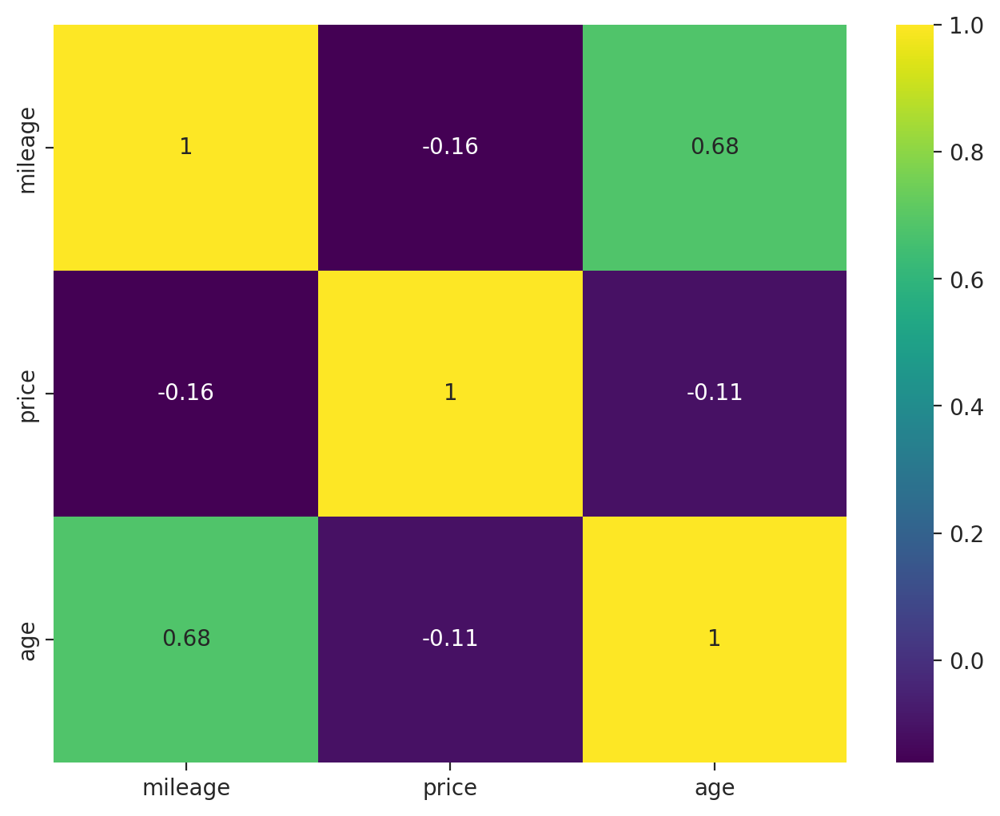

In [ ]:
# Define the features you want to correlate
features_to_corr = ['mileage', 'price', 'age']

# Calculate the correlation matrix for the desired features
correlation_matrix = autos[features_to_corr].corr()

# Create the heatmap
plt.subplots(figsize=(8, 6))
sns.heatmap(correlation_matrix, cmap="viridis", annot=True)
plt.show()

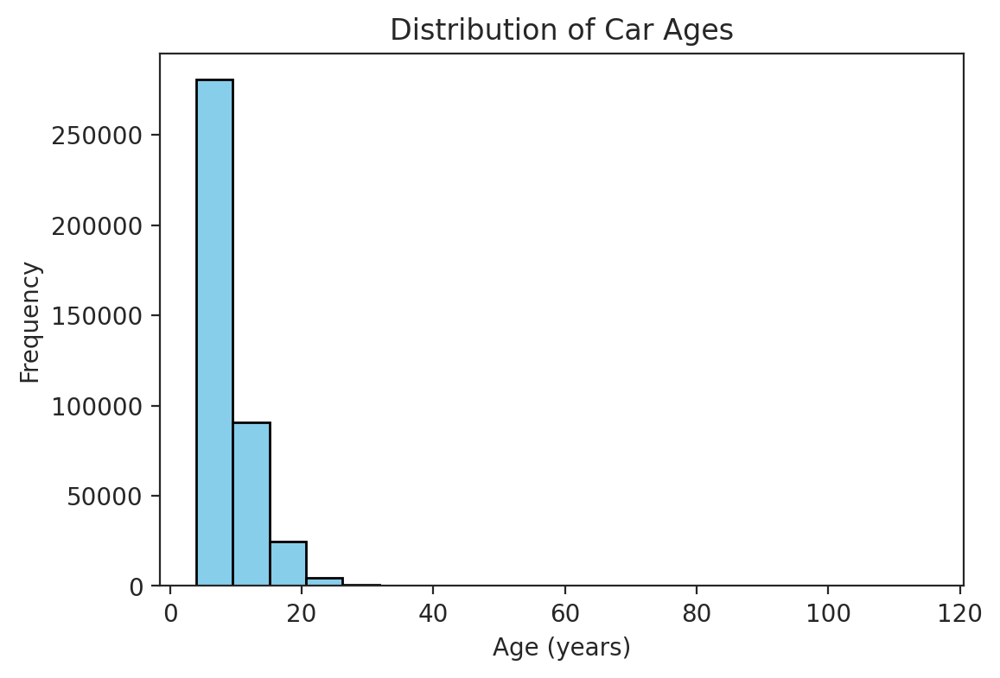

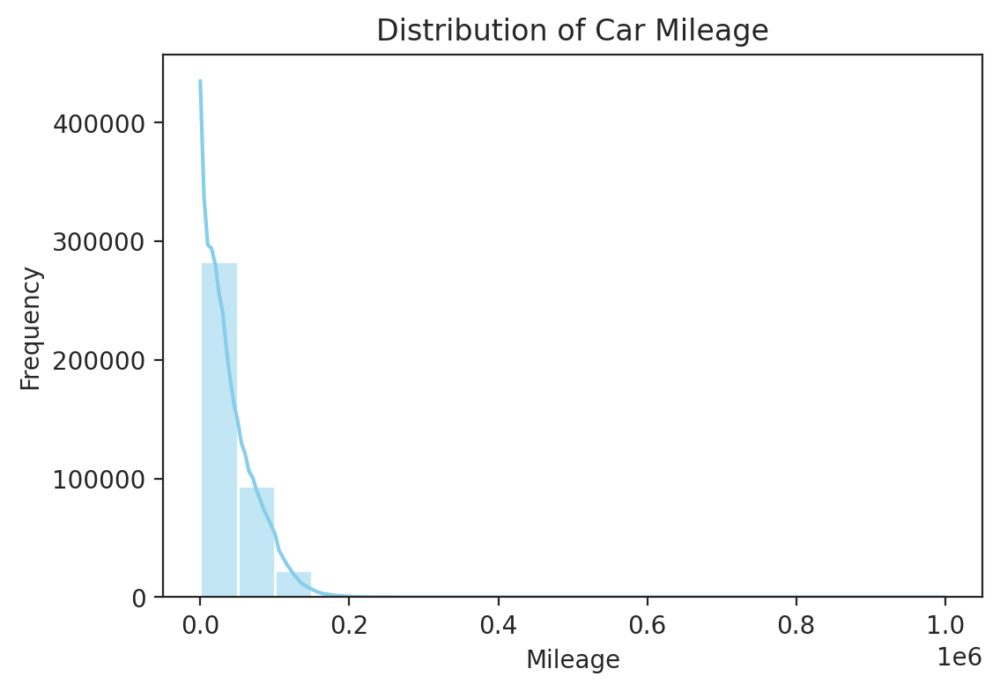

In [ ]:
plt.hist(autos['age'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Car Ages')
plt.xlabel('Age (years)')
plt.ylabel('Frequency')
plt.show()

sns.histplot(autos['mileage'], bins=20, kde=True, color='skyblue')
plt.title('Distribution of Car Mileage')
plt.xlabel('Mileage')
plt.ylabel('Frequency')
plt.show()


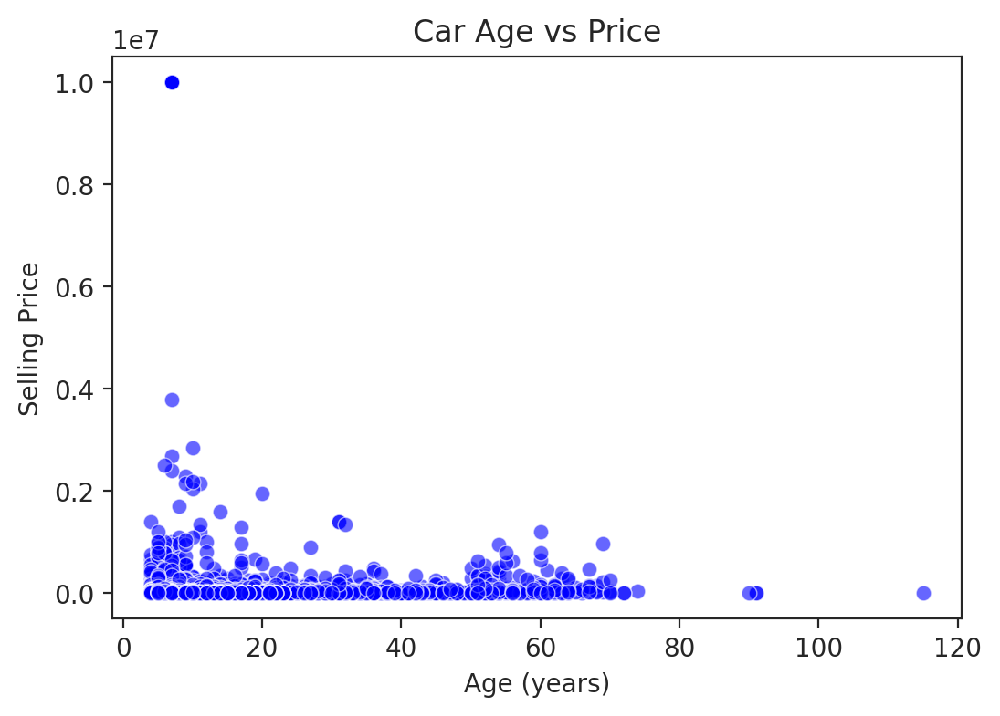

In [ ]:
plt.scatter(autos['age'], autos['price'], alpha=0.6, c='blue', edgecolors='w', linewidths=0.5)
plt.title('Car Age vs Price')
plt.xlabel('Age (years)')
plt.ylabel('Selling Price')
plt.show()


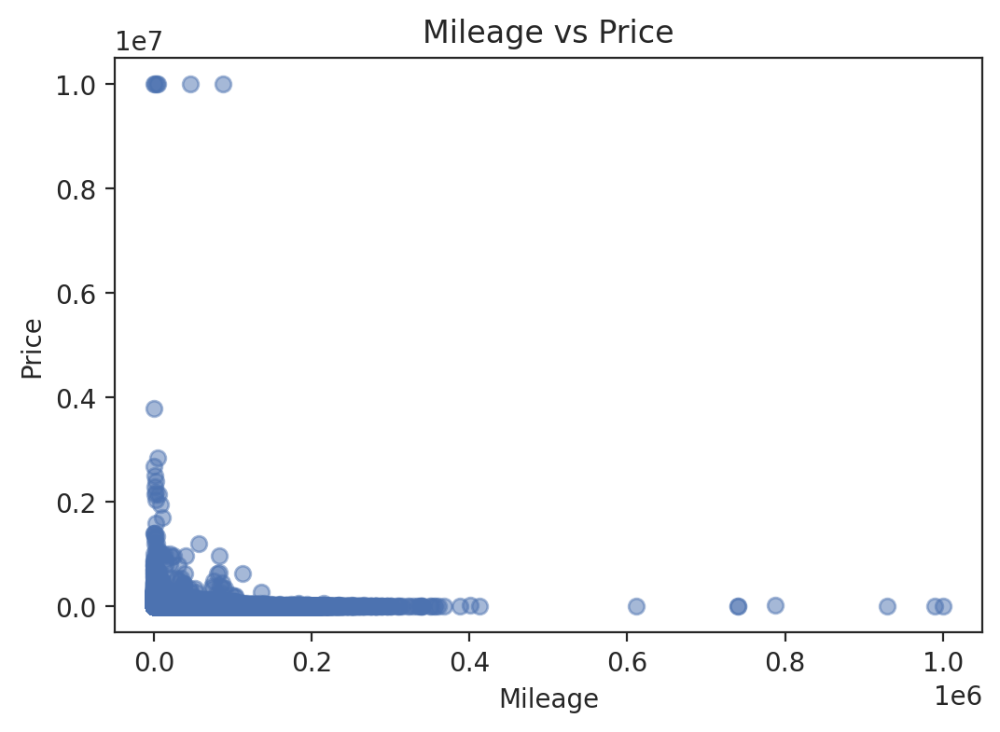

In [ ]:
plt.scatter(autos['mileage'], autos['price'], alpha=0.5)
plt.title('Mileage vs Price')
plt.xlabel('Mileage')
plt.ylabel('Price')
plt.show()


In [ ]:
autos.describe()

,public_ref,mileage,price,age
count,4.020050e+05,402005.000000,4.020050e+05,402005.000000
mean,2.020071e+14,37752.343246,1.734197e+04,8.787329
std,1.691662e+10,34826.470164,4.643746e+04,4.213283
min,2.013072e+14,0.000000,1.200000e+02,4.000000
25%,2.020090e+14,10490.000000,7.495000e+03,6.000000
50%,2.020093e+14,28650.000000,1.260000e+04,7.000000
75%,2.020102e+14,56890.000000,2.000000e+04,10.000000
max,2.020110e+14,999999.000000,9.999999e+06,115.000000


**Removing Outliers using pecentile**

In [ ]:
# Calculate the 95th percentile for both 'mileage' and 'price'
percentile_95_mileage = np.percentile(autos['mileage'], 95)
percentile_95_price = np.percentile(autos['price'], 95),
#percentile_95_age = np.percentile(autos['age'],95 )

# Filter the DataFrame to include values within the 95th for both mileage,price
autos = autos[
    (autos['mileage'] <= percentile_95_mileage) &
    (autos['price'] <= percentile_95_price)
    #(autos['age'] <= percentile_95_age)
]
autos


,public_ref,mileage,reg_code,colour,make,model,vehicle_condition,price,body_type,crossover_car_and_van,fuel_type,age
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,14000,SUV,False,Petrol,7
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,7995,Hatchback,False,Diesel,8
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,26995,SUV,False,Diesel,9
5,202009304412074,16000.0,17,Blue,Audi,S5,USED,29000,Convertible,False,Petrol,7
6,202007080998445,24075.0,17,Red,Vauxhall,Viva,USED,5861,Hatchback,False,Petrol,7
...,...,...,...,...,...,...,...,...,...,...,...,...
401999,202010315651841,74732.0,59,Blue,Toyota,Auris,USED,2600,Hatchback,False,Petrol,15
402000,202010315652942,5179.0,69,Grey,Peugeot,208,USED,10595,Hatchback,False,Petrol,5
402002,202010315659271,52760.0,62,White,Nissan,Qashqai,USED,7250,SUV,False,Petrol,12
402003,202011015662436,10250.0,65,Red,Abarth,595,USED,11490,Hatchback,False,Petrol,9


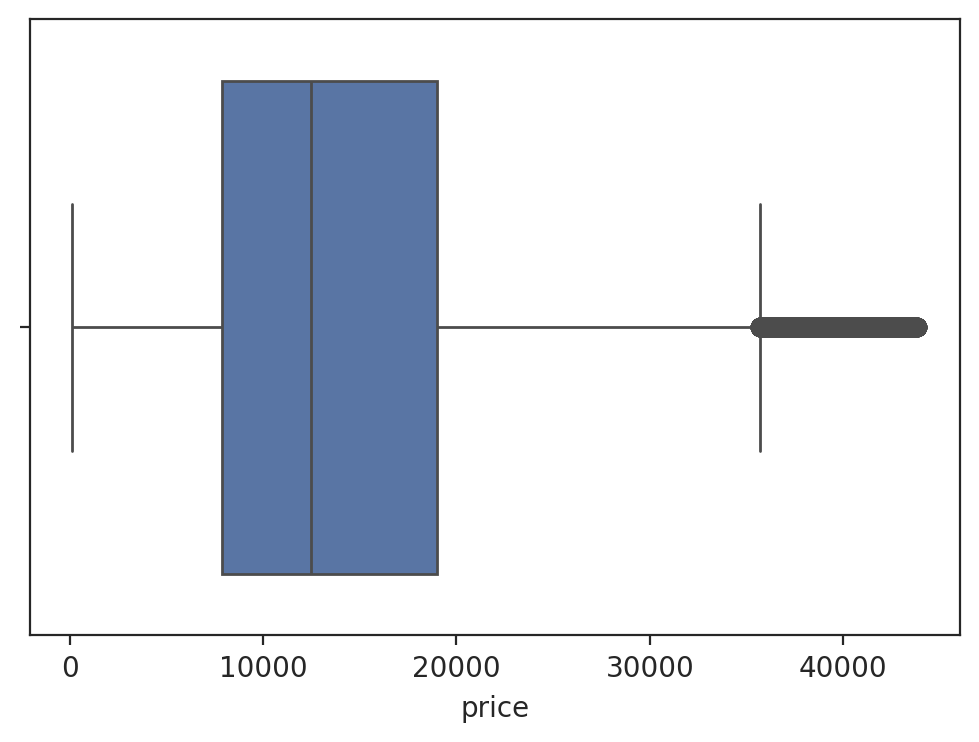

In [ ]:
sns.boxplot(data=autos, x='price');

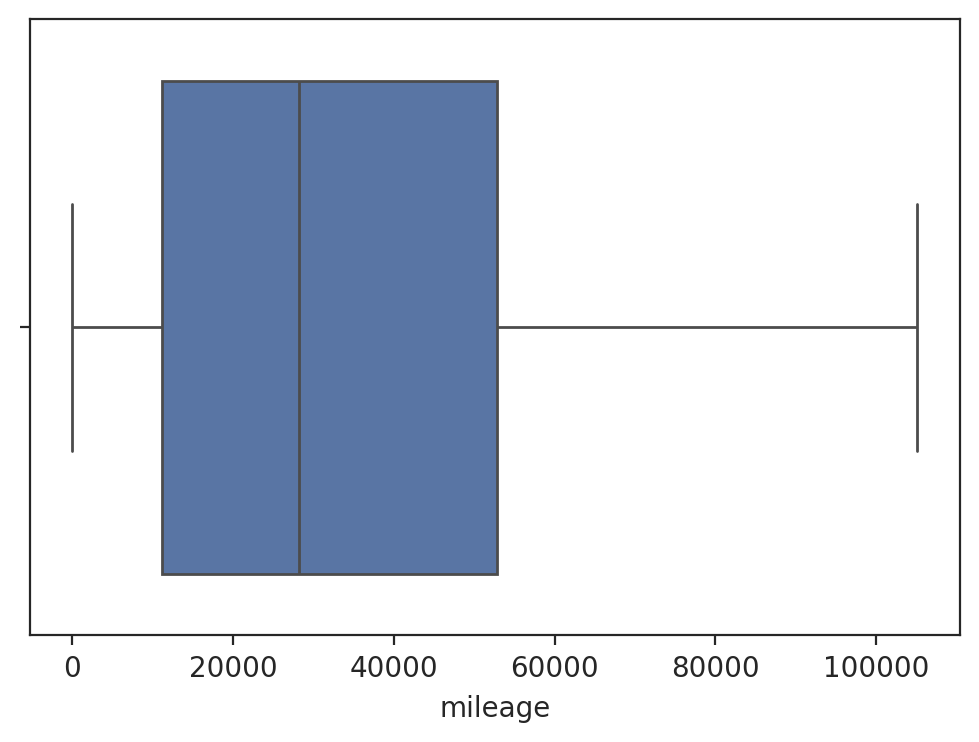

In [ ]:
sns.boxplot(data=autos, x='mileage');

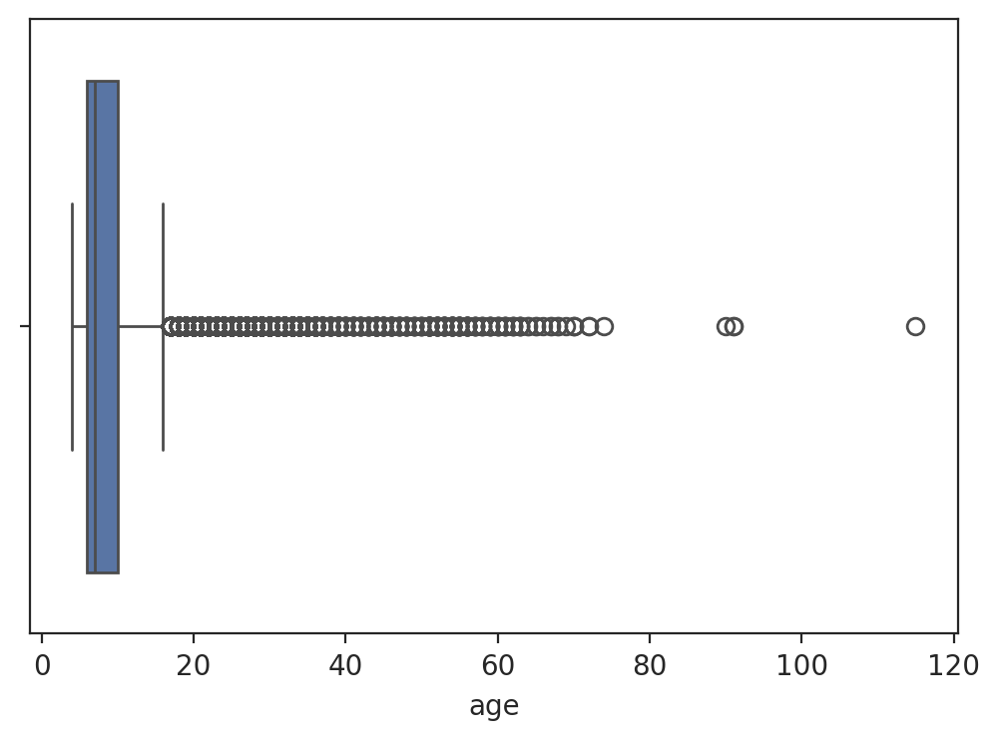

In [ ]:
sns.boxplot(data=autos, x='age');

In [ ]:
autos['mileage'].describe()

count    361828.000000
mean      34270.688626
std       27816.885924
min           0.000000
25%       11252.000000
50%       28172.000000
75%       52808.500000
max      105131.000000
Name: mileage, dtype: float64

In [ ]:
autos['age'].describe()

count    361828.000000
mean          8.513249
std           3.804755
min           4.000000
25%           6.000000
50%           7.000000
75%          10.000000
max         115.000000
Name: age, dtype: float64

In [ ]:
autos['price'].describe()

count    361828.000000
mean      14415.792943
std        8885.819620
min         120.000000
25%        7875.000000
50%       12500.000000
75%       18999.000000
max       43840.000000
Name: price, dtype: float64

In [ ]:
age_mileage = autos.groupby('age')['mileage'].mean().sort_values(ascending=True)
age_mileage

age
74       367.000000
4       2898.752290
68      7075.000000
5       9783.288792
91     19172.500000
          ...      
18     74101.069648
17     74205.309267
67     81000.000000
66     95000.000000
69    103808.000000
Name: mileage, Length: 72, dtype: float64

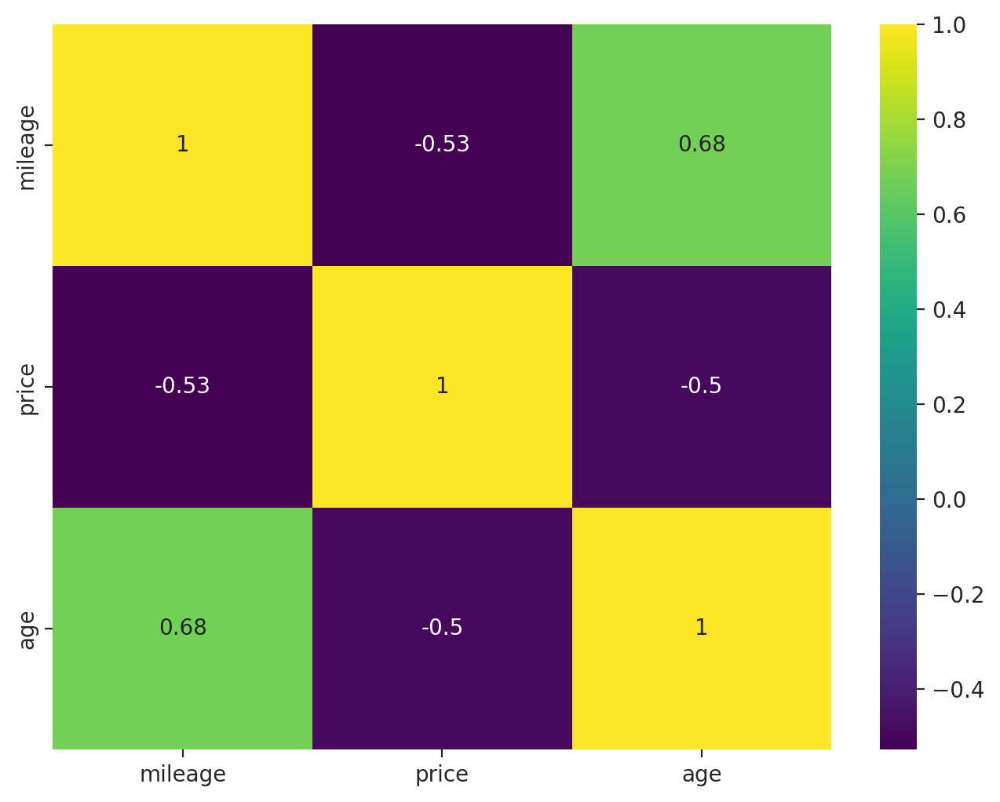

In [ ]:
# Define the features you want to correlate
features_to_corr = ['mileage', 'price', 'age']

# Calculate the correlation matrix for the desired features
correlation_matrix = autos[features_to_corr].corr()

# Create the heatmap
plt.subplots(figsize=(8, 6))
sns.heatmap(correlation_matrix, cmap="viridis", annot=True)
plt.show()

##Spliting the dataset

In [ ]:
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.pipeline import Pipeline
from category_encoders import TargetEncoder
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import pandas as pd
import numpy as np

In [ ]:
# Drop columns
columns_to_drop = ['public_ref', 'reg_code']
autos= autos.drop(columns=columns_to_drop)

In [ ]:
 #subset dataset,starting with 40% of the dataset
 #sample the data with frac=0.4
autos = autos.sample(frac=0.4, random_state=42)

In [ ]:
## the X/y split
X = autos.drop(columns='price')
y = autos['price']

In [ ]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [ ]:
autos.shape

(144731, 10)

**Preprocessing Pipleine**

In [ ]:
def create_pp_ppln(X, scaling=False, poly=False):
    """creates a default preprocessing pipeline for numeric and categorical data
    using simple imputers, scalers, and encoders. It relies on latest versions
    of sklearn so as to produce pandas outputs.

    X: the dataset with the features (needed for feature names)

    returns the Pipeline object
    """

    numeric_features = X.select_dtypes(exclude=['object', 'bool']).columns.tolist()
    numeric_transformer = Pipeline(
        steps=[
            ("imputer", SimpleImputer(strategy="mean"))
        ]
    )

    if scaling:
        numeric_transformer.steps.extend([
            ("scaler", MinMaxScaler())

        ])
    if poly:
        numeric_transformer.steps.extend([
           ('poly', PolynomialFeatures(degree=2, include_bias=False))
        ])


    categorical_features = X.select_dtypes(include=['object', 'bool']).columns.tolist()
    categorical_transformer = Pipeline(
        steps=[
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("enc", TargetEncoder())
        ]
    )

    preprocessor = ColumnTransformer(
        transformers=[
            ("num", numeric_transformer, numeric_features),
            ("cat", categorical_transformer, categorical_features),
        ],
        remainder='passthrough',
        verbose_feature_names_out=False
    )

    return preprocessor

In [ ]:
def create_est_ppln(est, X, scaling=False, poly=False):
    """ """
    est_pipe = Pipeline(
        steps=[
            ("pp", create_pp_ppln(X, scaling, poly)),
            ("est", est),
        ]
    )

    return est_pipe

In [ ]:
preprocessor = create_pp_ppln(X_train, scaling=False, poly=False)
preprocessor.fit(X_train, y_train)
X_train_preprocessed = preprocessor.transform(X_train)
X_train_preprocessed




,mileage,age,colour,make,model,vehicle_condition,body_type,crossover_car_and_van,fuel_type
211351,15045.0,7.0,14318.853132,11386.644049,13114.022107,13636.365517,18772.034897,14362.242877,12733.494301
373571,44956.0,8.0,14879.018363,11386.644049,10335.128042,13636.365517,18772.034897,14362.242877,12733.494301
248431,116.0,5.0,16325.223649,20828.746241,32350.207781,13636.365517,18772.034897,14362.242877,12733.494301
149159,2000.0,4.0,15194.278960,11839.773222,7821.587224,13636.365517,10533.741678,14362.242877,12733.494301
301084,5628.0,4.0,16325.223649,25587.929637,27409.248756,13636.365517,18772.034897,14362.242877,15608.715114
...,...,...,...,...,...,...,...,...,...
173586,13000.0,5.0,13772.830249,18134.903534,18148.045082,13636.365517,17527.844333,14362.242877,12733.494301
180473,50472.0,8.0,14318.853132,18134.903534,20346.819788,13636.365517,17889.727227,14362.242877,12733.494301
162924,33987.0,8.0,14318.853132,14691.702042,15100.722784,13636.365517,10533.741678,14362.242877,25820.025828
383051,43068.0,9.0,12225.661569,13506.875875,13061.661448,13636.365517,10533.741678,14362.242877,12733.494301


In [ ]:
X_train_preprocessed.isnull().sum()


mileage                  0
age                      0
colour                   0
make                     0
model                    0
vehicle_condition        0
body_type                0
crossover_car_and_van    0
fuel_type                0
dtype: int64

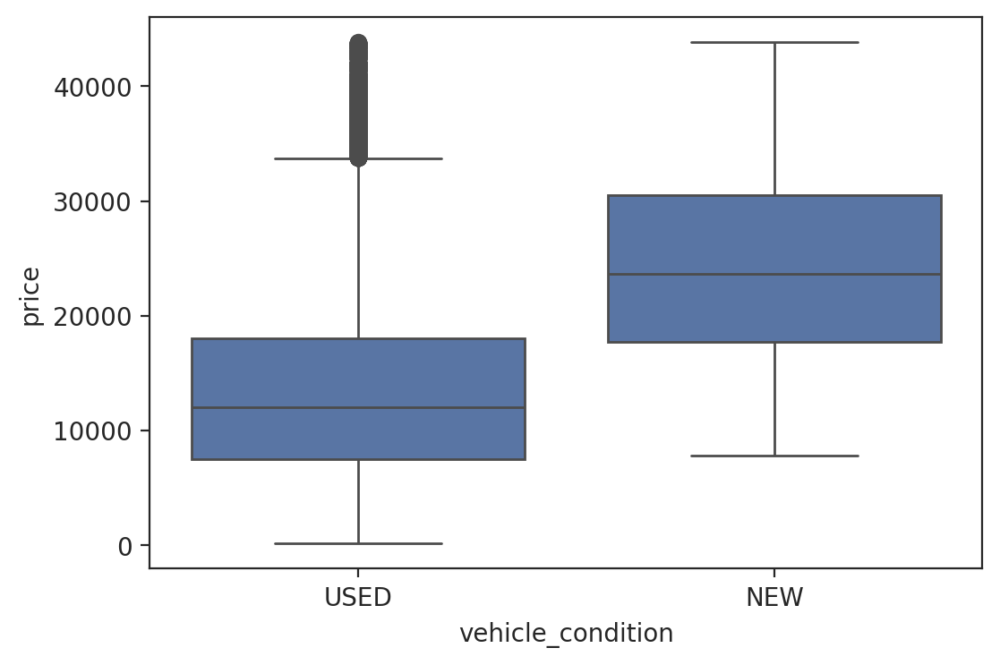

In [ ]:
sns.boxplot(x=X_train['vehicle_condition'], y=y_train);

###Polynomial Features with Linear Regression

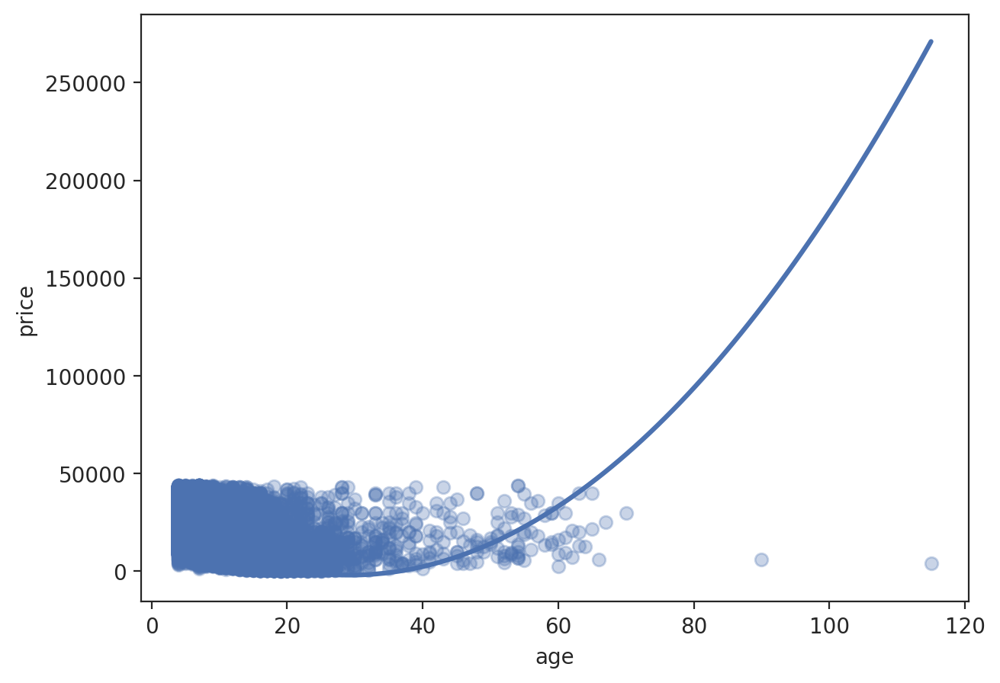

In [ ]:
fig, ax = plt.subplots(figsize=(7,5))
sns.regplot(
    data=autos, x='age', y='price',order = 2,
    scatter_kws=dict(alpha=0.3), ax=ax, ci=None
);

In [ ]:
def create_est_poly_ppln(est, X, scaling=True, poly=True):
    """ """
    est_pipe = Pipeline(
        steps=[
            ("pp", create_pp_ppln(X, scaling, poly)),
            ("est", LinearRegression()),
        ]
    )

    return est_pipe

In [ ]:
poly_reg= create_est_poly_ppln(LinearRegression(), X_train, scaling=True, poly=True)

In [ ]:
poly_reg.fit(X_train, y_train)

Pipeline(steps=[('pp',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler()),
                                                                  ('poly',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['mileage', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('enc',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'vehicle_condition',
                                                   'body_type',
                                                   'crossover_car_and_van',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('est', LinearRegression())])

In [ ]:
poly_reg.score(X_test, y_test), poly_reg.score(X_train, y_train)

(0.7965415650151941, 0.7971536983861133)

In [ ]:
eval_results = cross_validate(
    poly_reg, X_train, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)
poly_reg_test_mae = (-eval_results['test_score'].mean(), eval_results['test_score'].std())
poly_reg_train_mae = (-eval_results['train_score'].mean(), eval_results['train_score'].std())

(poly_reg_test_mae, poly_reg_train_mae)

((2910.041446741374, 14.242347003019207),
 (2901.2217759848713, 5.671388916966151))

In [ ]:
# Perform cross-validation for polynomial regression
eval_results = cross_validate(
    poly_reg, X_train, y_train, cv=5,
    scoring='r2',
    return_train_score=True
)

# Calculate the mean of the test and train R^2 scores
poly_reg_test_r2 = eval_results['test_score'].mean()
poly_reg_train_r2 = eval_results['train_score'].mean()

(poly_reg_test_r2, poly_reg_train_r2)


(0.7922084906184128, 0.7958842308062897)

In [ ]:
poly_reg['pp'].get_feature_names_out()

array(['mileage', 'age', 'mileage^2', 'mileage age', 'age^2', 'colour',
       'make', 'model', 'vehicle_condition', 'body_type',
       'crossover_car_and_van', 'fuel_type'], dtype=object)

In [ ]:
len(poly_reg['pp'].get_feature_names_out())

12

In [ ]:
poly_reg['est'].coef_

array([-1.41675680e+04, -1.14480005e+05,  2.38907191e+03,  6.02907847e+04,
        2.00620436e+05,  1.10308669e-01,  3.92543143e-01,  6.37098385e-01,
        5.21398850e-01,  9.65929921e-02,  4.66304972e-01,  2.59198381e-01])

In [ ]:
coef= pd.DataFrame(
    dict(
        feat=poly_reg['pp'].get_feature_names_out(),
        coef=poly_reg['est'].coef_
    ),
)
coef

,feat,coef
0,mileage,-14167.567984
1,age,-114480.004873
2,mileage^2,2389.071907
3,mileage age,60290.784715
4,age^2,200620.435921
5,colour,0.110309
6,make,0.392543
7,model,0.637098
8,vehicle_condition,0.521399
9,body_type,0.096593


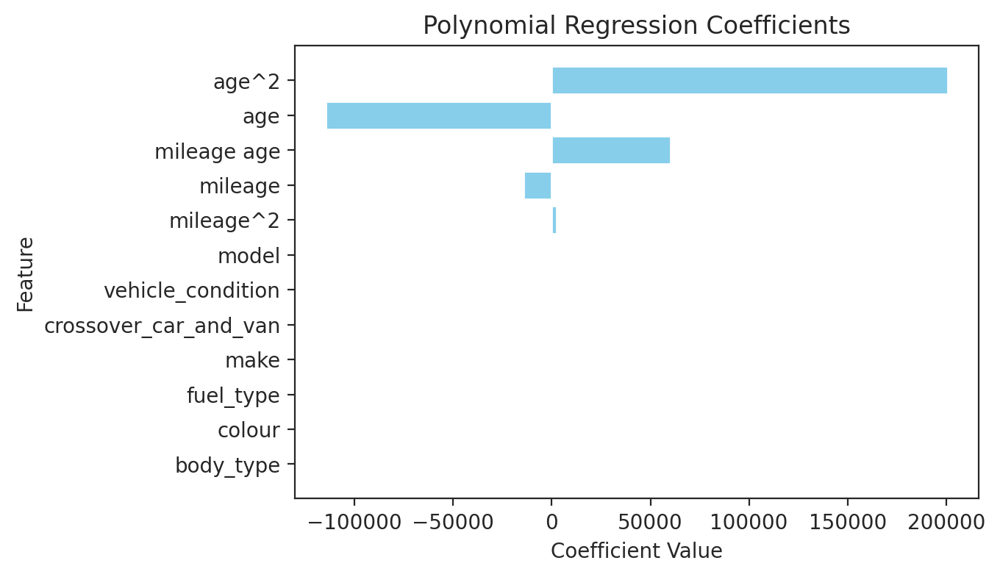

In [ ]:
# Sort the DataFrame by the absolute values of the coefficients in descending order for better visualization
coef = coef.reindex(coef['coef'].abs().sort_values(ascending=False).index)
# Plotting
plt.barh(coef['feat'], coef['coef'], color='skyblue')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Polynomial Regression Coefficients')
plt.gca().invert_yaxis()
plt.show()

### Normal Regression without polynomial Features

In [ ]:
normal_reg = create_est_poly_ppln(LinearRegression(), X_train, scaling=True, poly=False)

In [ ]:
normal_reg.fit(X_train, y_train)

Pipeline(steps=[('pp',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['mileage', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('enc',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'vehicle_condition',
                                                   'body_type',
                                                   'crossover_car_and_van',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('est', LinearRegression())])

In [ ]:
normal_reg.score(X_test, y_test), normal_reg.score(X_train, y_train)

(0.7809642561898416, 0.7803514536780888)

In [ ]:
eval_results = cross_validate(
    normal_reg, X_train, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)
normal_reg_test_mae = (-eval_results['test_score'].mean(), eval_results['test_score'].std())
normal_reg_train_mae = (-eval_results['train_score'].mean(), eval_results['train_score'].std())

(normal_reg_test_mae, normal_reg_train_mae)

((3038.525657723435, 20.381841027091696),
 (3029.9422805570416, 7.20320118814606))

In [ ]:
# Perform cross-validation for Normal Linear regression
eval_results = cross_validate(
    normal_reg, X_train, y_train, cv=5,
    scoring='r2',
    return_train_score=True
)

# Calculate the mean of the test and train R^2 scores
normal_reg_test_r2 = eval_results['test_score'].mean()
normal_reg_train_r2 = eval_results['train_score'].mean()

(normal_reg_test_r2, normal_reg_train_r2)


(0.7766854942709471, 0.7789441092093785)

In [ ]:
normal_reg['est'].coef_

array([-1.17030280e+04, -3.85074356e+04,  1.30209838e-01,  3.70624989e-01,
        6.67247051e-01,  4.97906682e-01,  1.02481440e-01,  4.90630762e-01,
        2.63224391e-01])

In [ ]:
X_train.columns

Index(['mileage', 'colour', 'make', 'model', 'vehicle_condition', 'body_type',
       'crossover_car_and_van', 'fuel_type', 'age'],
      dtype='object')

### A bar Plot Comparing the R squared scored from Linear Regression with and without Polynomial Features.

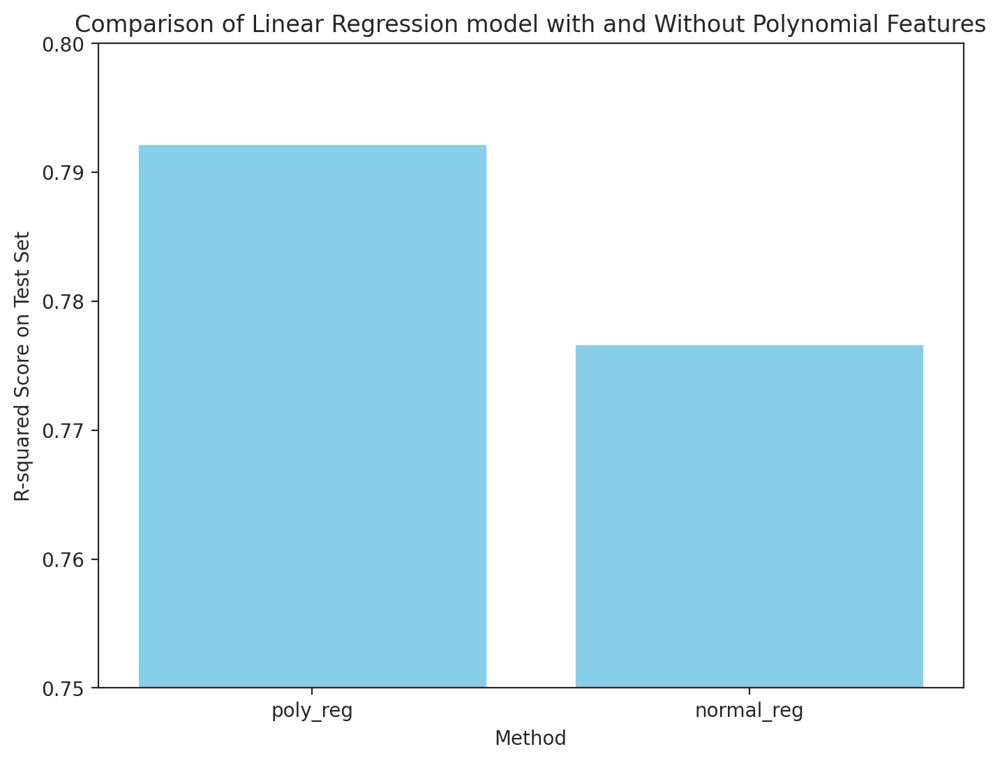

In [ ]:
#  plot these R-squared scores to compare the performance
methods = ['poly_reg', 'normal_reg']
r2_scores = [poly_reg_test_r2,  normal_reg_test_r2]

plt.figure(figsize=(8, 6))
plt.bar(methods, r2_scores, color='skyblue')
plt.xlabel('Method')
plt.ylabel('R-squared Score on Test Set')
plt.title('Comparison of Linear Regression model with and Without Polynomial Features')
plt.ylim(0.75, 0.8)
plt.show()

**Observation**

From the bar plot above it can be seen that the linear regression with second degree polynomial feature R squared value on the test score was higher compared to the linear regression without polynomial features.

##Feature selection and Dimensionality Reduction


###K BEST

In [ ]:
from sklearn.feature_selection import SelectKBest, f_regression

In [ ]:
def create_est_kbest_ppln(est, X, scaling=True, poly=True):
    """ """
    est_pipe = Pipeline(
        steps=[
            ("pp", create_pp_ppln(X, scaling, poly)),
           ("featsel", SelectKBest(f_regression, k=5)),
            ("est", LinearRegression()),
        ]
    )

    return est_pipe

In [ ]:
reg_bestk = create_est_kbest_ppln(LinearRegression(), X_train)


In [ ]:
reg_bestk.fit(X_train, y_train)

Pipeline(steps=[('pp',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler()),
                                                                  ('poly',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['mileage', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('enc',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'vehicle_condition',
                                                   'body_type',
                                                   'crossover_car_and_van',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('featsel',
                 SelectKBest(k=5,
                             score_func=<function f_regression at 0x7cb299b305e0>)),
                ('est', LinearRegression())])

In [ ]:
reg_bestk['featsel'].get_feature_names_out()

array(['mileage', 'age', 'mileage age', 'make', 'model'], dtype=object)

In [ ]:
len(reg_bestk['featsel'].get_feature_names_out())

5

In [ ]:
reg_bestk['featsel'].transform(
    reg_bestk['pp'].transform(X_train)
).head()

,mileage,age,mileage age,make,model
211351,0.143122,0.027027,0.003868,11386.644049,13114.022107
373571,0.427664,0.036036,0.015411,11386.644049,10335.128042
248431,0.001104,0.009009,0.000010,20828.746241,32350.207781
149159,0.019026,0.000000,0.000000,11839.773222,7821.587224
301084,0.053539,0.000000,0.000000,25587.929637,27409.248756


In [ ]:
reg_bestk.score(X_test, y_test), reg_bestk.score(X_train, y_train)

(0.7601800433711445, 0.7583240848652234)

In [ ]:
eval_results = cross_validate(
    reg_bestk, X_train, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)
(
    (-eval_results['test_score'].mean(), eval_results['test_score'].std(),
    -eval_results['train_score'].mean(), eval_results['train_score'].std())
)

(3218.23473644008, 14.821369684918563, 3207.5763168360213, 6.831490340473587)

Number of scores: 12
Number of selected feature names: 5


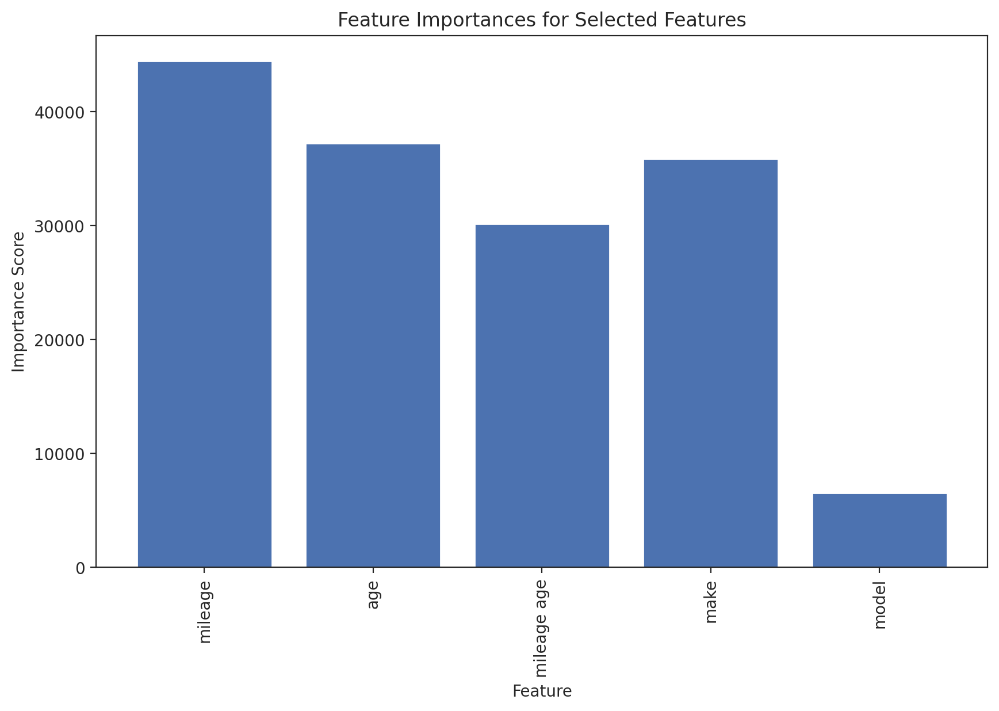

In [ ]:
# Get the feature scores and names
feature_scores = reg_bestk.named_steps['featsel'].scores_
feature_names = reg_bestk.named_steps['featsel'].get_feature_names_out()

print(f"Number of scores: {len(feature_scores)}")
print(f"Number of selected feature names: {len(feature_names)}")

if len(feature_scores) > len(feature_names):
    # Trim the feature_scores to match the length of feature_names
    feature_scores = feature_scores[:len(feature_names)]

# Now plot the trimmed scores with the feature names
plt.figure(figsize=(10, 6))
plt.bar(feature_names, feature_scores)
plt.title('Feature Importances for Selected Features')
plt.xlabel('Feature')
plt.ylabel('Importance Score')
plt.xticks(rotation=90)  # Rotate feature names for better readability
plt.show()



###RFECV with the Linear Model

In [ ]:
from sklearn.feature_selection import RFECV

In [ ]:
# Define your estimator
model = LinearRegression()

In [ ]:
def create_est_RFECV_ppln(est, X, scaling=True, poly=True):
    """ """
    est_pipe = Pipeline(
        steps=[
            ("pp", create_pp_ppln(X, scaling, poly)),
            ("featsel", RFECV(model, step=1, cv=5) ),
            ("est", LinearRegression()),
        ]
    )

    return est_pipe

In [ ]:
reg_rfe = create_est_RFECV_ppln(LinearRegression(), X_train)

In [ ]:
reg_rfe.fit(X_train, y_train)

Pipeline(steps=[('pp',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler()),
                                                                  ('poly',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['mileage', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('enc',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'vehicle_condition',
                                                   'body_type',
                                                   'crossover_car_and_van',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('featsel', RFECV(cv=5, estimator=LinearRegression())),
                ('est', LinearRegression())])

In [ ]:
rfe_selector = reg_rfe['featsel']


In [ ]:
np.sort(rfe_selector.get_feature_names_out())

array(['age', 'age^2', 'body_type', 'colour', 'crossover_car_and_van',
       'fuel_type', 'make', 'mileage', 'mileage age', 'mileage^2',
       'model', 'vehicle_condition'], dtype=object)

In [ ]:
reg_rfe['featsel'].get_feature_names_out()

array(['mileage', 'age', 'mileage^2', 'mileage age', 'age^2', 'colour',
       'make', 'model', 'vehicle_condition', 'body_type',
       'crossover_car_and_van', 'fuel_type'], dtype=object)

In [ ]:
len(np.sort(rfe_selector.get_feature_names_out()))

12

In [ ]:
# should match the number of features
n_scores = len(rfe_selector.cv_results_["mean_test_score"])
n_scores

12

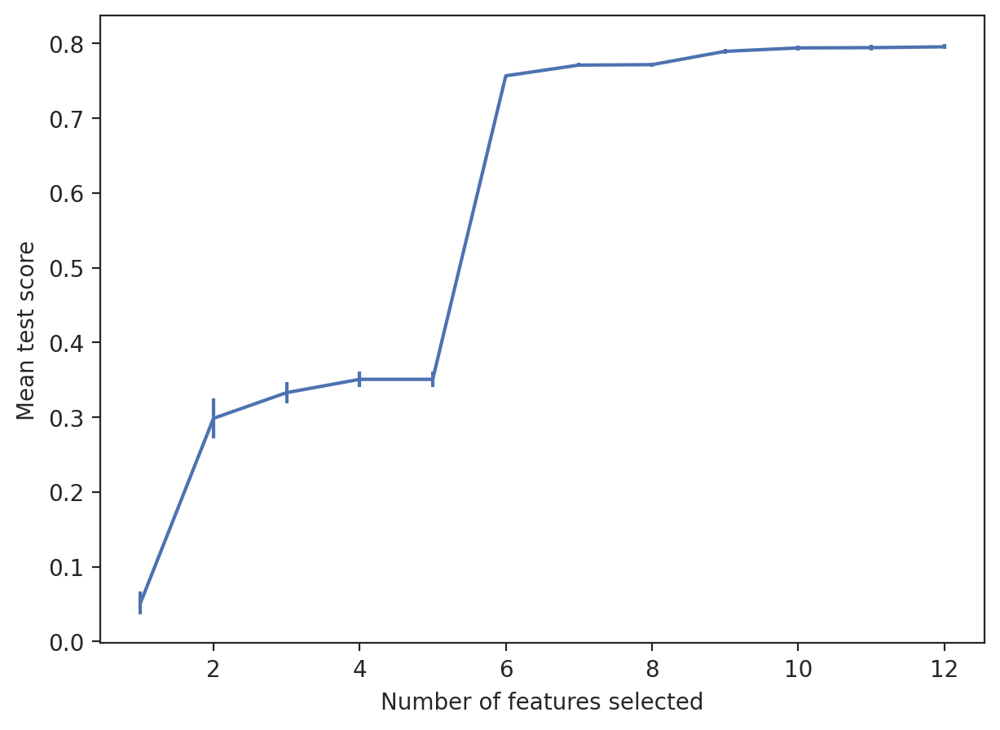

In [ ]:
fig, ax = plt.subplots(figsize=(7,5))
ax.errorbar(
    range(1, n_scores+1),
    rfe_selector.cv_results_["mean_test_score"],
    yerr=rfe_selector.cv_results_["std_test_score"],
)
ax.set_xlabel("Number of features selected")
ax.set_ylabel("Mean test score");

In [ ]:
# from features up to a single one
np.flip(rfe_selector.cv_results_["mean_test_score"])

array([0.79559912, 0.79448542, 0.79412198, 0.78952811, 0.77172394,
       0.77115918, 0.75682225, 0.3507012 , 0.35069104, 0.33288164,
       0.29850442, 0.0512677 ])

In [ ]:
 reg_rfe['featsel'].transform(
  reg_rfe['pp'].transform(X_train)
)


,mileage,age,mileage^2,mileage age,age^2,colour,make,model,vehicle_condition,body_type,crossover_car_and_van,fuel_type
211351,0.143122,0.027027,0.020484,0.003868,0.000730,14318.853132,11386.644049,13114.022107,13636.365517,18772.034897,14362.242877,12733.494301
373571,0.427664,0.036036,0.182896,0.015411,0.001299,14879.018363,11386.644049,10335.128042,13636.365517,18772.034897,14362.242877,12733.494301
248431,0.001104,0.009009,0.000001,0.000010,0.000081,16325.223649,20828.746241,32350.207781,13636.365517,18772.034897,14362.242877,12733.494301
149159,0.019026,0.000000,0.000362,0.000000,0.000000,15194.278960,11839.773222,7821.587224,13636.365517,10533.741678,14362.242877,12733.494301
301084,0.053539,0.000000,0.002866,0.000000,0.000000,16325.223649,25587.929637,27409.248756,13636.365517,18772.034897,14362.242877,15608.715114
...,...,...,...,...,...,...,...,...,...,...,...,...
173586,0.123668,0.009009,0.015294,0.001114,0.000081,13772.830249,18134.903534,18148.045082,13636.365517,17527.844333,14362.242877,12733.494301
180473,0.480137,0.036036,0.230532,0.017302,0.001299,14318.853132,18134.903534,20346.819788,13636.365517,17889.727227,14362.242877,12733.494301
162924,0.323316,0.036036,0.104533,0.011651,0.001299,14318.853132,14691.702042,15100.722784,13636.365517,10533.741678,14362.242877,25820.025828
383051,0.409703,0.045045,0.167857,0.018455,0.002029,12225.661569,13506.875875,13061.661448,13636.365517,10533.741678,14362.242877,12733.494301


In [ ]:
reg_rfe.score(X_test, y_test), reg_rfe.score(X_train, y_train)

(0.7965415650151941, 0.7971536983861133)

In [ ]:
eval_results = cross_validate(
    reg_rfe, X_train, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)
(
    (-eval_results['test_score'].mean(), eval_results['test_score'].std(),
    -eval_results['train_score'].mean(), eval_results['train_score'].std())
)

(2910.041446741374, 14.242347003019207, 2901.2217759848713, 5.671388916966151)

In [ ]:
feature_rankings = rfe_selector.ranking_
selected_features_mask = rfe_selector.support_

ranking_autos = pd.DataFrame({
    'Feature': reg_rfe['featsel'].transform(
    reg_rfe['pp'].transform(X_train))
.columns,
    'Ranking': feature_rankings,
    'Selected': selected_features_mask
})

# Sort the DataFrame by ranking to see the order of feature selection
ranking_autos.sort_values('Ranking', inplace=True)

ranking_autos

,Feature,Ranking,Selected
0,mileage,1,True
1,age,1,True
2,mileage^2,1,True
3,mileage age,1,True
4,age^2,1,True
5,colour,1,True
6,make,1,True
7,model,1,True
8,vehicle_condition,1,True
9,body_type,1,True


###Sequential Feature selector with the Linear Model

In [ ]:
from sklearn.feature_selection import SequentialFeatureSelector

In [ ]:
# Initialize the SequentialFeatureSelector with LinearRegression as the estimator
sfs_forward = SequentialFeatureSelector(
    LinearRegression(), n_features_to_select='auto', direction="forward"
)


In [ ]:
estimator=LinearRegression(),

In [ ]:

def create_est_sfs_ppln(est, X, scaling=True, poly=True):
    """ """
    est_pipe = Pipeline(
        steps=[
            ("pp", create_pp_ppln(X, scaling, poly)),
            ("sfs", sfs_forward ),
            ("est", LinearRegression()),
        ]
    )

    return est_pipe

In [ ]:
reg_sfs = create_est_sfs_ppln(LinearRegression, X_train)

In [ ]:
reg_sfs.fit(X_train, y_train)

Pipeline(steps=[('pp',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler()),
                                                                  ('poly',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['mileage', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('enc',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'vehicle_condition',
                                                   'body_type',
                                                   'crossover_car_and_van',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('sfs',
                 SequentialFeatureSelector(estimator=LinearRegression())),
                ('est', LinearRegression())])

In [ ]:
np.sort(reg_sfs['sfs'].get_feature_names_out())

array(['age', 'make', 'mileage', 'mileage^2', 'model',
       'vehicle_condition'], dtype=object)

In [ ]:
# Access the selected feature names
selected_feature_names = reg_sfs['sfs'].get_feature_names_out()

# Print the selected feature names
print(selected_feature_names)

['mileage' 'age' 'mileage^2' 'make' 'model' 'vehicle_condition']


In [ ]:
reg_sfs['sfs'].transform(
    reg_sfs['pp'].transform(X_train)
).head()

,mileage,age,mileage^2,make,model,vehicle_condition
211351,0.143122,0.027027,0.020484,11386.644049,13114.022107,13636.365517
373571,0.427664,0.036036,0.182896,11386.644049,10335.128042,13636.365517
248431,0.001104,0.009009,0.000001,20828.746241,32350.207781,13636.365517
149159,0.019026,0.000000,0.000362,11839.773222,7821.587224,13636.365517
301084,0.053539,0.000000,0.002866,25587.929637,27409.248756,13636.365517


In [ ]:
# Perform cross-validation on the entire pipeline
scores = cross_val_score(reg_sfs, X_train, y_train, cv=5)

# Calculate the mean and standard deviation of the cross-validation scores
mean_score = scores.mean()
std_score = scores.std()

(mean_score, std_score)


(0.7763672464684929, 0.005521226316895868)

In [ ]:
eval_results = cross_validate(
    reg_sfs, X_train, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)
(
    (-eval_results['test_score'].mean(), eval_results['test_score'].std(),
    -eval_results['train_score'].mean(), eval_results['train_score'].std())
)

(3047.0454792363475,
 19.953482223766446,
 3035.2584966995637,
 24.297251018181242)

In [ ]:
selected_features_indices = np.where(reg_sfs['sfs'].support_)[0]
print(selected_features_indices)

[0 1 2 6 7 8]


In [ ]:
selected_coefs = reg_sfs['est'].coef_

In [ ]:
pd.DataFrame(
    dict(
        feat=reg_sfs['sfs'].get_feature_names_out(),
        coef=reg_sfs['est'].coef_
    ),
)

,feat,coef
0,mileage,-20473.128166
1,age,-40358.812023
2,mileage^2,10474.118855
3,make,0.366783
4,model,0.740500
5,vehicle_condition,0.396981


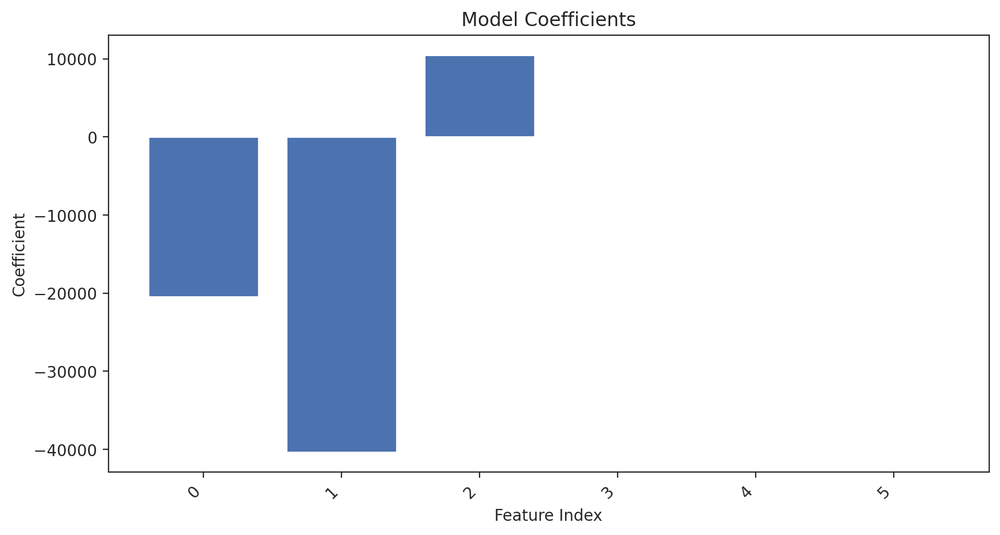

In [ ]:
# Generate feature indices for plotting
feature_indices = range(len(selected_coefs))

# Plot the coefficients for the selected features in the extended dataset
plt.figure(figsize=(10, 5))
plt.bar(feature_indices, selected_coefs)
plt.title("Model Coefficients")
plt.xlabel("Feature Index")
plt.ylabel("Coefficient")
plt.xticks(feature_indices, rotation=45, ha="right")
plt.show()

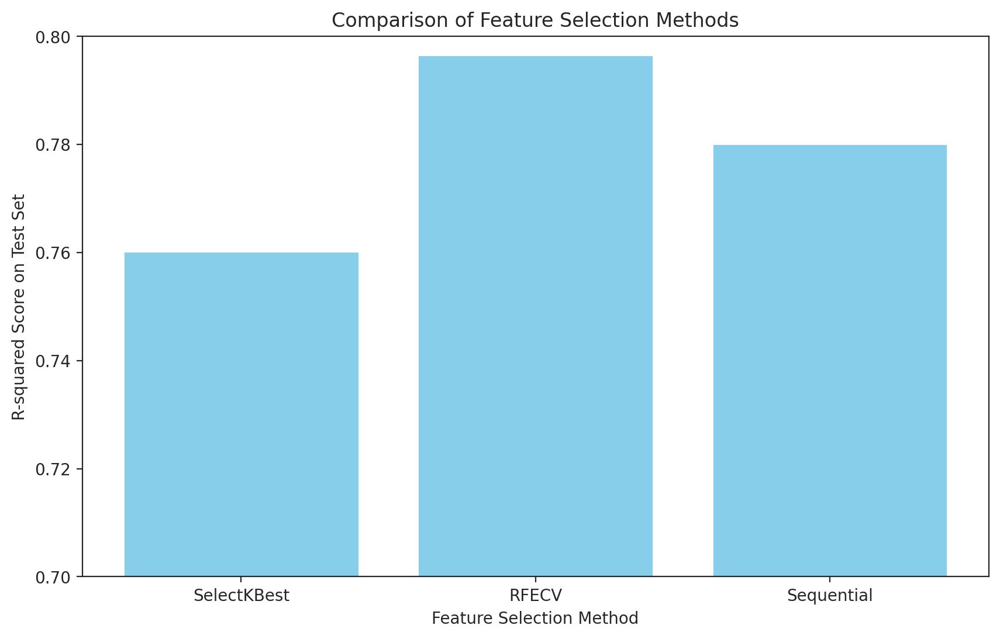

In [ ]:
# Assuming you have three models: reg_bestk, reg_rfecv, reg_sequential
# And you've already trained these models
r2_score_bestk = reg_bestk.score(X_test, y_test)
r2_score_rfecv = reg_rfe.score(X_test, y_test)
r2_score_sequential = reg_sfs.score(X_test, y_test)

# Now you can plot these R-squared scores to compare the performance
methods = ['SelectKBest', 'RFECV', 'Sequential']
r2_scores = [r2_score_bestk, r2_score_rfecv, r2_score_sequential]

plt.figure(figsize=(10, 6))
plt.bar(methods, r2_scores, color='skyblue')
plt.xlabel('Feature Selection Method')
plt.ylabel('R-squared Score on Test Set')
plt.title('Comparison of Feature Selection Methods')
plt.ylim(0.7, 0.8)  # R-squared range is 0 to 1
plt.show()

###PCA Principal Component Analysis

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [ ]:
def create_est_pca_ppln(est, X, scaling=False, poly=False):
    """ """
    est_pipe = Pipeline(
        steps=[
            ("pp", create_pp_ppln(X, scaling, poly)),
            ("mc", StandardScaler()),
            ("pca", PCA(n_components=2)),
            ("est", LinearRegression()),


        ]
    )

    return est_pipe

In [ ]:
reg_pca = create_est_pca_ppln(LinearRegression(), X_train)

In [ ]:
reg_pca.fit(X_train, y_train)

Pipeline(steps=[('pp',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer())]),
                                                  ['mileage', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('enc',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'vehicle_condition',
                                                   'body_type',
                                                   'crossover_car_and_van',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('mc', StandardScaler()), ('pca', PCA(n_components=2)),
                ('est', LinearRegression())])

In [ ]:
eval_results = cross_validate(
    reg_pca, X_train, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)
(
    (-eval_results['test_score'].mean(), eval_results['test_score'].std(),
    -eval_results['train_score'].mean(), eval_results['train_score'].std())
)

(3338.474455393377, 27.254346827607296, 3332.578515824748, 8.665615082837606)

In [ ]:
reg_pca.score(X_train, y_train)

0.7326837180958705

In [ ]:
X_pca_2D_test = reg_pca['pca'].transform(
    reg_pca['pp'].transform(X_test)
)
X_pca_2D_train = reg_pca['pca'].transform(
    reg_pca['pp'].transform(X_train)
)

In [ ]:
print("Original shape: {}".format(str(X_test.shape)))
print("Reduced shape: {}".format(str(X_pca_2D_test.shape)))


Original shape: (28947, 9)
Reduced shape: (28947, 2)


In [ ]:
X_pca_2D_test.head(1)

,pca0,pca1
51902,-20733.931299,72479.2547


In [ ]:
X_pca_2D_test.shape

(28947, 2)

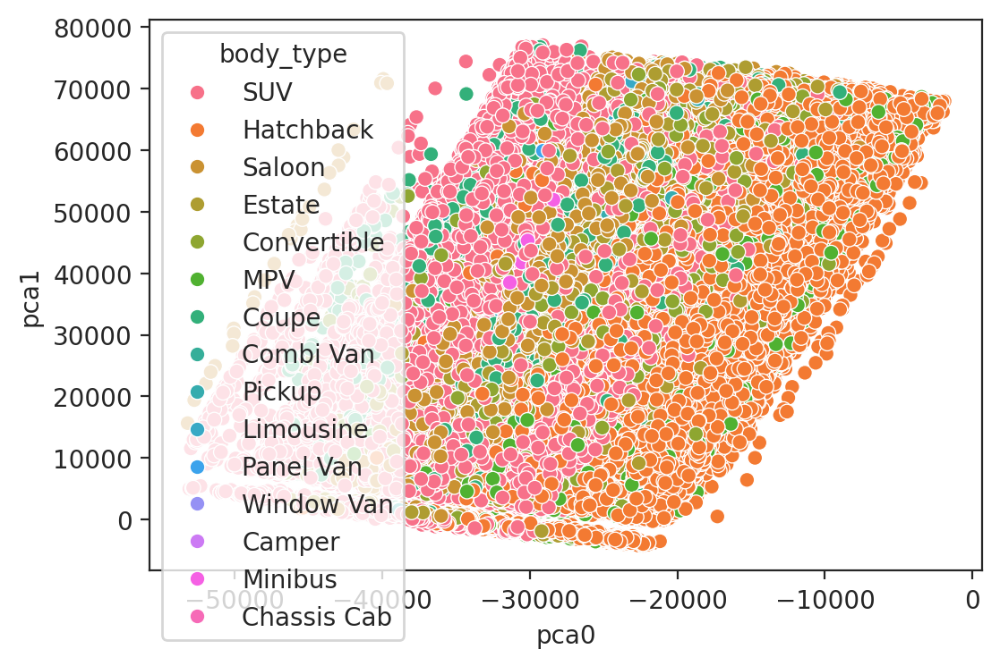

In [ ]:
sns.scatterplot(x=X_pca_2D_train['pca0'], y=X_pca_2D_train['pca1'], hue=X_train['body_type']);

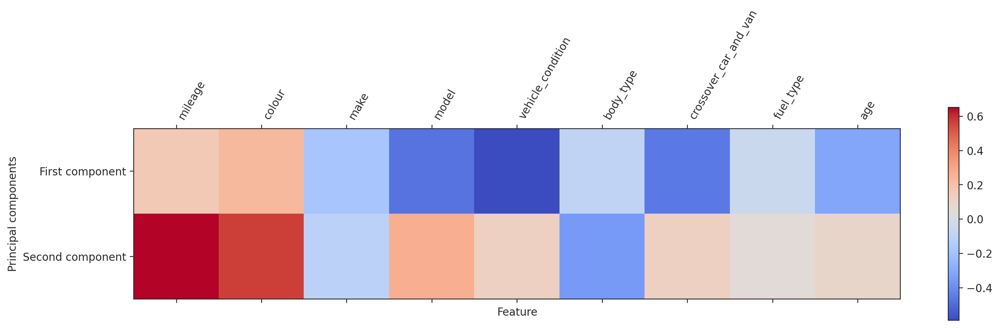

In [ ]:
plt.matshow(reg_pca['pca'].components_, cmap='coolwarm')
plt.yticks([0, 1], ["First component", "Second component"])
plt.colorbar()
plt.xticks(range(len(X_train.columns)),
           X_train.columns, rotation=60, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components");

###FULL PCA

In [ ]:
full_PCA_reg = Pipeline(
    steps=[
        ("pp", create_pp_ppln(X)),
        ("mc", StandardScaler()),
        ("pca", PCA()),
        ("est", LinearRegression()),
    ]
)

In [ ]:
full_PCA_reg.fit(X_train, y_train)

Pipeline(steps=[('pp',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer())]),
                                                  ['mileage', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('enc',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'vehicle_condition',
                                                   'body_type',
                                                   'crossover_car_and_van',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('mc', StandardScaler()), ('pca', PCA()),
                ('est', LinearRegression())])

In [ ]:
full_PCA_reg.score(X_train, y_train)

0.7803514536780889

Text(0, 0.5, 'cumulative explained variance')

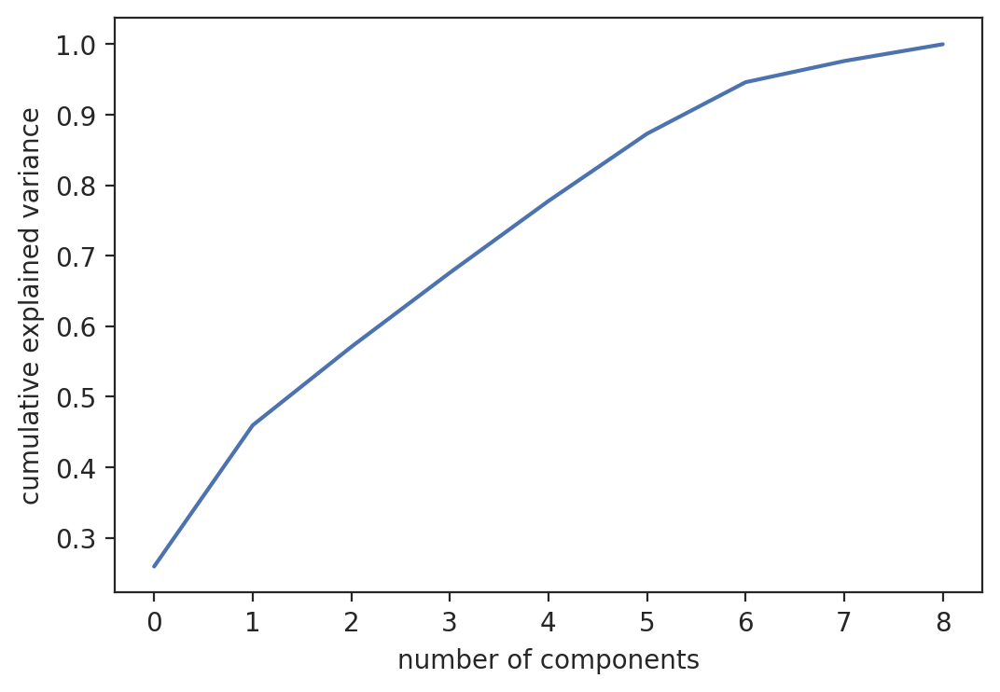

In [ ]:
plt.plot(
    np.cumsum(full_PCA_reg['pca'].explained_variance_ratio_)
)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [ ]:
PCA_6D_reg = Pipeline(
    steps=[
        ("pp", create_pp_ppln(X)),
        ("mc", StandardScaler()),
        ("pca", PCA(6)),
        ("est", LinearRegression()),
    ]
)

In [ ]:
PCA_6D_reg.fit(X_train, y_train)

Pipeline(steps=[('pp',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer())]),
                                                  ['mileage', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('enc',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'vehicle_condition',
                                                   'body_type',
                                                   'crossover_car_and_van',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('mc', StandardScaler()), ('pca', PCA(n_components=6)),
                ('est', LinearRegression())])

In [ ]:
eval_results = cross_validate(
    PCA_6D_reg, X_train, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)
(
    (-eval_results['test_score'].mean(), eval_results['test_score'].std(),
    -eval_results['train_score'].mean(), eval_results['train_score'].std())
)

(3233.1750080851425, 27.601595606038686, 3227.18920399951, 7.844826693606218)

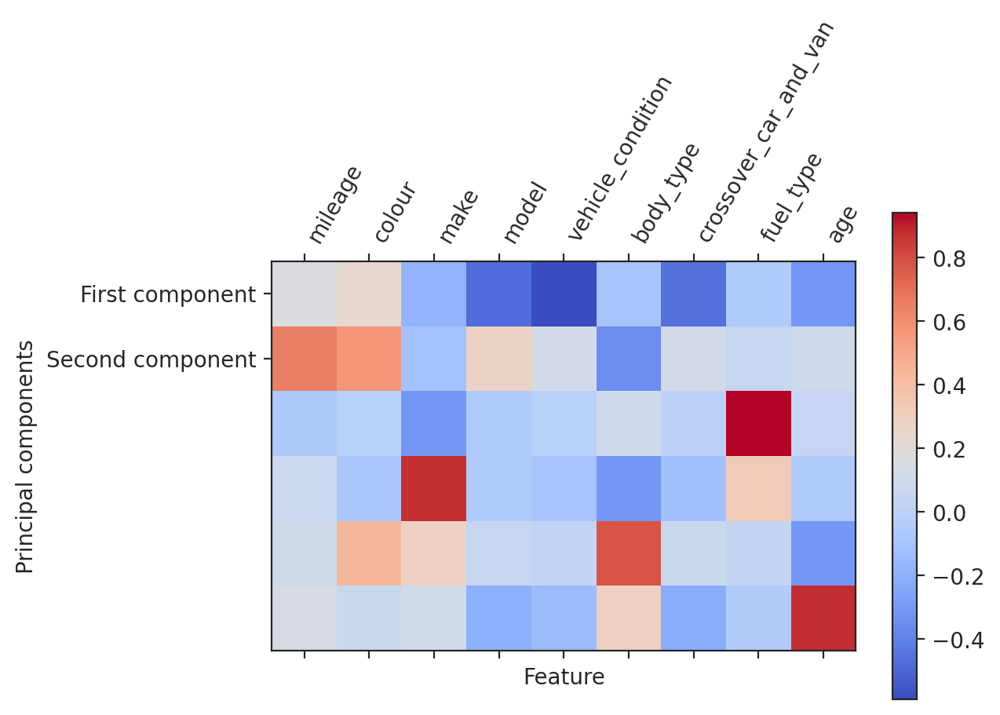

In [ ]:
plt.matshow(PCA_6D_reg['pca'].components_, cmap='coolwarm')
plt.yticks([0, 1], ["First component", "Second component"])
plt.colorbar()
plt.xticks(range(len(X_train.columns)),
           X_train.columns, rotation=60, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components");

##Model Building


###Random Forest Regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.ensemble import VotingRegressor

In [ ]:
# Random Forest
rf_pipeline = create_est_ppln(RandomForestRegressor(), X_train, scaling=False, poly=False)

In [ ]:
# Define your parameter grid for GridSearchCV
param_grid_rfr = {
     'est__max_depth': [3, 5, 8],
    'est__min_samples_leaf': [10, 20, 30],
   }
grid_search_rfr = GridSearchCV(rf_pipeline, param_grid_rfr, cv=5, return_train_score=True)
grid_search_rfr.fit(X_train, y_train)
print("Best parameters found for RandomForestRegressor: ", grid_search_rfr.best_params_)

Best parameters found for RandomForestRegressor:  {'est__max_depth': 8, 'est__min_samples_leaf': 10}


In [ ]:
results_rfr = grid_search_rfr.cv_results_
gs_df_rfr = pd.DataFrame(results_rfr)
gs_df_rfr['rank_test_score'] = gs_df_rfr['rank_test_score'].astype(int)
gs_df_relevant_rfr = gs_df_rfr.loc[:, [
    'param_est__max_depth', 'param_est__min_samples_leaf',
    'mean_train_score', 'std_train_score',
    'mean_test_score', 'std_test_score', 'rank_test_score'
]]
# Print the sorted grid search results
gs_df_relevant_rfr


,param_est__max_depth,param_est__min_samples_leaf,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
0,3,10,0.705425,0.003438,0.698899,0.005087,8
1,3,20,0.705234,0.002807,0.698836,0.003351,9
2,3,30,0.705485,0.004028,0.699018,0.004601,7
3,5,10,0.809190,0.001867,0.804307,0.003036,4
4,5,20,0.809119,0.001863,0.804068,0.002999,5
5,5,30,0.808738,0.001880,0.803705,0.003120,6
6,8,10,0.877159,0.000847,0.869554,0.004598,1
7,8,20,0.875571,0.000719,0.868368,0.004602,2
8,8,30,0.873818,0.001005,0.866882,0.004266,3


In [ ]:
best_max_depth_rfr = grid_search_rfr.best_params_['est__max_depth']
best_min_samples_leaf_rfr = grid_search_rfr.best_params_['est__min_samples_leaf']

# the RandomForestRegressor with the best parameters
best_rfr = RandomForestRegressor(
    max_depth=best_max_depth_rfr,
    min_samples_leaf=best_min_samples_leaf_rfr
)

In [ ]:
# Creating a new pipeline with this regressor
best_rfr_pipe = create_est_ppln(best_rfr, X_train, scaling=False, poly=False)

# Fit the pipeline with the best estimator on the training data
best_rfr_pipe.fit(X_train, y_train)

Pipeline(steps=[('pp',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer())]),
                                                  ['mileage', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('enc',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'vehicle_condition',
                                                   'body_type',
                                                   'crossover_car_and_van',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('est',
                 RandomForestRegressor(max_depth=8, min_samples_leaf=10))])

In [ ]:
best_rfr_pipe.score(X_test, y_test), best_rfr_pipe.score(X_train, y_train)

(0.8751980636654154, 0.8778709809910608)

In [ ]:
# Perform cross-validation for Normal Linear regression
eval_results = cross_validate(
    best_rfr_pipe, X_train, y_train, cv=5,
    scoring='r2',
    return_train_score=True
)

# Calculate the mean of the test and train R^2 scores
best_rfr_test_r2 = eval_results['test_score'].mean()
best_rfr_train_r2 = eval_results['train_score'].mean()

(best_rfr_test_r2, best_rfr_train_r2)


(0.8695893332605766, 0.8772000793891477)

###Gradient Boosting Regressor

In [ ]:
# Gradient Boosting
gb_pipeline = create_est_ppln(GradientBoostingRegressor(), X_train, scaling=False, poly=False)

In [ ]:
# Define your parameter grid for GridSearchCV
param_grid_gb = {
     'est__max_depth': [3, 4, 6, 8],

}
grid_search_gb = GridSearchCV(gb_pipeline, param_grid_gb, cv=5, return_train_score=True)
grid_search_gb.fit(X_train, y_train)
print("Best parameters found for RandomForestRegressor: ", grid_search_gb.best_params_)

Best parameters found for RandomForestRegressor:  {'est__max_depth': 8}


In [ ]:
# Retrieve the grid search results
results_gb = grid_search_gb.cv_results_
gs_df_gb = pd.DataFrame(results_gb)
gs_df_gb['rank_test_score'] = gs_df_gb['rank_test_score'].astype(int)
# Select relevant columns to display
gs_df_relevant_gb = gs_df_gb.loc[:, [
    'param_est__max_depth',
    'mean_train_score', 'std_train_score',
    'mean_test_score', 'std_test_score', 'rank_test_score'
]]
# Print the sorted grid search results
gs_df_relevant_gb

,param_est__max_depth,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
0,3,0.865691,0.001118,0.861871,0.003988,4
1,4,0.884661,0.000447,0.879456,0.004456,3
2,6,0.918349,0.000505,0.909537,0.002628,2
3,8,0.943553,0.000500,0.927839,0.002307,1


In [ ]:
best_max_depth = grid_search_gb.best_params_['est__max_depth']
best_gbr = GradientBoostingRegressor(
    max_depth=best_max_depth)

In [ ]:
# Creating a new pipeline with this regressor
best_gbr_pipe = create_est_ppln(best_gbr, X_train, scaling=False, poly=False)
# Fit the pipeline with the best estimator on the training data
best_gbr_pipe.fit(X_train, y_train)

Pipeline(steps=[('pp',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer())]),
                                                  ['mileage', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('enc',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'vehicle_condition',
                                                   'body_type',
                                                   'crossover_car_and_van',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('est', GradientBoostingRegressor(max_depth=8))])

In [ ]:
# Perform cross-validation for Normal Linear regression
eval_results = cross_validate(
    best_gbr_pipe, X_train, y_train, cv=5,
    scoring='r2',
    return_train_score=True
)

# Calculate the mean of the test and train R^2 scores
best_gbr_test_r2 = eval_results['test_score'].mean()
best_gbr_train_r2 = eval_results['train_score'].mean()

(best_gbr_test_r2, best_gbr_train_r2)

(0.9278434794014444, 0.9435527110683581)

In [ ]:
best_gbr_pipe.score(X_test, y_test), best_gbr_pipe.score(X_train, y_train)

(0.9295423271753152, 0.9415693444362379)

###Linear Regression

In [ ]:
def create_est_ppln(est, X, scaling=True, poly=True):
    est_pipe = Pipeline(
        steps=[
            ("pp", create_pp_ppln(X, scaling, poly)),
            ("est", est),
        ]
    )

    return est_pipe
lr_regr = create_est_ppln(LinearRegression(), X_train)

In [ ]:
# Linear Regression with linear_model=True to add scaling and polynomial features
lr_regr = create_est_ppln(LinearRegression(), X_train, scaling=True, poly=True)

In [ ]:
lr_regr.fit(X_train, y_train)

Pipeline(steps=[('pp',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler()),
                                                                  ('poly',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['mileage', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('enc',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'vehicle_condition',
                                                   'body_type',
                                                   'crossover_car_and_van',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('est', LinearRegression())])

In [ ]:
# Perform cross-validation for Normal Linear regression
eval_results = cross_validate(
    lr_regr, X_train, y_train, cv=5,
    scoring='r2',
    return_train_score=True
)

# Calculate the mean of the test and train R^2 score
lr_regr_test_r2 = eval_results['test_score'].mean()
lr_regr_train_r2 = eval_results['train_score'].mean()

(lr_regr_test_r2, lr_regr_train_r2)

(0.792208490618478, 0.7958842308062899)

In [ ]:
lr_regr.score(X_test, y_test), lr_regr.score(X_train, y_train)

(0.7965415650154096, 0.7971536983861133)

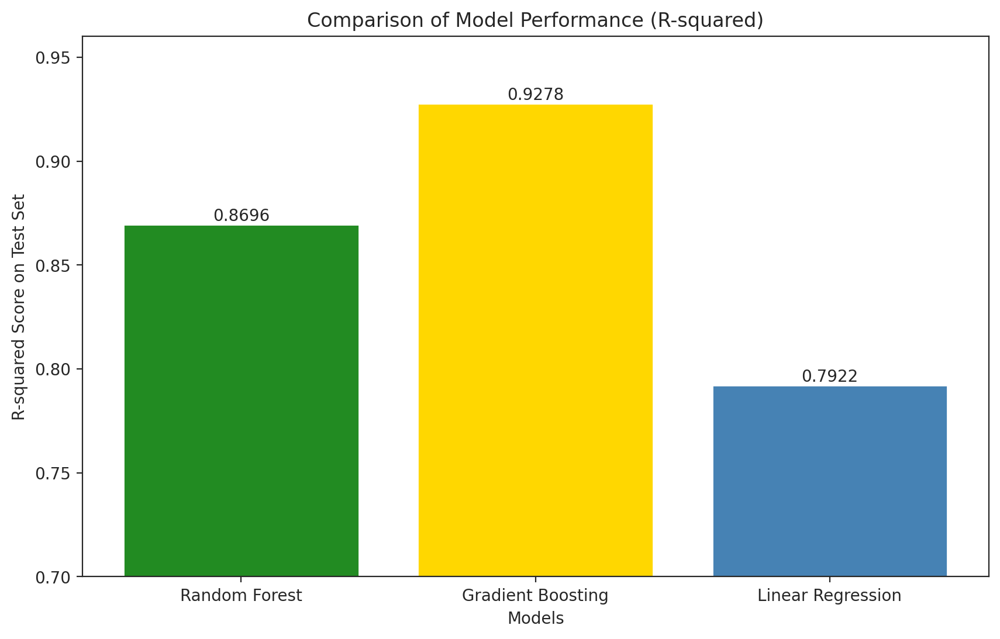

In [ ]:
# R-squared scores obtained from your models
#r2_score_rfr = best_rfr_pipe.score(X_test, y_test)
#r2_score_gbr = best_gbr_pipe.score(X_test, y_test)
#r2_score_lr = lr_regr.score(X_test, y_test)

# Now you can plot these R-squared scores to compare the performance
methods = ['Random Forest', 'Gradient Boosting', 'Linear Regression']
r2_scores = [best_rfr_test_r2 , best_gbr_test_r2 , lr_regr_test_r2]

# Define a list of colors for the bars
colors = ['forestgreen', 'gold', 'steelblue']

# Create a bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(methods, r2_scores, color=colors)
plt.xlabel('Models')
plt.ylabel('R-squared Score on Test Set')
plt.title('Comparison of Model Performance (R-squared)')

# Add the exact R-squared values on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval,
             round(yval, 4),
             ha='center', va='bottom')

plt.ylim(0.7, 0.96)  # R-squared range is 0 to 1
plt.show()


In [ ]:
my_models = [best_gbr_pipe,best_rfr_pipe,lr_regr]

In [ ]:
model_results_list = []
for my_model in my_models:
    eval_results = cross_validate(
        my_model, X, y, cv=5,
        scoring='neg_mean_absolute_error',
        return_train_score=True
    )
    model_results_list.append(
        (-eval_results['test_score'].mean(), eval_results['test_score'].std(),
         -eval_results['train_score'].mean(), eval_results['train_score'].std())
    )

In [ ]:
model_results = pd.DataFrame(
    model_results_list,
    columns=['test_mae_mean', 'test_mae_std', 'train_mae_mean', 'train_mae_std'],
    index=['best_gbr', 'best_rfr', 'lr_regr']
)

In [ ]:
model_results

,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
best_gbr,1572.300462,13.832781,1460.834232,3.662608
best_rfr,2135.187650,17.247506,2098.333460,11.360417
lr_regr,2902.833062,21.423692,2893.979091,4.874003


##ENSEMBLING MODEL

In [ ]:
for est in my_models:
    est.fit(X_train, y_train)

In [ ]:
ensemble = VotingRegressor(
    [
        ("gb", best_gbr_pipe),
        ("rf", best_rfr_pipe),
        ('lr', lr_regr)
    ]
)
ensemble.fit(X_train, y_train)

VotingRegressor(estimators=[('gb',
                             Pipeline(steps=[('pp',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer())]),
                                                                               ['mileage',
                                                                                'age']),
                                                                              ('cat',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer(strategy='most_frequent')),
                                                                                               ('enc',
                                                                                                TargetEncoder())]),
                                                                               ['colour',
                                                                                'make',
                                                                                'model',
                                                                                'vehicle_condition',
                                                                                'body_type',
                                                                                'crossov...
                                                                                               ('scaler',
                                                                                                MinMaxScaler()),
                                                                                               ('poly',
                                                                                                PolynomialFeatures(include_bias=False))]),
                                                                               ['mileage',
                                                                                'age']),
                                                                              ('cat',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer(strategy='most_frequent')),
                                                                                               ('enc',
                                                                                                TargetEncoder())]),
                                                                               ['colour',
                                                                                'make',
                                                                                'model',
                                                                                'vehicle_condition',
                                                                                'body_type',
                                                                                'crossover_car_and_van',
                                                                                'fuel_type'])],
                                                                verbose_feature_names_out=False)),
                                             ('est', LinearRegression())]))])

In [ ]:
eval_results = cross_validate(
    ensemble, X, y, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)
ensemble_result = (
    -eval_results['test_score'].mean(), eval_results['test_score'].std(),
    -eval_results['train_score'].mean(), eval_results['train_score'].std()
)

In [ ]:
model_results.loc['ensemble'] = ensemble_result

In [ ]:
model_results

,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
best_gbr,1572.300462,13.832781,1460.834232,3.662608
best_rfr,2135.187650,17.247506,2098.333460,11.360417
lr_regr,2902.833062,21.423692,2893.979091,4.874003
ensemble,2007.278600,14.118029,1960.682107,5.105803


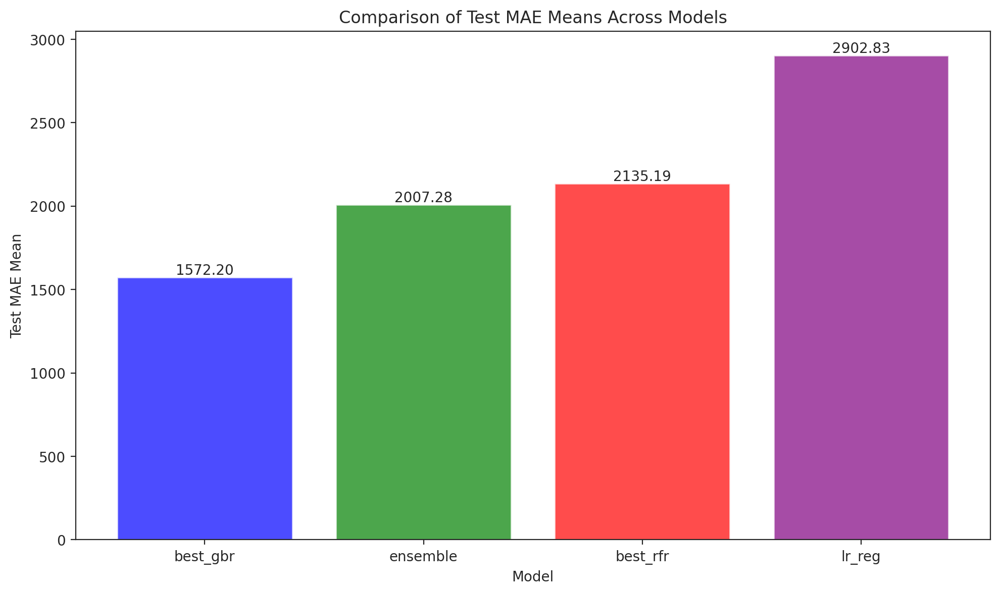

In [ ]:
import matplotlib.pyplot as plt

test_mae_means = {
    'best_gbr': 1572.204221,
    'ensemble': 2007.278600		,
    'best_rfr': 2135.187650	,
    'lr_reg':   2902.833062,

}

# Colors for each model
colors = ['blue', 'green', 'red', 'purple']

# Create a bar plot
plt.figure(figsize=(10, 6))  # You can adjust the figure size to your preference
plt.bar(test_mae_means.keys(), test_mae_means.values(), color=colors, alpha=0.7)

# Adding titles and labels
plt.title('Comparison of Test MAE Means Across Models')
plt.ylabel('Test MAE Mean')
plt.xlabel('Model')

# Optionally, add the exact MAE values on top of the bars
for i, (model, mae) in enumerate(test_mae_means.items()):
    plt.text(i, mae, f"{mae:.2f}", ha='center', va='bottom')

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
xt = X.head(20)
yt = y.head(20)
pred_gbr = best_gbr_pipe.predict(xt)
pred_rfr = best_rfr_pipe.predict(xt)
pred_lr_regr = lr_regr.predict(xt)
pred_ens = ensemble.predict(xt)

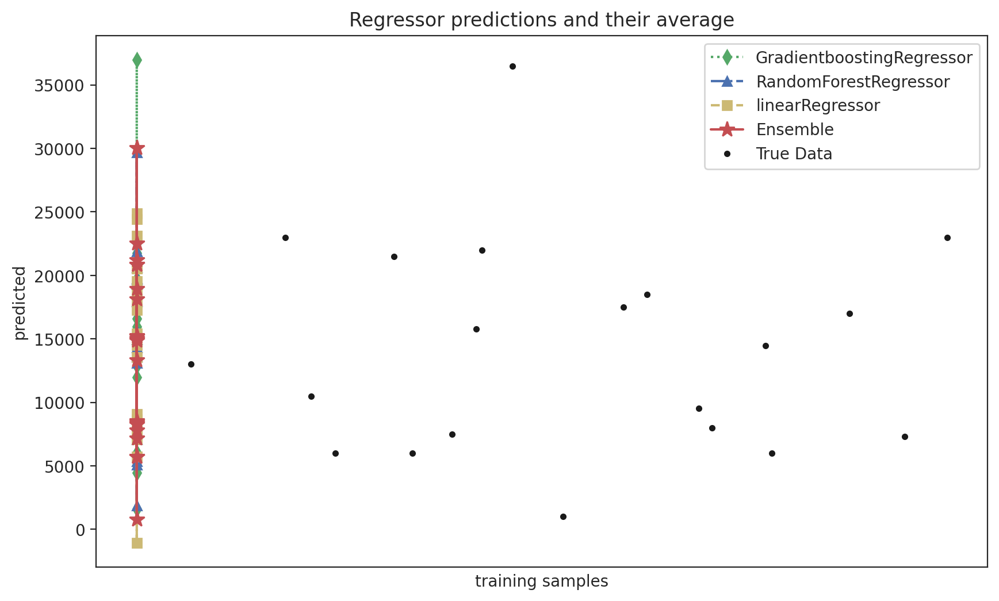

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

ax.plot(pred_gbr, "gd:", label="GradientboostingRegressor")
ax.plot(pred_rfr, "b^-.", label="RandomForestRegressor")
ax.plot(pred_lr_regr, "ys--", label="linearRegressor")
ax.plot(pred_ens, "r*-", ms=10, label="Ensemble")
ax.plot(yt, "ko", ms=3, label="True Data")

ax.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
ax.set_ylabel("predicted")
ax.set_xlabel("training samples")
ax.legend(loc="best")
ax.set_title("Regressor predictions and their average");

##Predicted vs actual Values

Random Forest Model

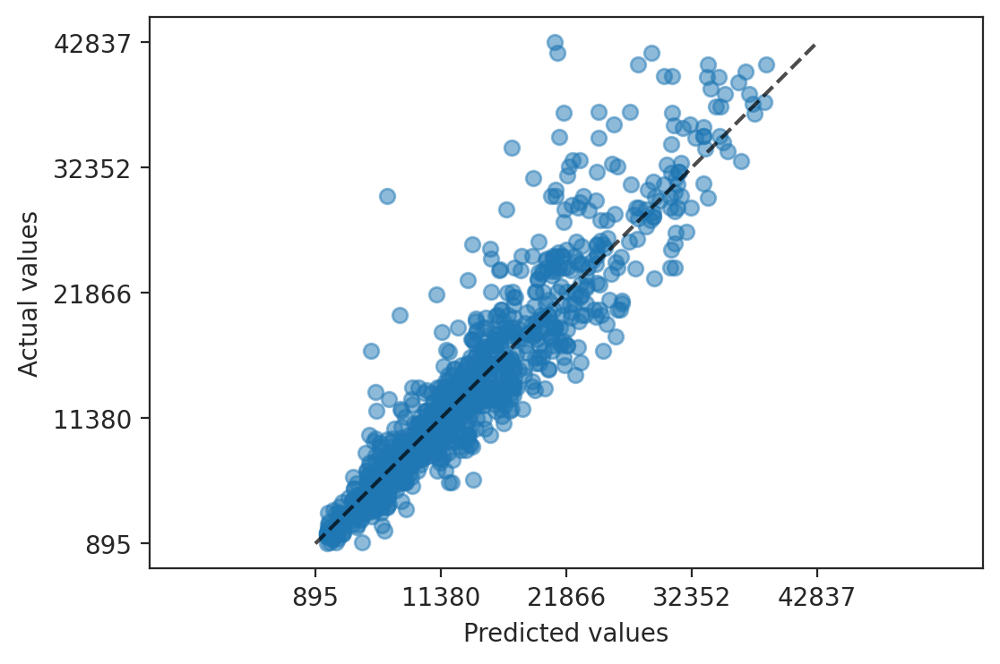

In [ ]:
from sklearn.metrics import PredictionErrorDisplay
PredictionErrorDisplay.from_estimator(
    best_rfr_pipe, X_train, y_train, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
)

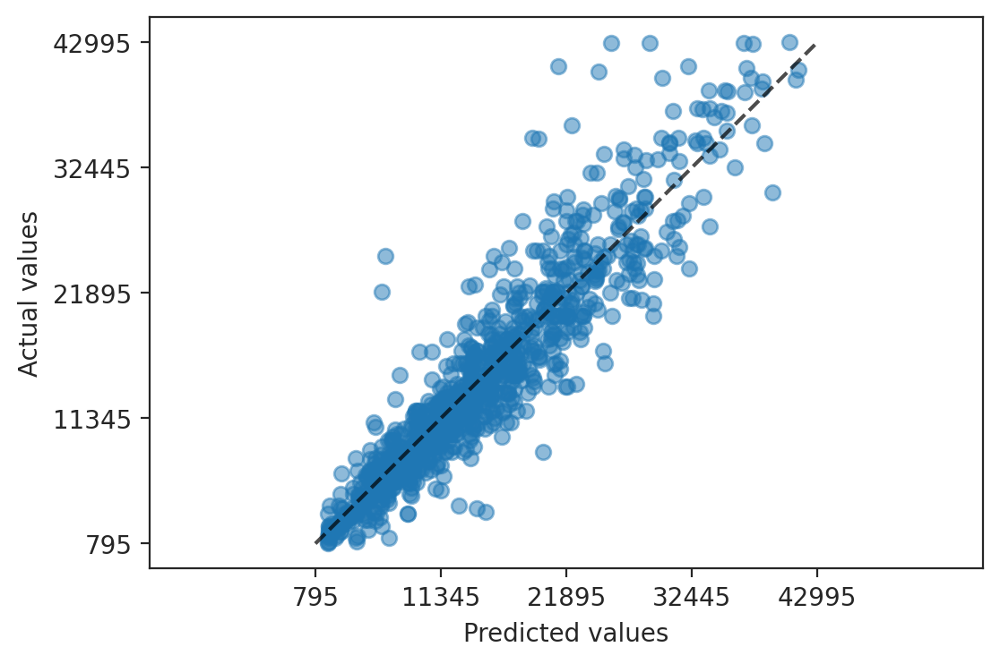

In [ ]:
from sklearn.metrics import PredictionErrorDisplay
PredictionErrorDisplay.from_estimator(
    best_rfr_pipe, X_test, y_test, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
)

Gradient Boosting Model

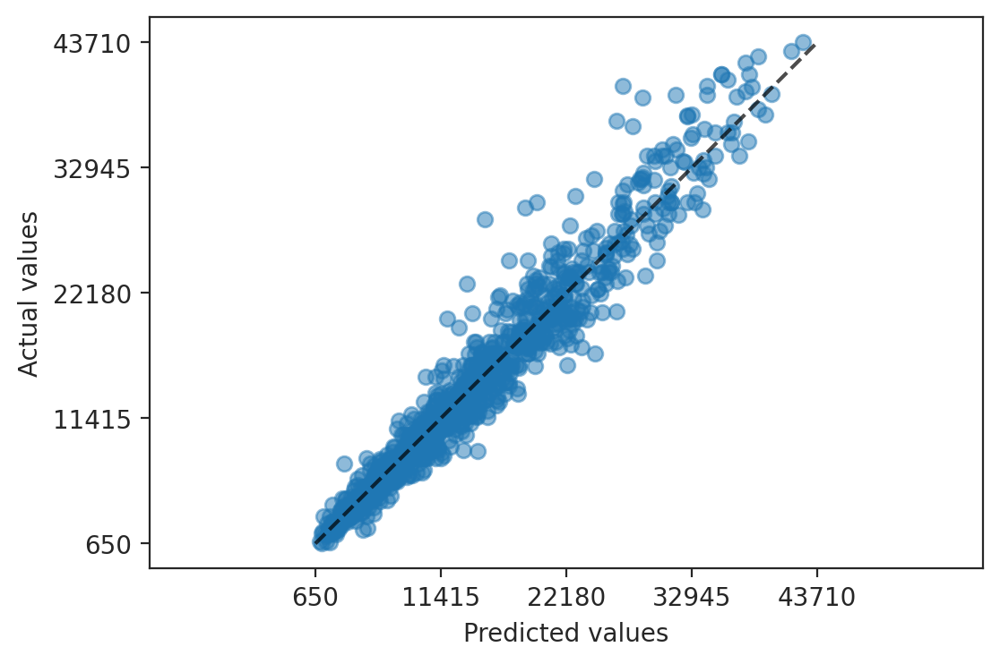

In [ ]:
from sklearn.metrics import PredictionErrorDisplay
PredictionErrorDisplay.from_estimator(
    best_gbr_pipe, X_train, y_train, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
)

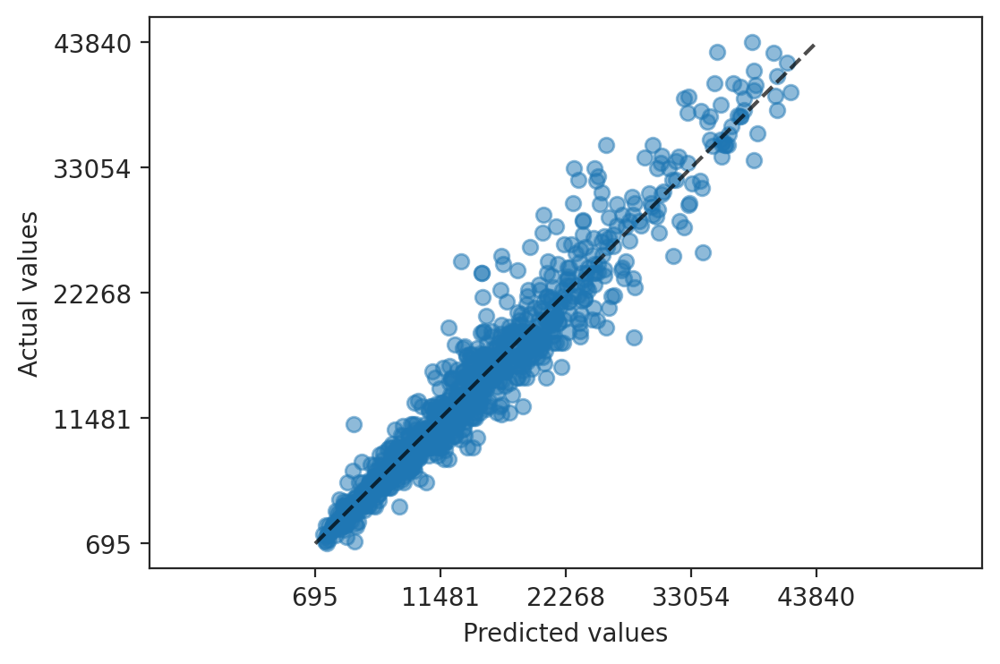

In [ ]:
from sklearn.metrics import PredictionErrorDisplay
PredictionErrorDisplay.from_estimator(
    best_gbr_pipe, X_test, y_test, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
)

Linear Regression Model

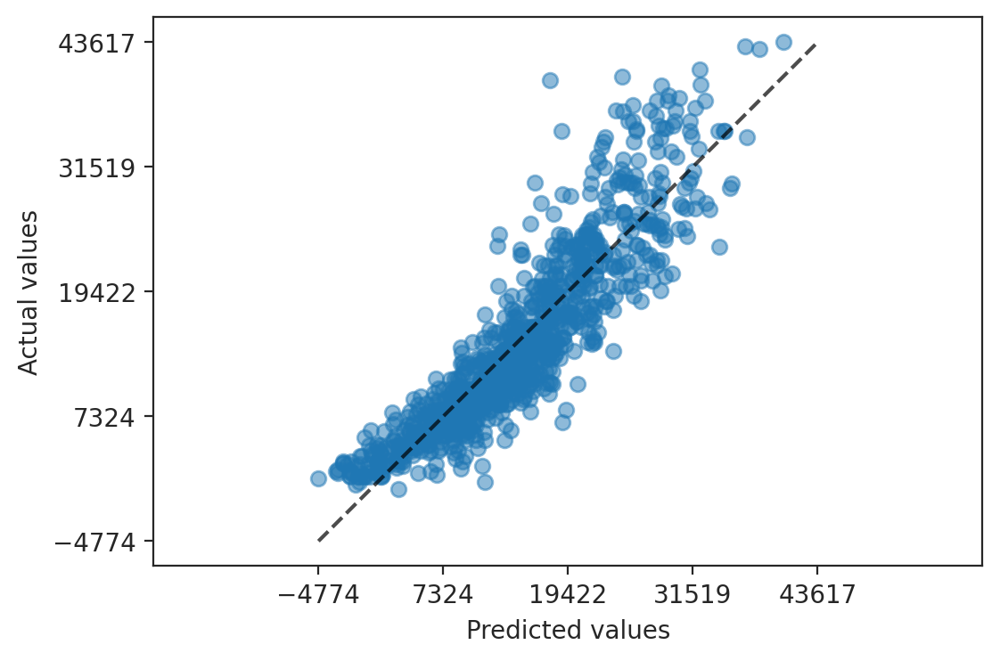

In [ ]:
from sklearn.metrics import PredictionErrorDisplay
PredictionErrorDisplay.from_estimator(
    lr_regr, X_train, y_train, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
)

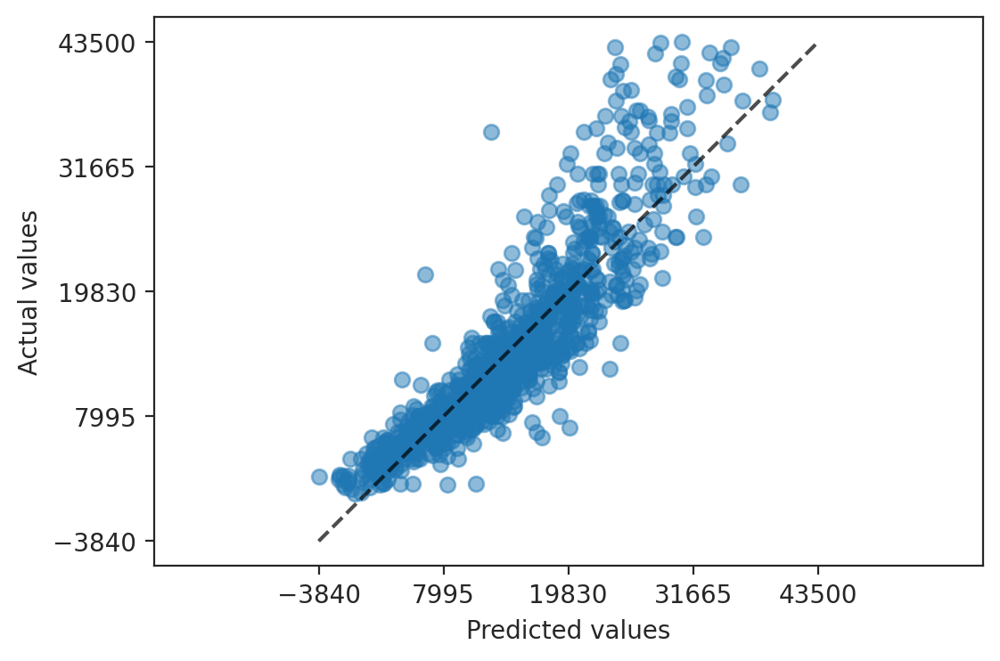

In [ ]:
from sklearn.metrics import PredictionErrorDisplay
PredictionErrorDisplay.from_estimator(
    lr_regr, X_test, y_test, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
)

Ensemble

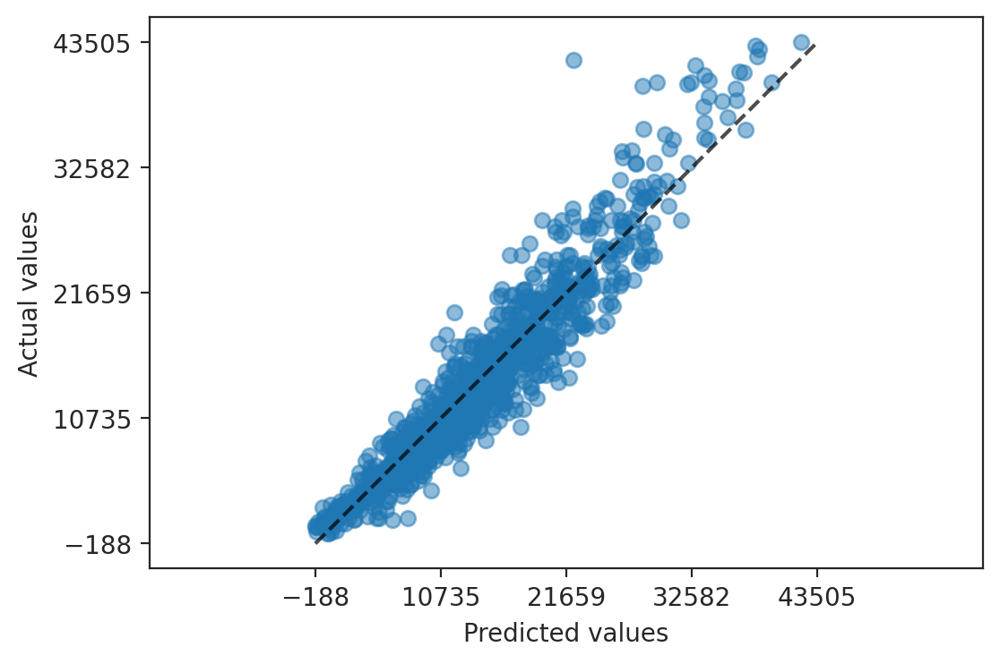

In [ ]:
from sklearn.metrics import PredictionErrorDisplay
PredictionErrorDisplay.from_estimator(
    ensemble, X_train, y_train, kind="actual_vs_predicted",
    scatter_kwargs=dict(alpha=0.5)
)

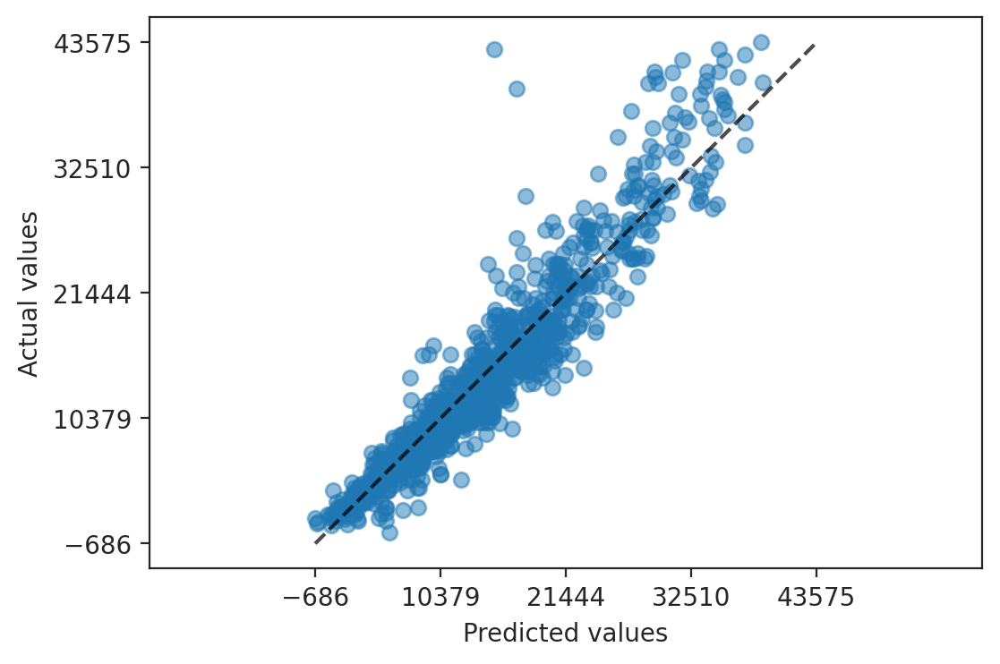

In [ ]:
from sklearn.metrics import PredictionErrorDisplay
PredictionErrorDisplay.from_estimator(
    ensemble, X_test, y_test, kind="actual_vs_predicted",
    scatter_kwargs=dict(alpha=0.5)
)

##SHAP


###Random Forest Tree

In [ ]:
# Not ideal, perhaps, but currently it makes life easier if one pre-processes
# the data used for SHAP computations
X_train_pp_rfr = best_rfr_pipe['pp'].transform(X_train)
column_names = X_train.columns
X_test_pp_rfr = best_rfr_pipe['pp'].transform(X_test)

In [ ]:
explainer = shap.TreeExplainer(best_rfr_pipe['est'], X_train_pp_rfr)
shap_values = explainer(X_test_pp_rfr, check_additivity=False)

100%|===================| 28897/28947 [03:39<00:00]       

In [ ]:

# Ask the explainer for the SHAP values on the test data
explanations = explainer(X_test_pp_rfr, check_additivity=False)

print(explanations.shape)

100%|===================| 28908/28947 [03:40<00:00]       

(28947, 9)


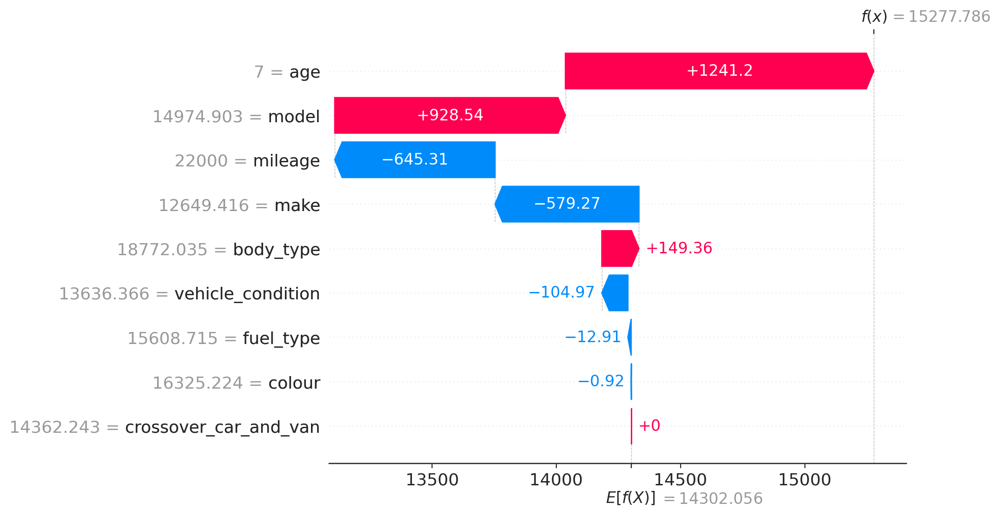

In [ ]:
shap.waterfall_plot(explanations[500])

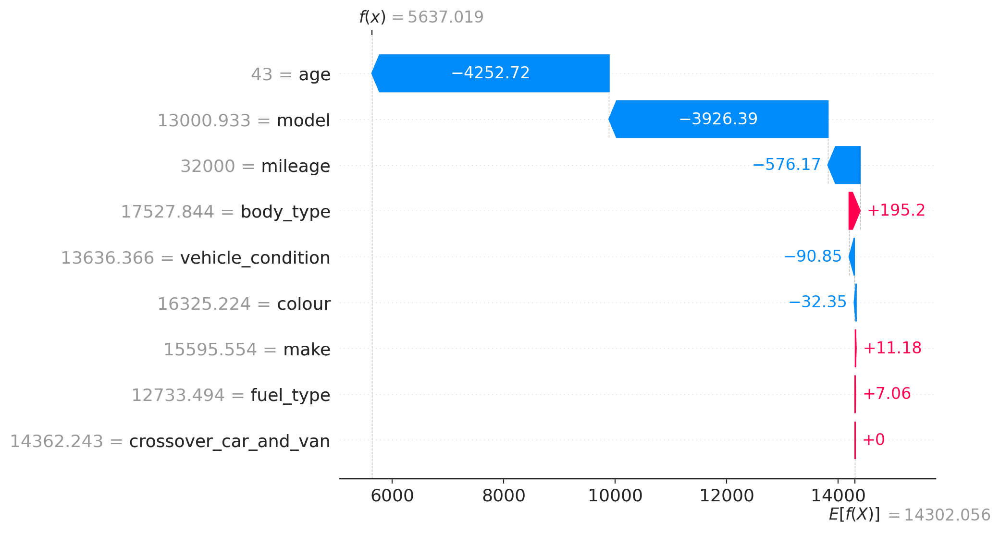

In [ ]:
shap.waterfall_plot(explanations[1])

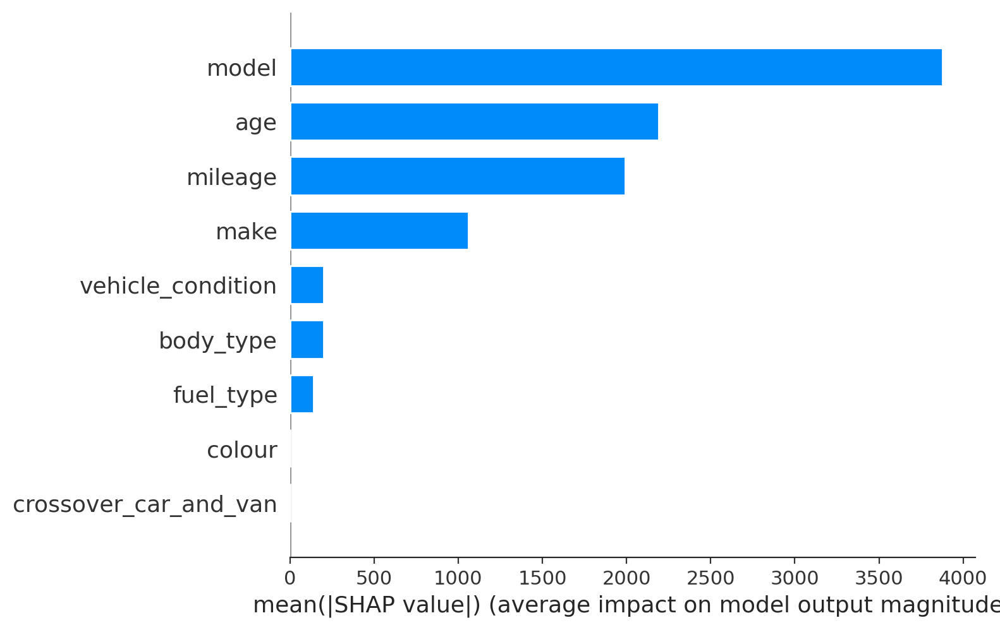

In [ ]:
shap.summary_plot(explanations, X_test_pp_rfr, plot_type="bar")

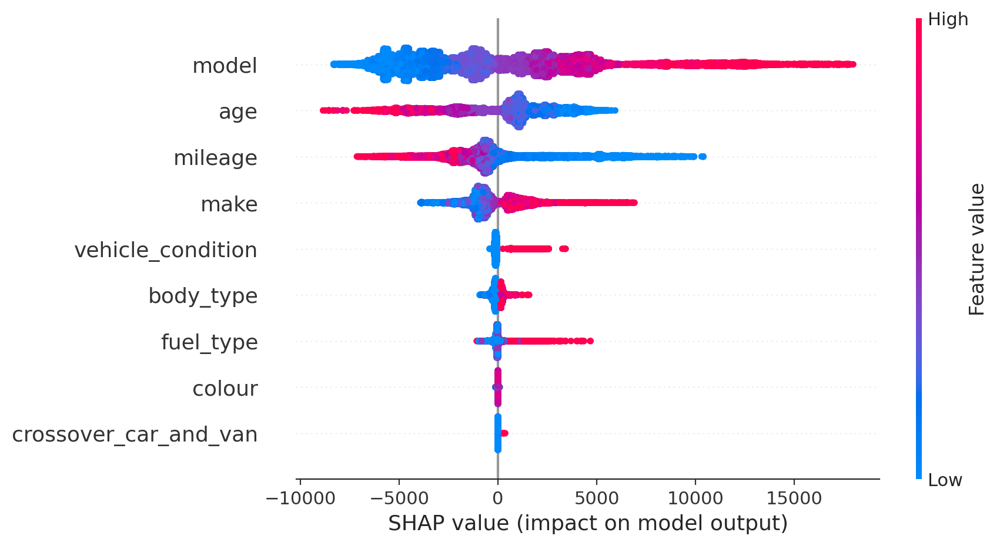

In [ ]:
# global model
shap.plots.beeswarm(shap_values)

In [ ]:
type(shap_values)

shap._explanation.Explanation

In [ ]:
#shap_values_df = pd.Dataframe(
    #shap_values, columns=column_names, index=X_test.index
#)
#shap_values_df

###Gradient Boosting Regressor SHAP

In [ ]:
# Not ideal, perhaps, but currently it makes life easier if one pre-processes
# the data used for SHAP computations
X_train_pp_gbr = best_gbr_pipe['pp'].transform(X_train)
column_names = X_train.columns
X_test_pp_gbr  = best_gbr_pipe['pp'].transform(X_test)

In [ ]:
explainer = shap.TreeExplainer(best_gbr_pipe['est'], X_train_pp_gbr)
shap_values = explainer(X_test_pp_gbr, check_additivity=False)

100%|===================| 28851/28947 [03:47<00:00]       

In [ ]:

# Ask the explainer for the SHAP values on the test data
explanations = explainer(X_test_pp_gbr, check_additivity=False)

print(explanations.shape)

100%|===================| 28918/28947 [03:51<00:00]       

(28947, 9)


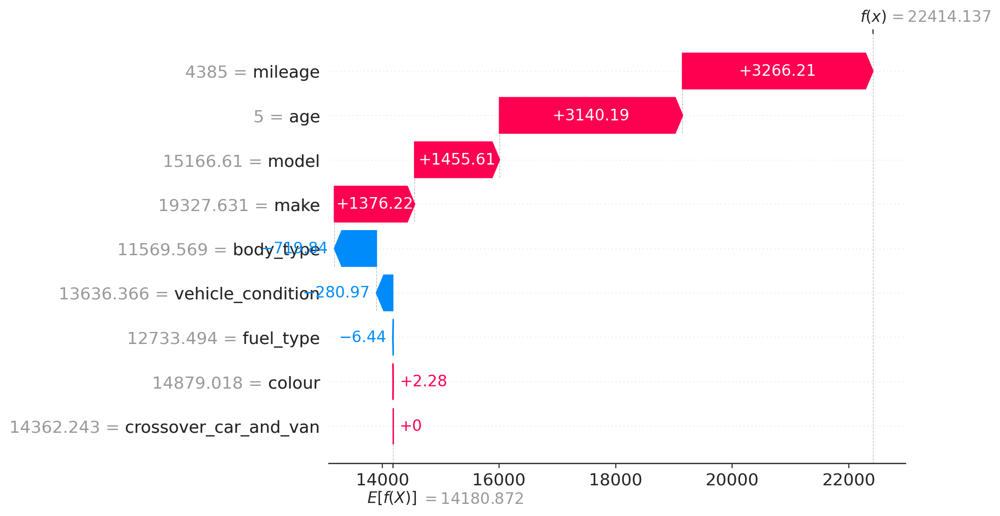

In [ ]:
shap.waterfall_plot(explanations[2])

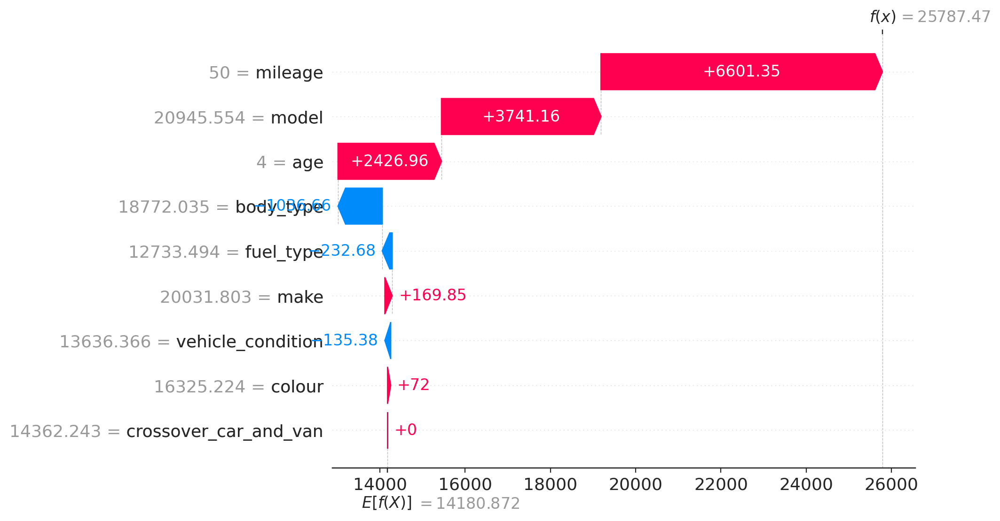

In [ ]:
shap.waterfall_plot(explanations[250])

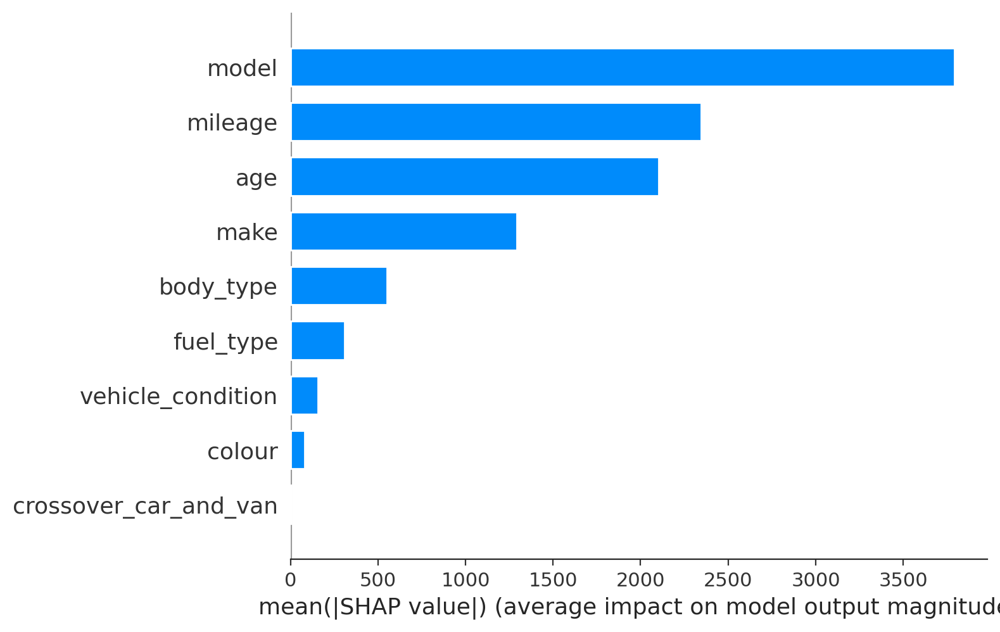

In [ ]:
shap.summary_plot(explanations, X_test_pp_gbr, plot_type="bar")

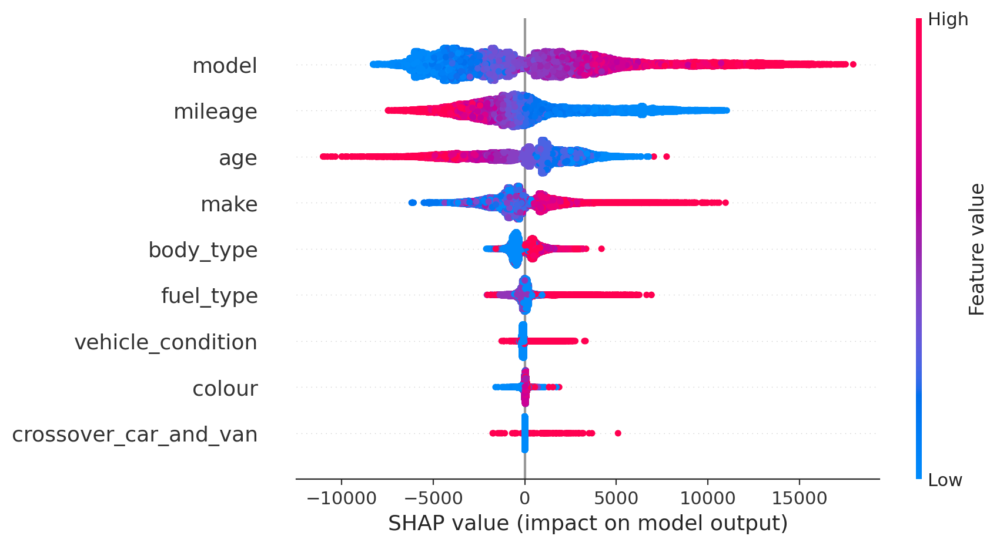

In [ ]:
# global model
shap.plots.beeswarm(shap_values)

### Scatter Plots

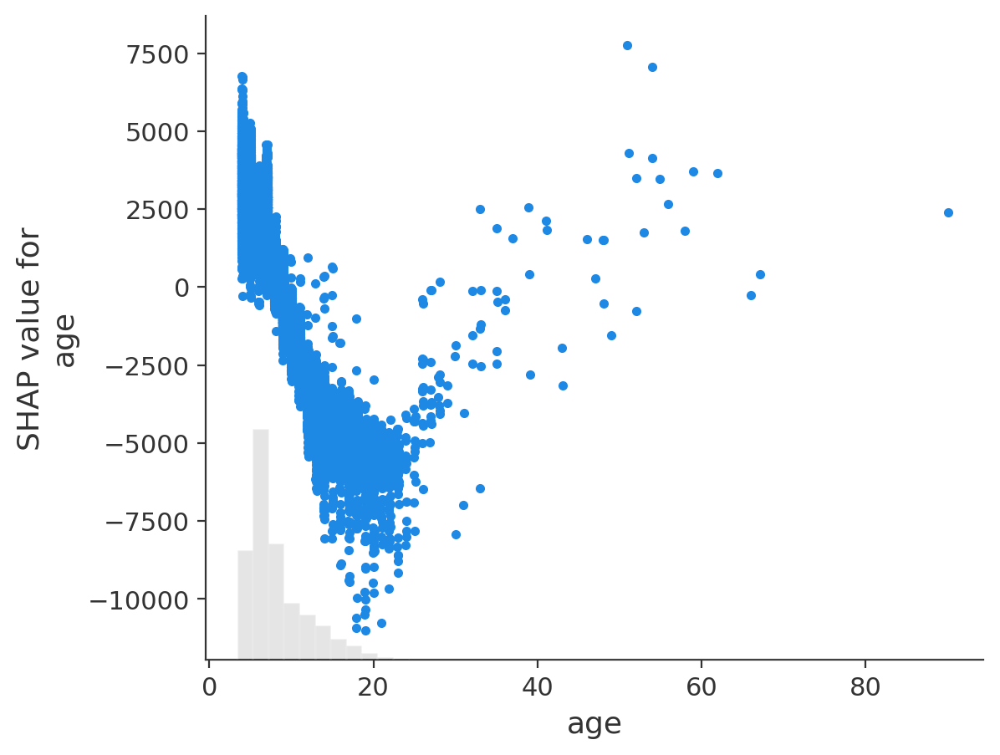

In [ ]:
shap.plots.scatter(shap_values[:, 'age'])

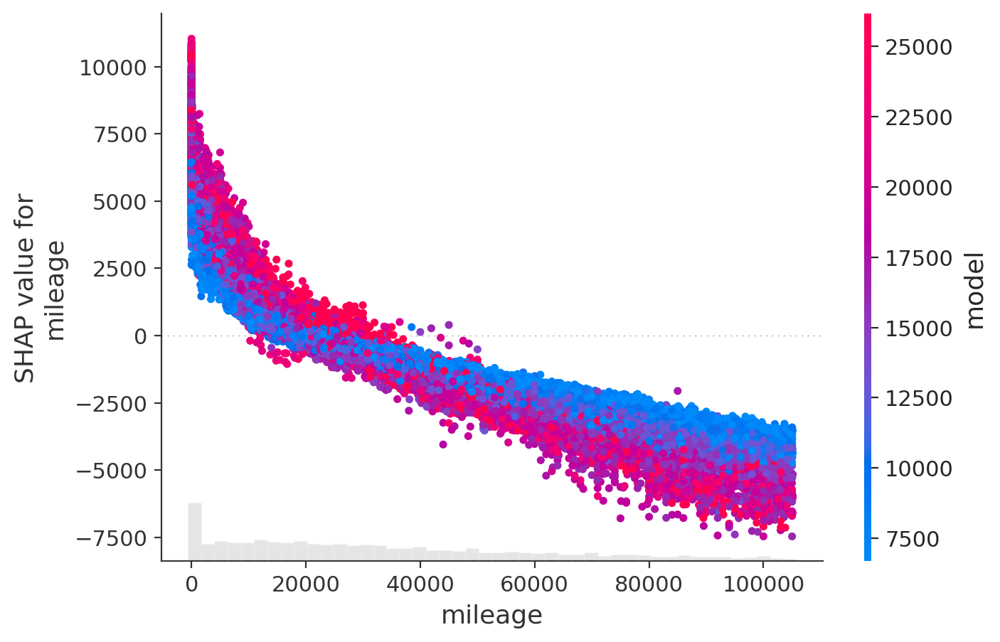

In [ ]:
shap.plots.scatter(shap_values[:,"mileage"], color=shap_values)


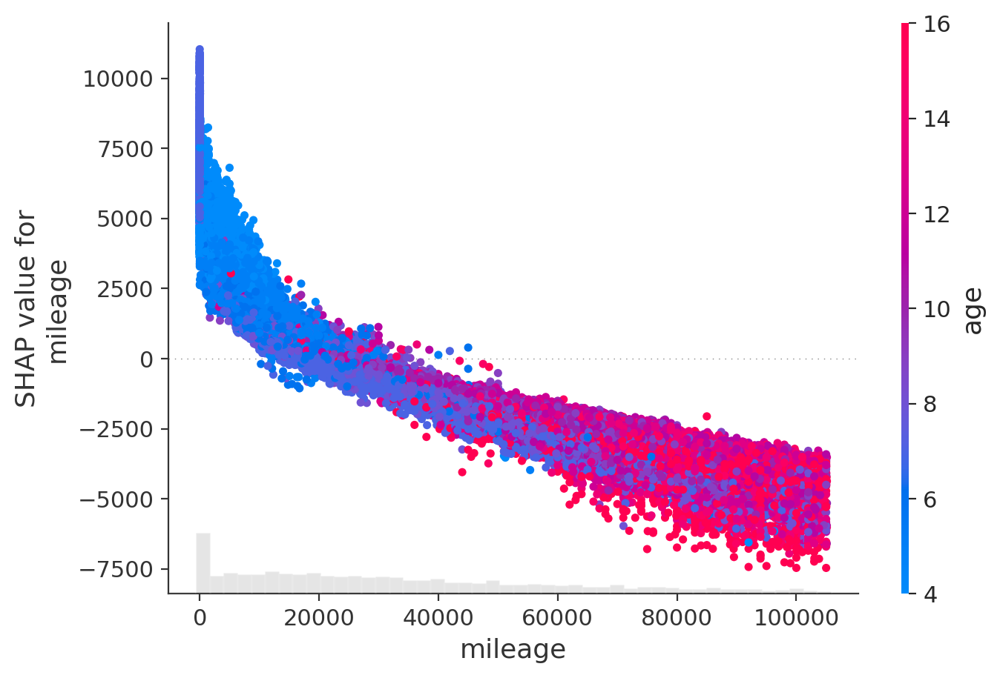

In [ ]:
shap.plots.scatter(shap_values[:,"mileage"], color=shap_values[:,"age"])

###SHAP Linear Regression

In [ ]:
X_train_pp_lr = lr_regr['pp'].transform(X_train)
column_names = X_train.columns
X_test_pp_lr  = lr_regr['pp'].transform(X_test)

In [ ]:
explainer = shap.LinearExplainer(lr_regr['est'], X_train_pp_lr)

In [ ]:
shap_values = explainer(X_test_pp_lr)

In [ ]:
# Ask the explainer for the SHAP values on the test data
explanations = explainer(X_test_pp_lr)

print(explanations.shape)

(28947, 12)


In [ ]:
shap_values.values

array([[-8.81158576e+03, -4.36261640e+03,  1.75987345e+03, ...,
         3.75884059e+02, -2.54461141e-12,  4.39240234e+02],
       [ 6.78474480e+02, -3.53031583e+04, -2.86392312e+02, ...,
         3.40928707e+02, -2.54461141e-12, -3.06012344e+02],
       [ 4.40029136e+03,  3.88819476e+03, -5.03625384e+02, ...,
        -2.34598913e+02, -2.54461141e-12, -3.06012344e+02],
       ...,
       [-8.82573715e+03, -8.48802198e+03,  1.76452567e+03, ...,
         3.40928707e+02, -2.54461141e-12, -3.06012344e+02],
       [ 6.78474480e+02, -4.36261640e+03, -2.86392312e+02, ...,
         3.40928707e+02, -2.54461141e-12, -3.06012344e+02],
       [ 3.35537931e+03,  1.82549197e+03, -4.75929374e+02, ...,
        -3.34652595e+02, -2.54461141e-12, -3.06012344e+02]])

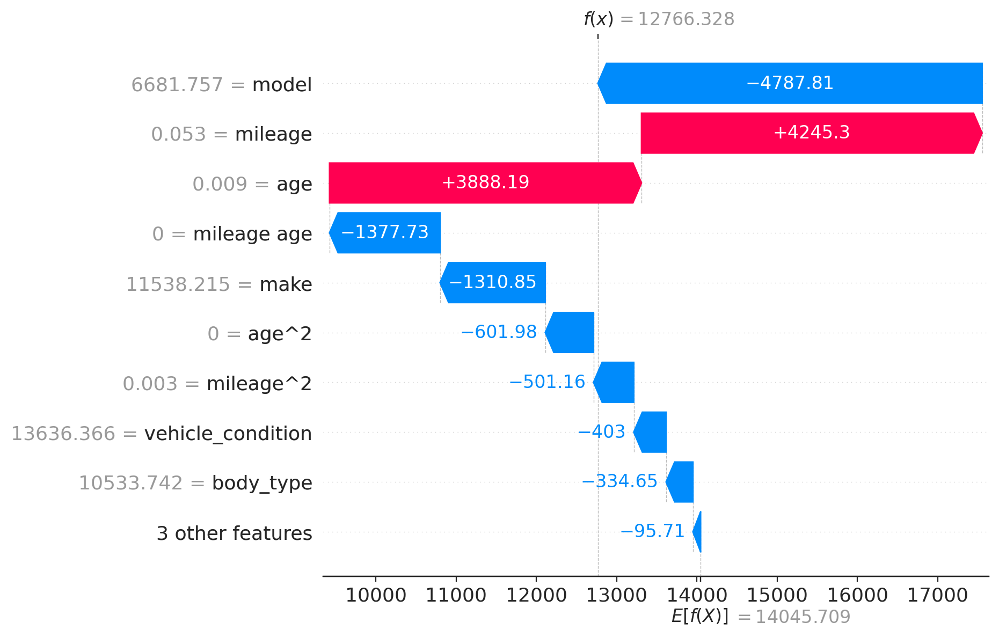

In [ ]:
# for a random instance
shap.plots.waterfall(shap_values[200])

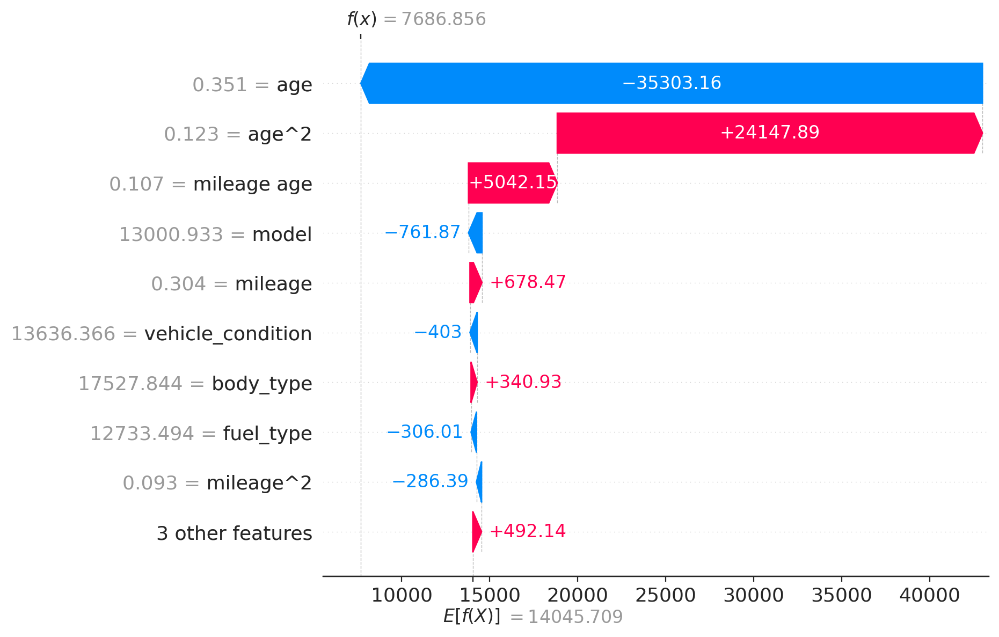

In [ ]:
# for a random instance
shap.plots.waterfall(shap_values[1])

###Gobal Summary Plot

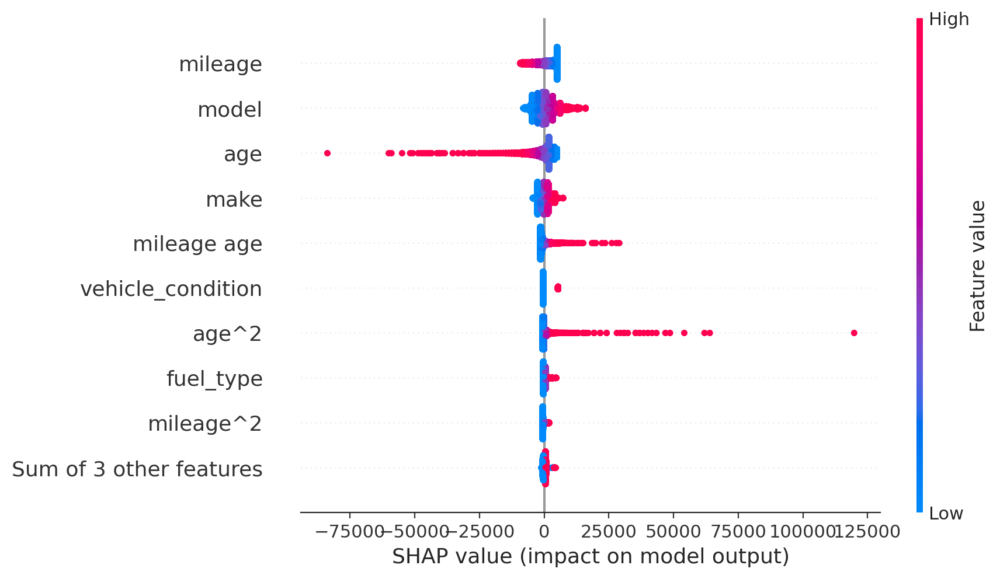

In [ ]:
# global model
shap.plots.beeswarm(shap_values)

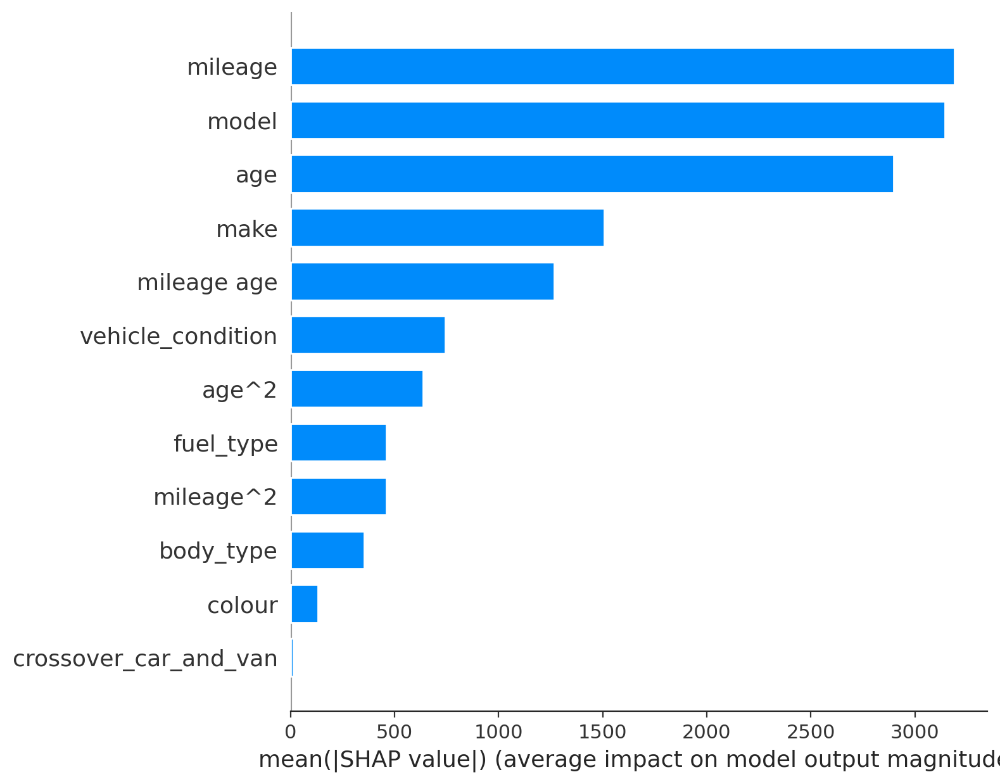

In [ ]:
shap.summary_plot(explanations, X_test_pp_lr, plot_type="bar")

###SHAP Scatter Plots

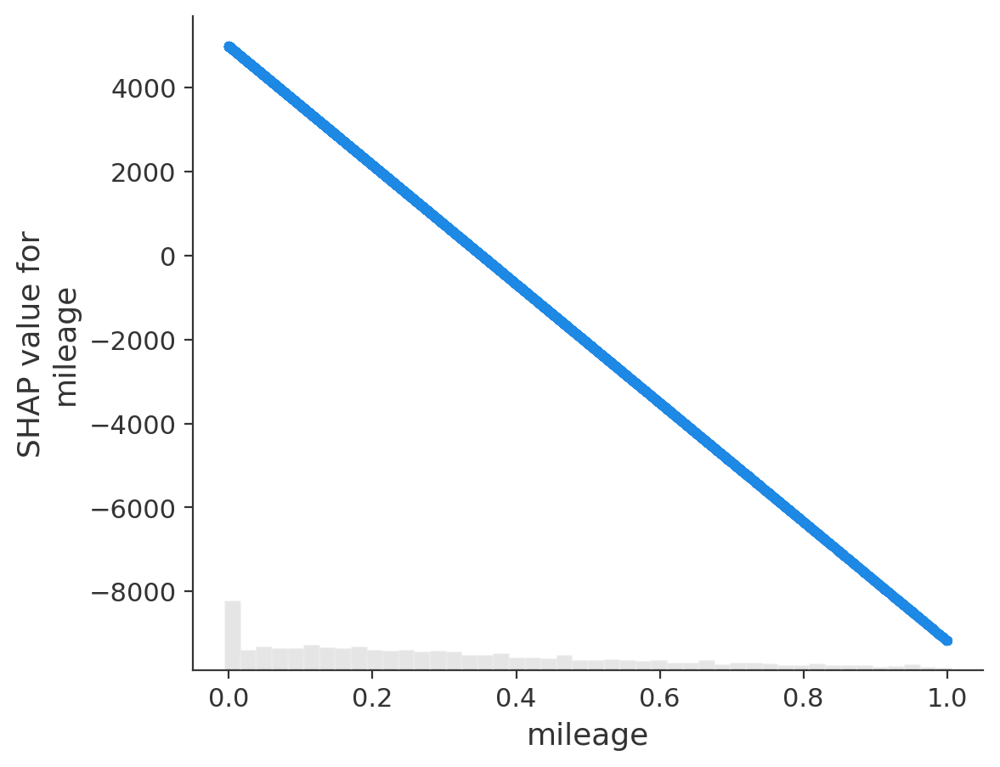

In [ ]:
shap.plots.scatter(shap_values[:, 'mileage'])

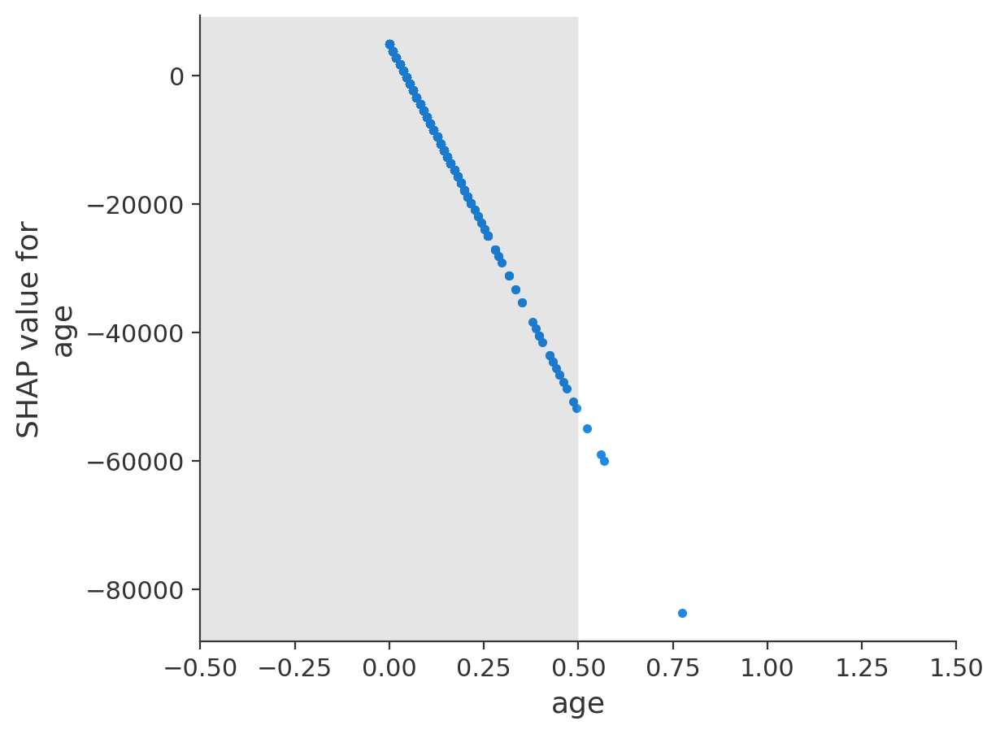

In [ ]:
shap.plots.scatter(shap_values[:, 'age'])

###PDP PLOT

###Random forest Tree

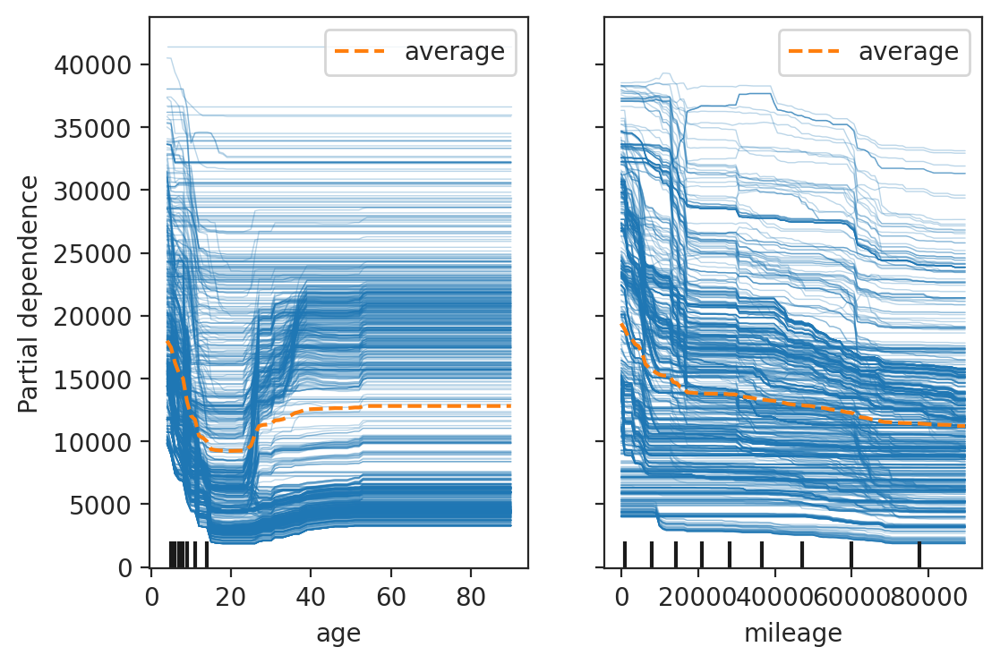

In [ ]:
PartialDependenceDisplay.from_estimator(
    best_rfr_pipe, X_test, features=['age', 'mileage'], kind='both'
);

In [ ]:
older_cars =autos[autos['age']>=20]
older_cars

,mileage,colour,make,model,vehicle_condition,price,body_type,crossover_car_and_van,fuel_type,age
326864,82348.0,Grey,SKODA,Fabia,USED,1785,Hatchback,False,Petrol,20
314483,59000.0,Blue,Mercedes-Benz,SL Class,USED,12800,Convertible,False,Petrol,21
326831,82822.0,Multicolour,Rover,Mini,USED,10000,Saloon,False,Petrol,26
77431,47960.0,Grey,Porsche,911,USED,30995,Coupe,False,Petrol,21
252711,82000.0,Blue,Volkswagen,Golf,USED,2149,Hatchback,False,Petrol,20
...,...,...,...,...,...,...,...,...,...,...
156011,91262.0,Black,Mercedes-Benz,CLK,USED,6495,Convertible,False,Petrol,23
226436,58857.0,NaN,Mercedes-Benz,SL Class,USED,15000,Convertible,False,Petrol,26
240740,98000.0,Silver,Volvo,S60,USED,1595,Saloon,False,Petrol,21
21061,57000.0,Blue,MG,MGF,USED,2995,Convertible,False,Petrol,24


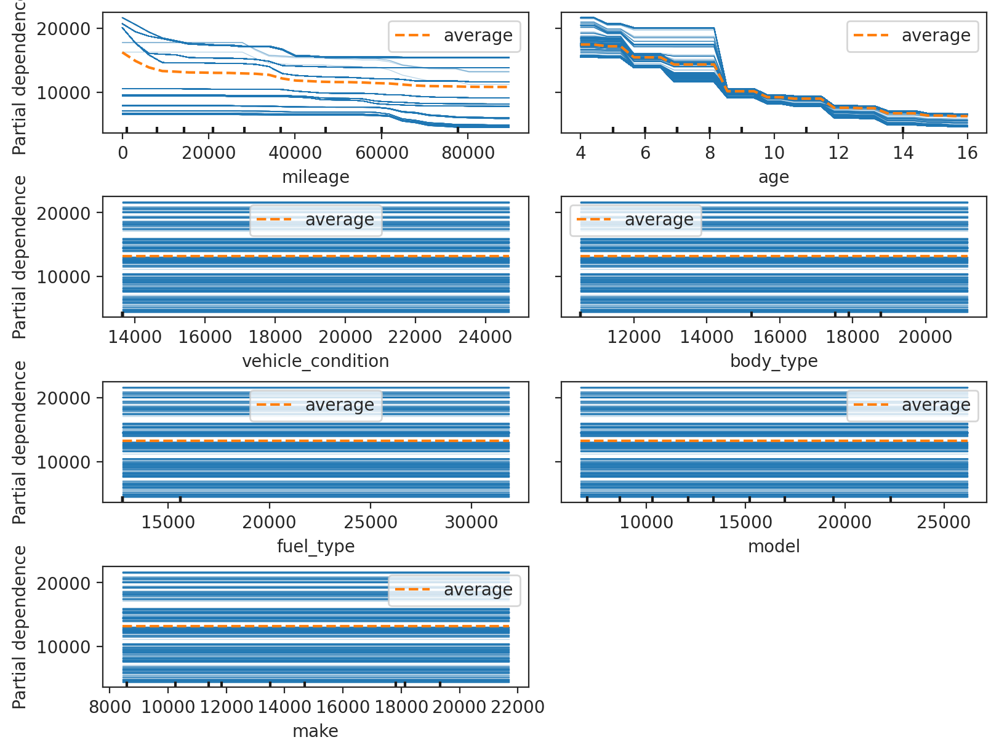

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_rfr_pipe, X_test_pp_rfr, features=['mileage', 'age', 'vehicle_condition', 'body_type', 'fuel_type', 'model', 'make'],
    kind='both',
    grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

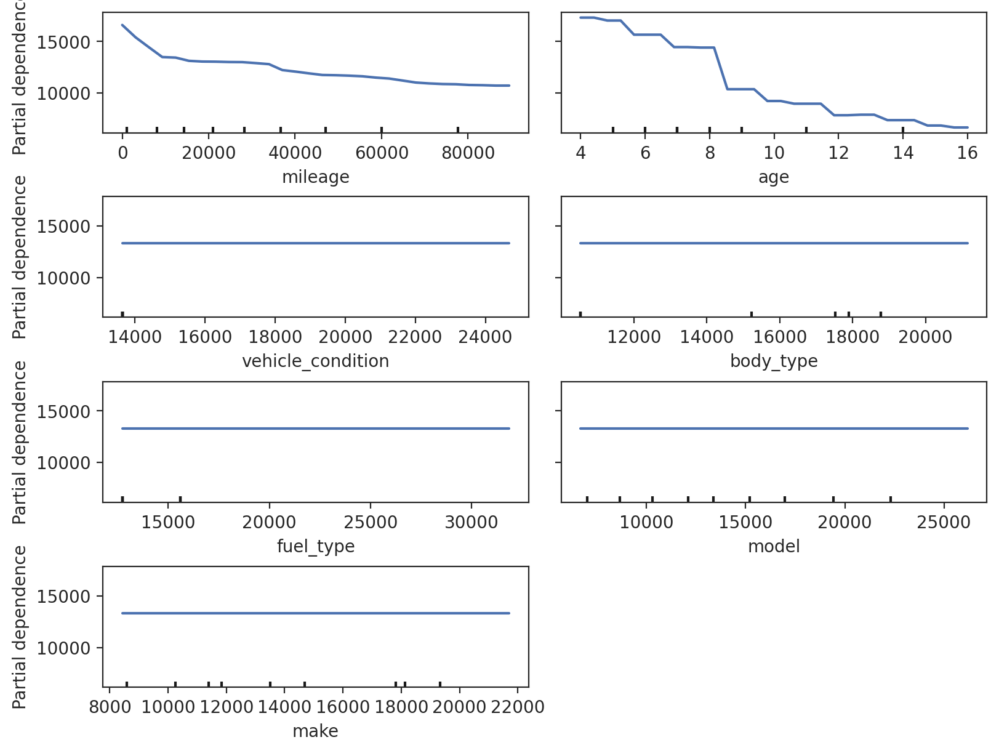

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_rfr_pipe, X_test_pp_rfr, features=['mileage', 'age', 'vehicle_condition', 'body_type', 'fuel_type', 'model', 'make'],
    kind='average',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

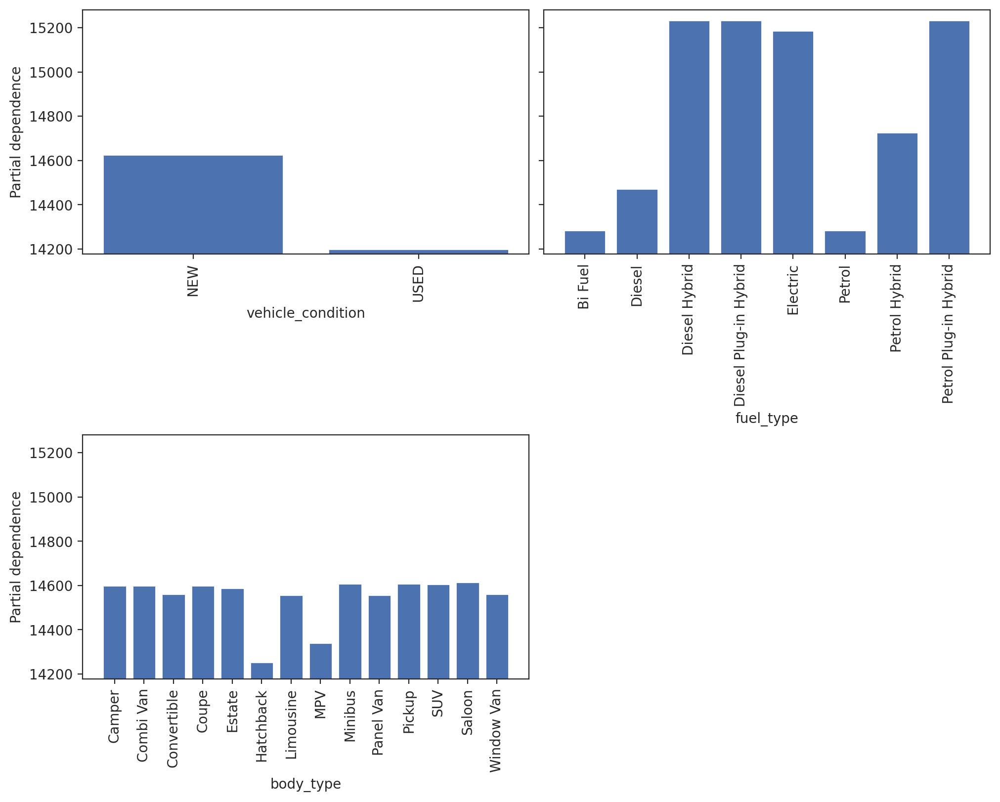

In [ ]:
fig, ax = plt.subplots(figsize=(10,8), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_rfr_pipe, X_test, features=['vehicle_condition', 'fuel_type', 'body_type'],
    categorical_features=['vehicle_condition', 'fuel_type', 'body_type'],
    kind='average', ax=ax, n_cols=2
);

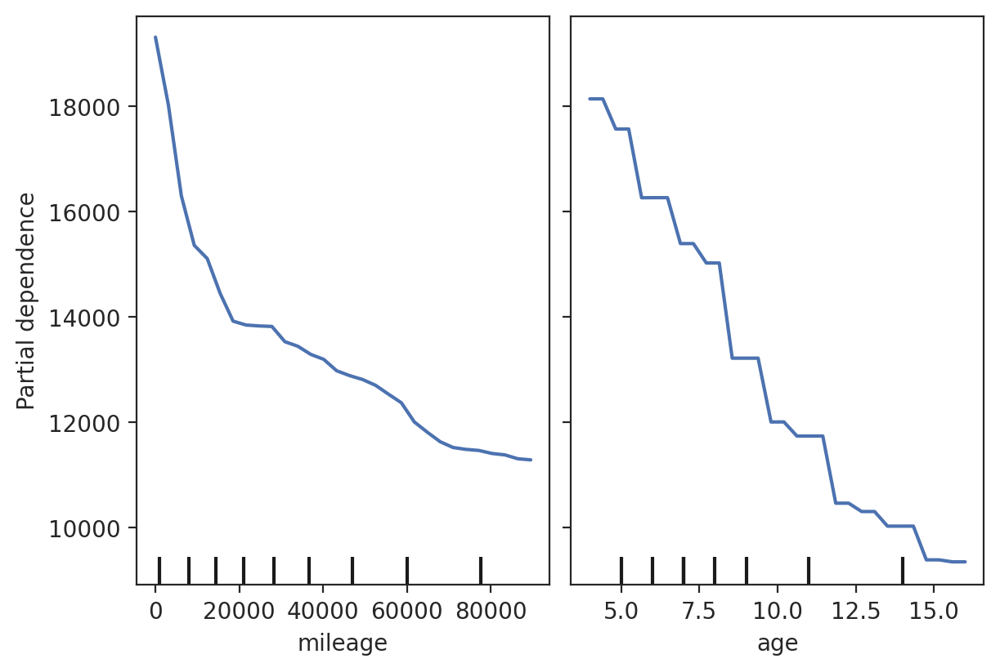

In [ ]:
fig, ax = plt.subplots (constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_rfr_pipe, X_test, features=['mileage', 'age'],
    kind='average',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

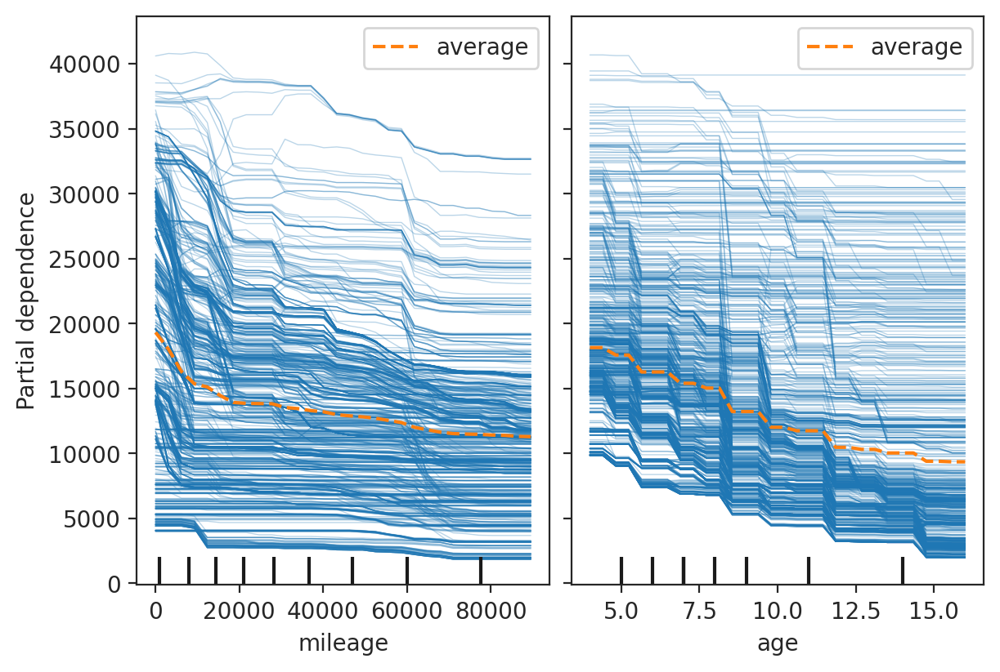

In [ ]:
fig, ax = plt.subplots (constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_rfr_pipe, X_test, features=['mileage', 'age'],
    kind='both',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

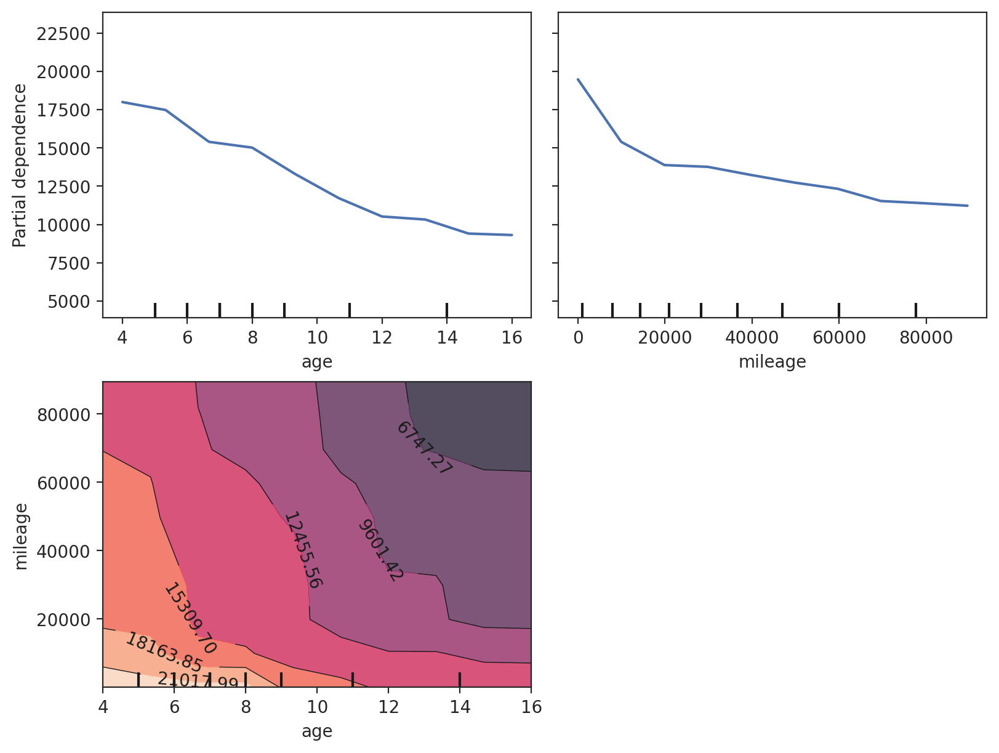

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
  best_rfr_pipe, X_test, features=['age', 'mileage', ('age', 'mileage')],
    kind='average',
    subsample=1000, grid_resolution=10, random_state=0,
    ax=ax, n_cols=2
);

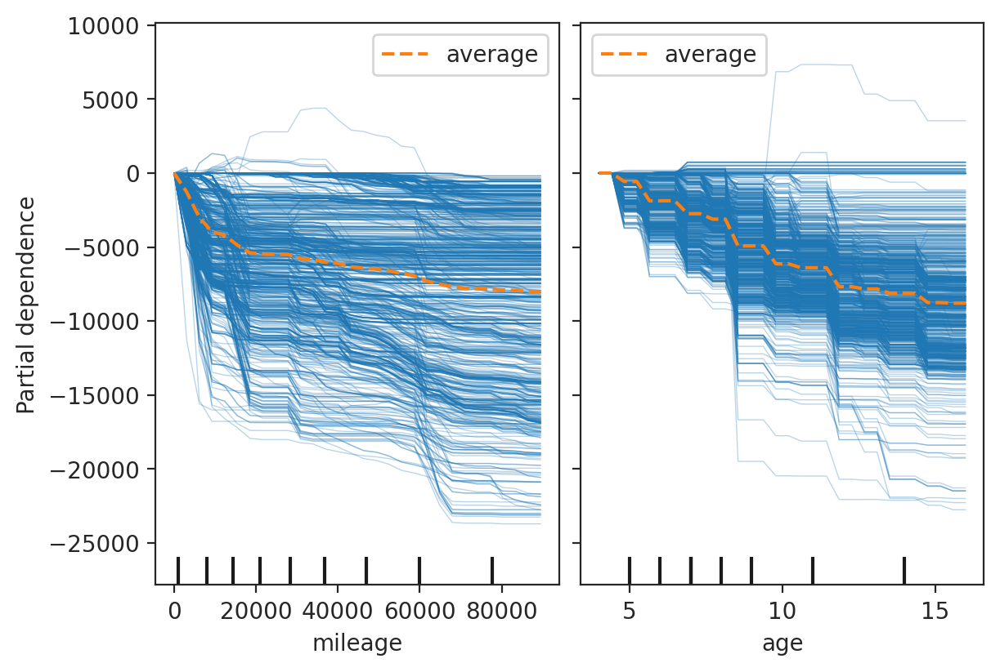

In [ ]:
fig, ax = plt.subplots(figsize=(6,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_rfr_pipe, X_test, features=['mileage', 'age'],
    kind='both', centered=True,
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

###Gradient Boosting Regressor

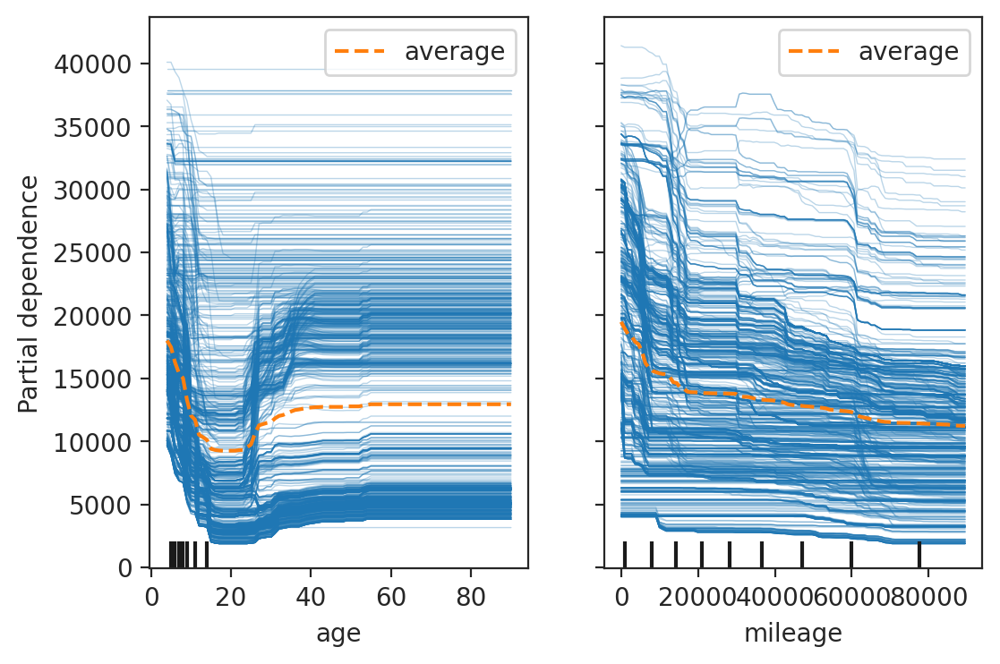

In [ ]:
PartialDependenceDisplay.from_estimator(
    best_rfr_pipe, X_test, features=['age', 'mileage'], kind='both'
);

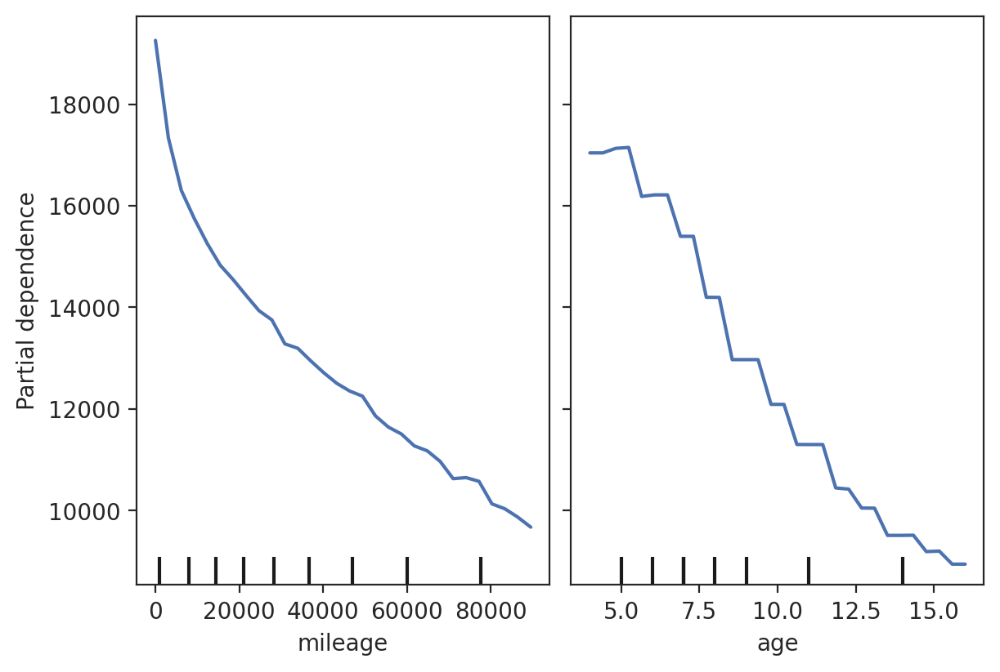

In [ ]:
fig, ax = plt.subplots (constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_gbr_pipe, X_test, features=['mileage', 'age'],
    kind='average',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2);

Creating legend with loc="best" can be slow with large amounts of data.


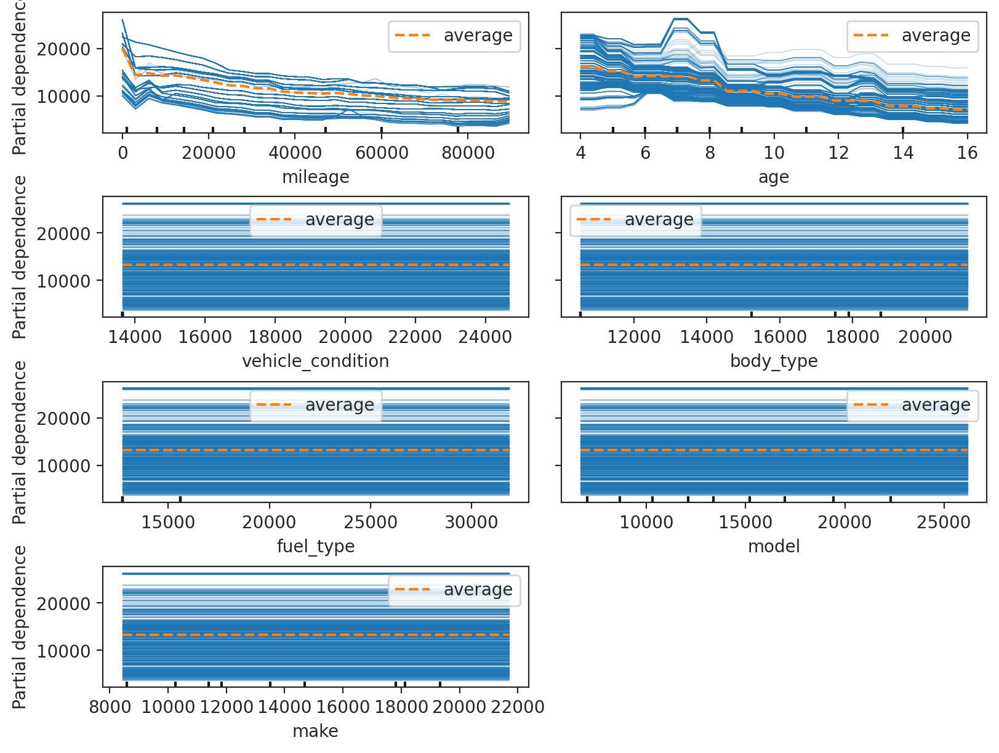

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_gbr_pipe, X_test_pp_gbr, features=['mileage', 'age', 'vehicle_condition', 'body_type', 'fuel_type', 'model', 'make'],
    kind='both',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=32,
    ax=ax, n_cols=2
);

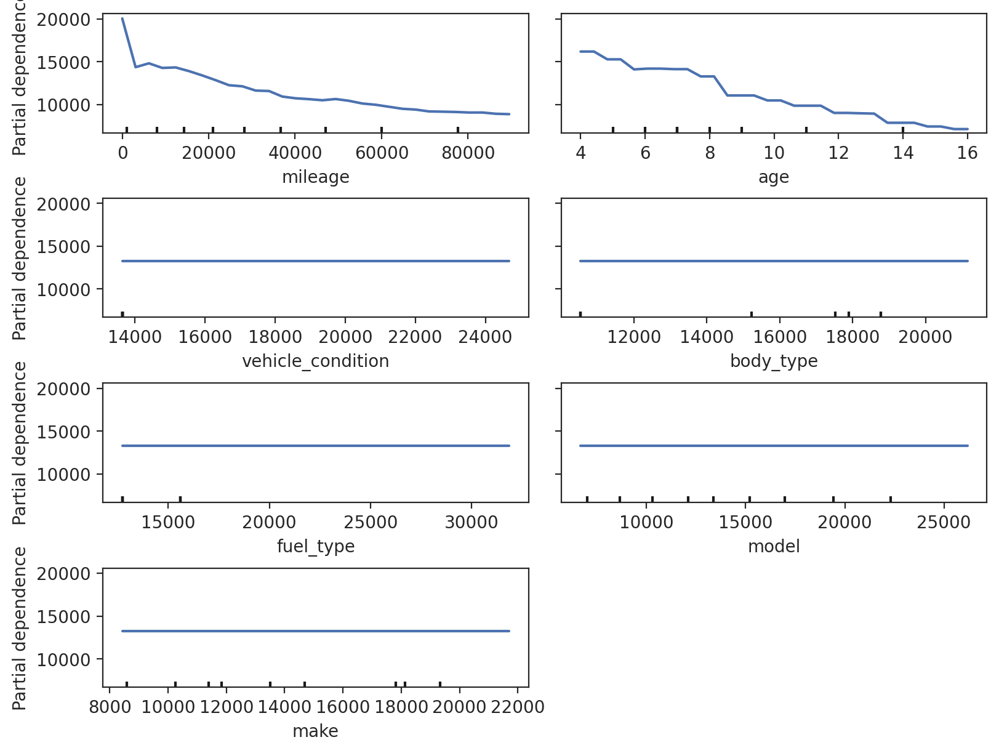

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_gbr_pipe, X_test_pp_gbr, features=['mileage', 'age', 'vehicle_condition', 'body_type', 'fuel_type', 'model', 'make'],
    kind='average',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

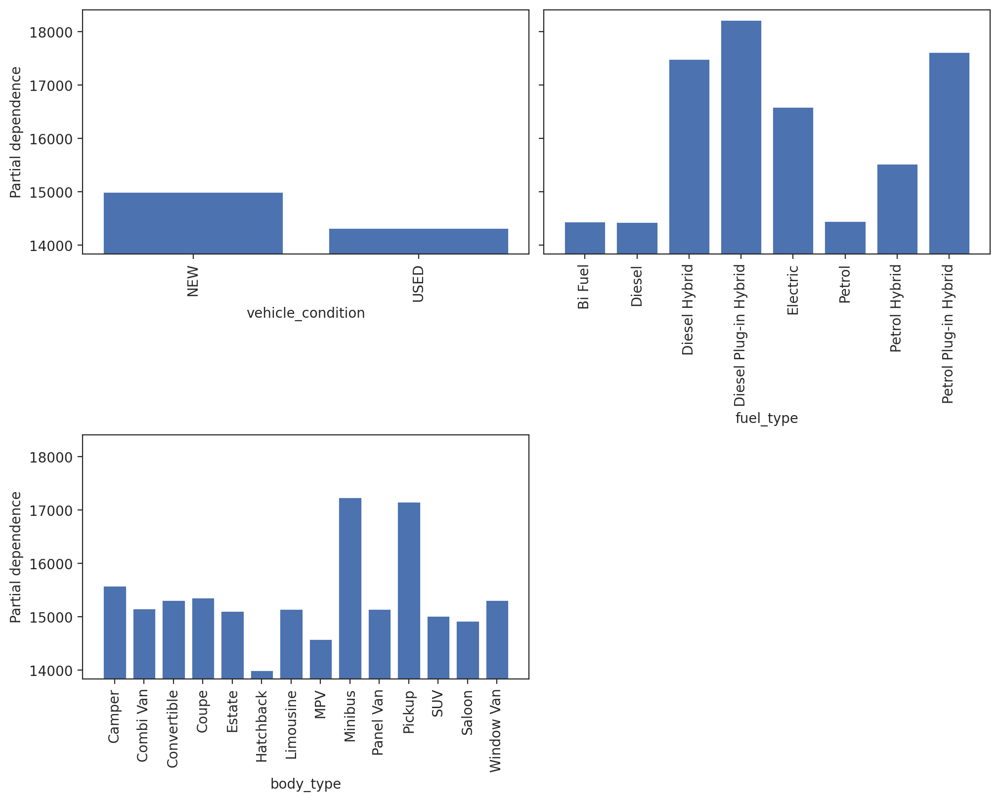

In [ ]:
fig, ax = plt.subplots(figsize=(10,8), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_gbr_pipe, X_test, features=['vehicle_condition', 'fuel_type', 'body_type'],
    categorical_features=['vehicle_condition', 'fuel_type', 'body_type'],
    kind='average', ax=ax, n_cols=2
);

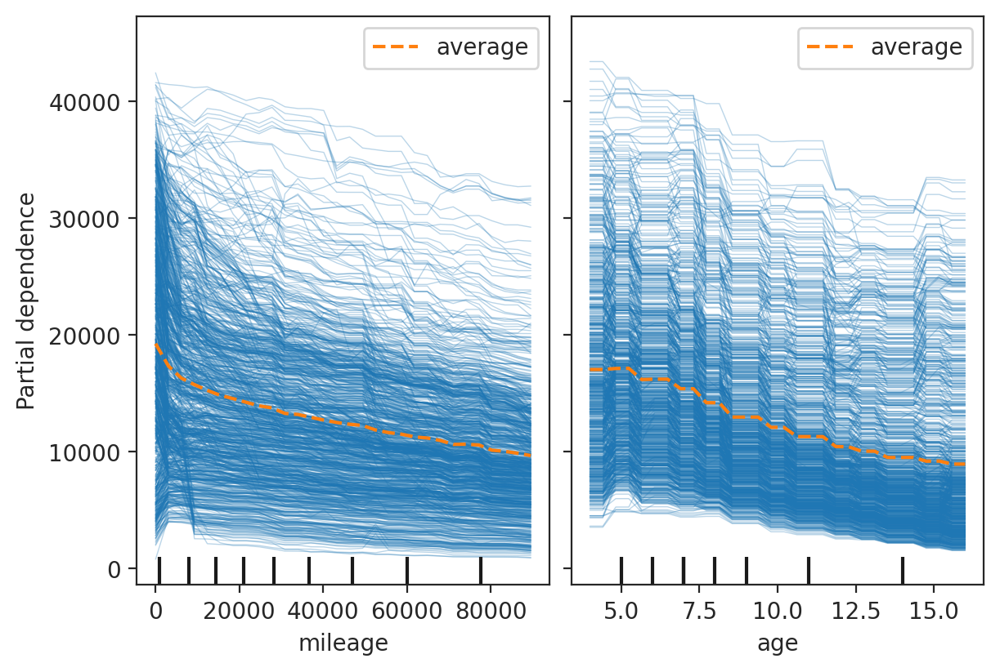

In [ ]:
fig, ax = plt.subplots (constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_gbr_pipe, X_test, features=['mileage', 'age'],
    kind='both',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

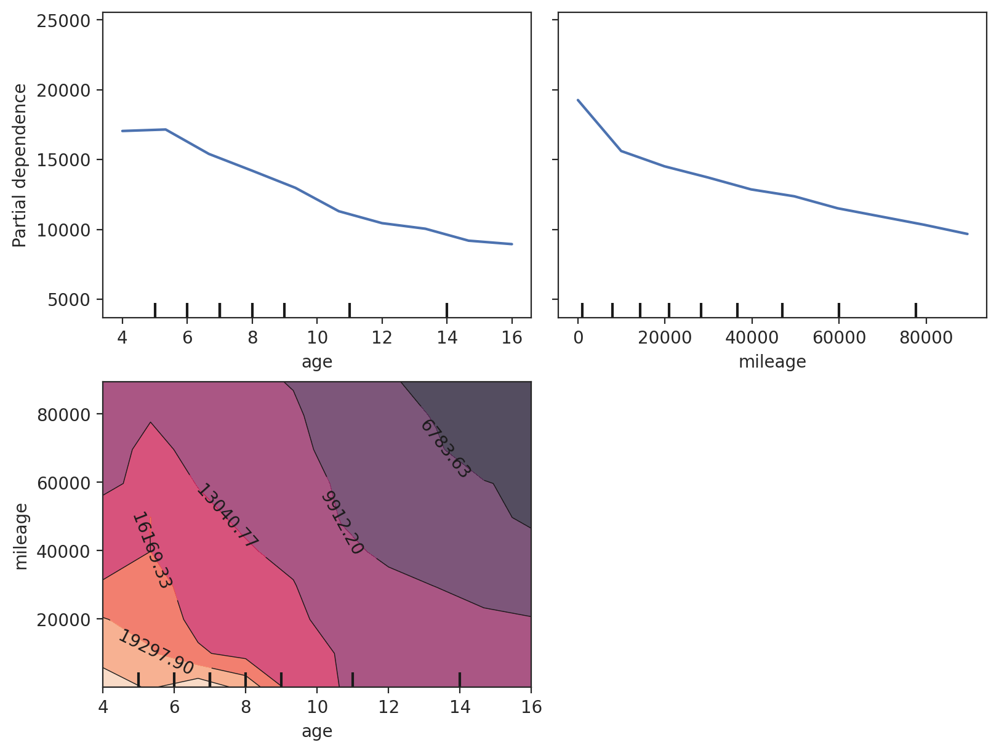

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
  best_gbr_pipe, X_test, features=['age', 'mileage', ('age', 'mileage')],
    kind='average',
    subsample=1000, grid_resolution=10, random_state=0,
    ax=ax, n_cols=2
);

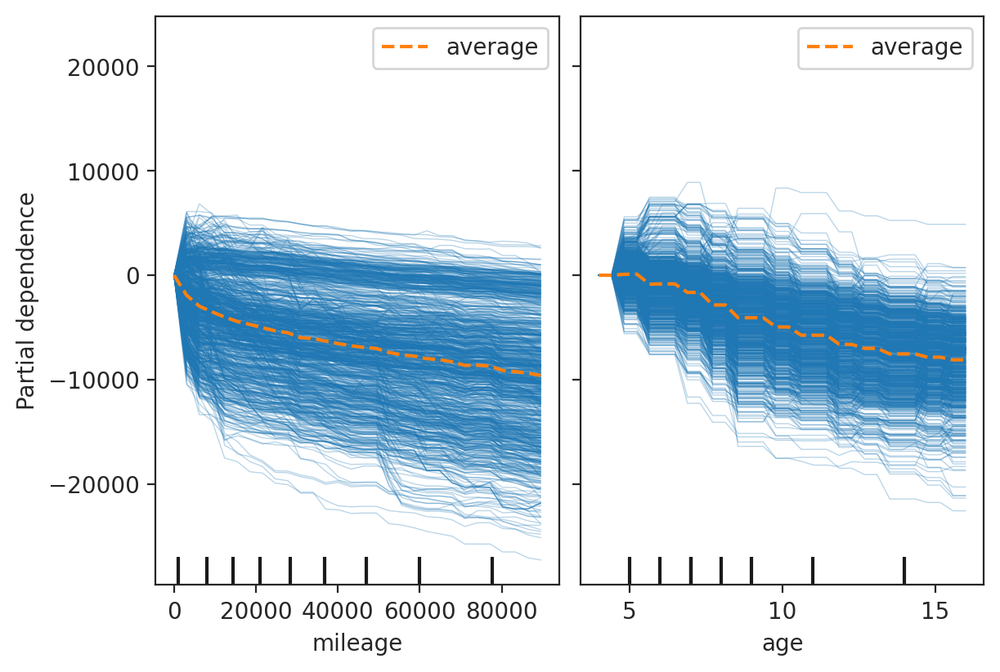

In [ ]:
fig, ax = plt.subplots(figsize=(6,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    best_gbr_pipe, X_test, features=['mileage', 'age'],
    kind='both', centered=True,
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

###Ensemble PDP Plot

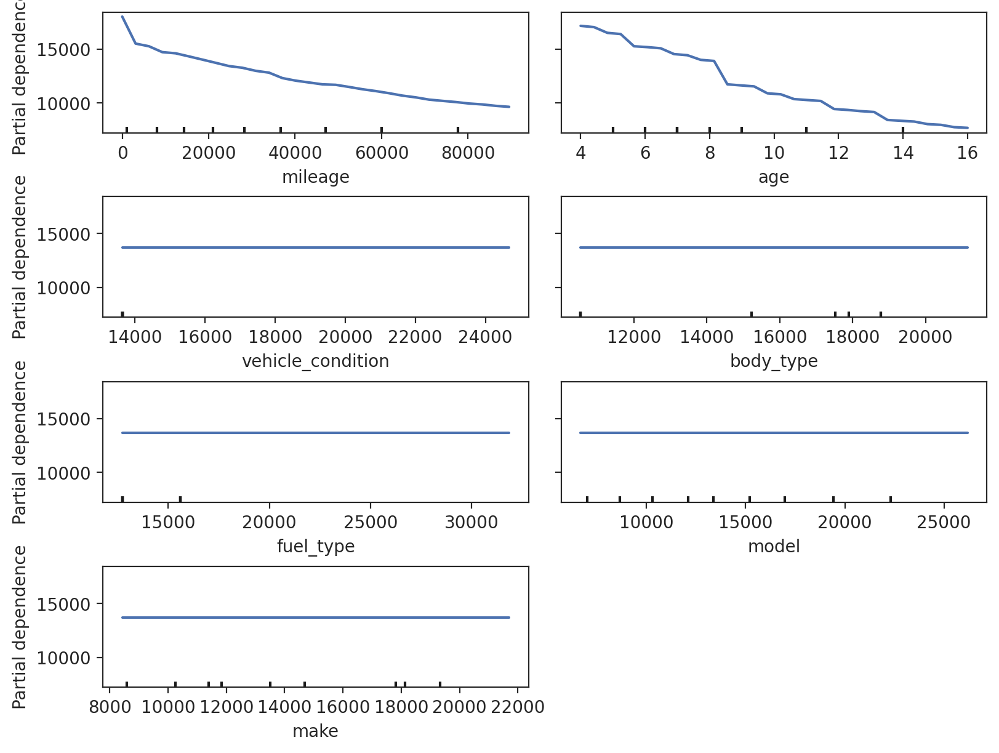

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    ensemble, X_test_pp_gbr, features=['mileage', 'age', 'vehicle_condition', 'body_type', 'fuel_type', 'model', 'make'],
    kind='average',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

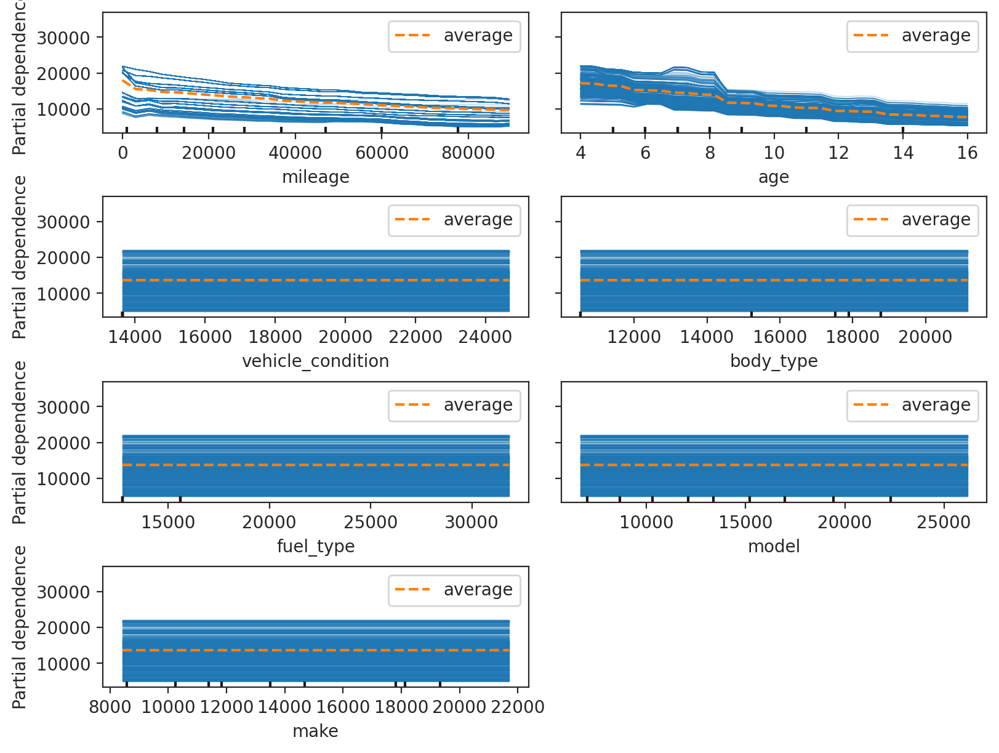

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    ensemble, X_test_pp_gbr, features=['mileage', 'age', 'vehicle_condition', 'body_type', 'fuel_type', 'model', 'make'],
    kind='both',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

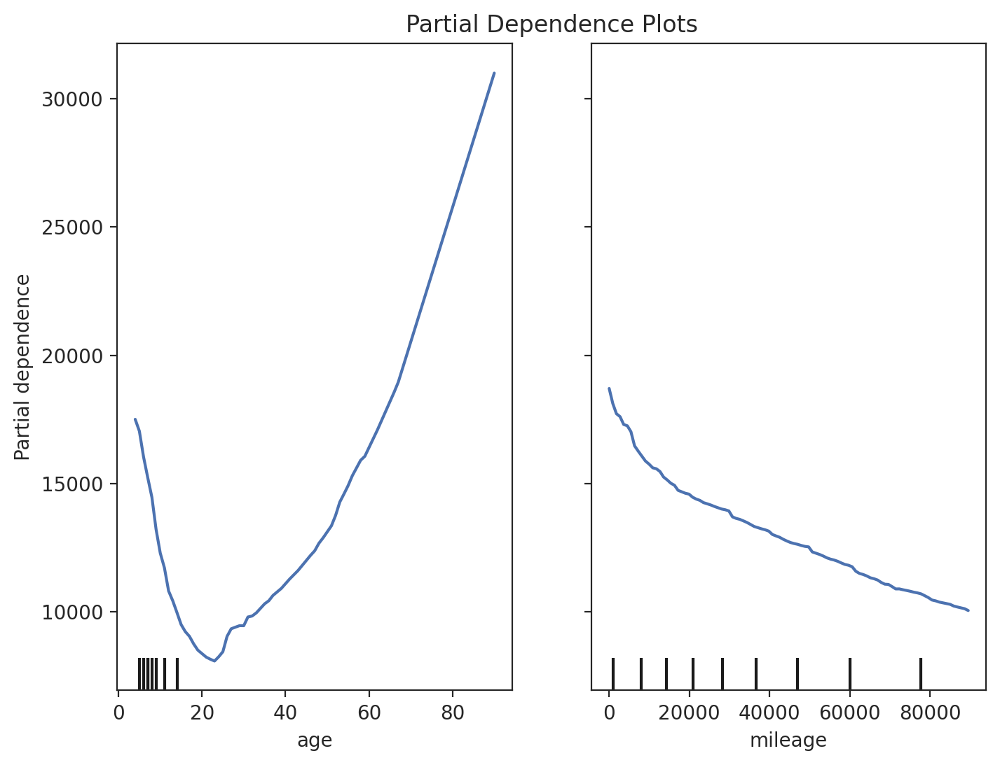

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
ax.set_title("Partial Dependence Plots")
PartialDependenceDisplay.from_estimator(
    estimator=ensemble,
    X=X_test,
    features=('age', 'mileage'), # the features to plot
    random_state=5,
    ax=ax,
)
plt.show()

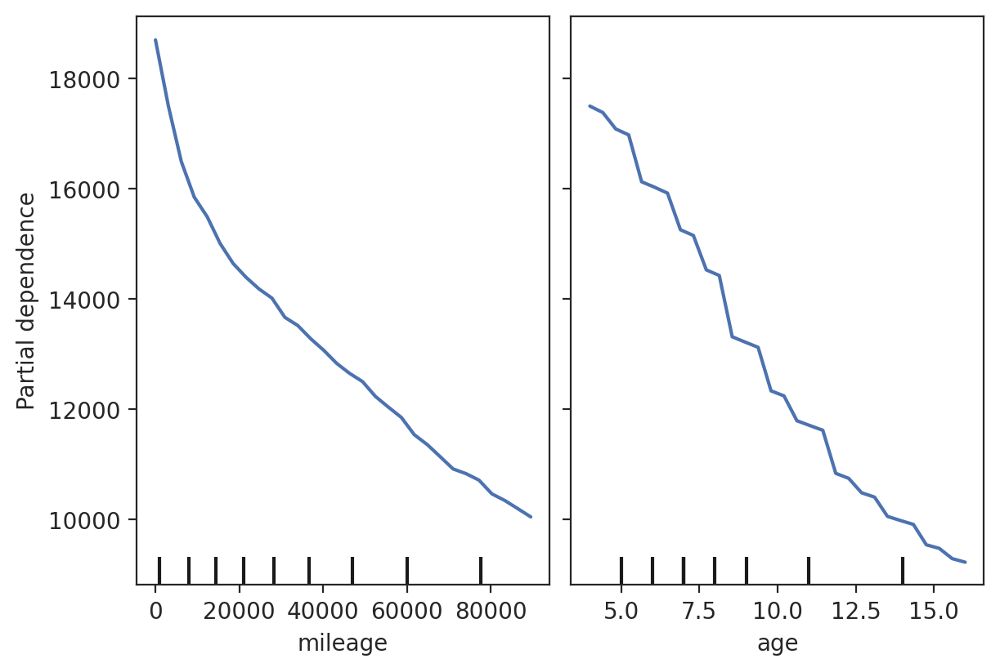

In [ ]:
fig, ax = plt.subplots (constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    ensemble, X_test, features=['mileage', 'age'],
    kind='average',
     grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

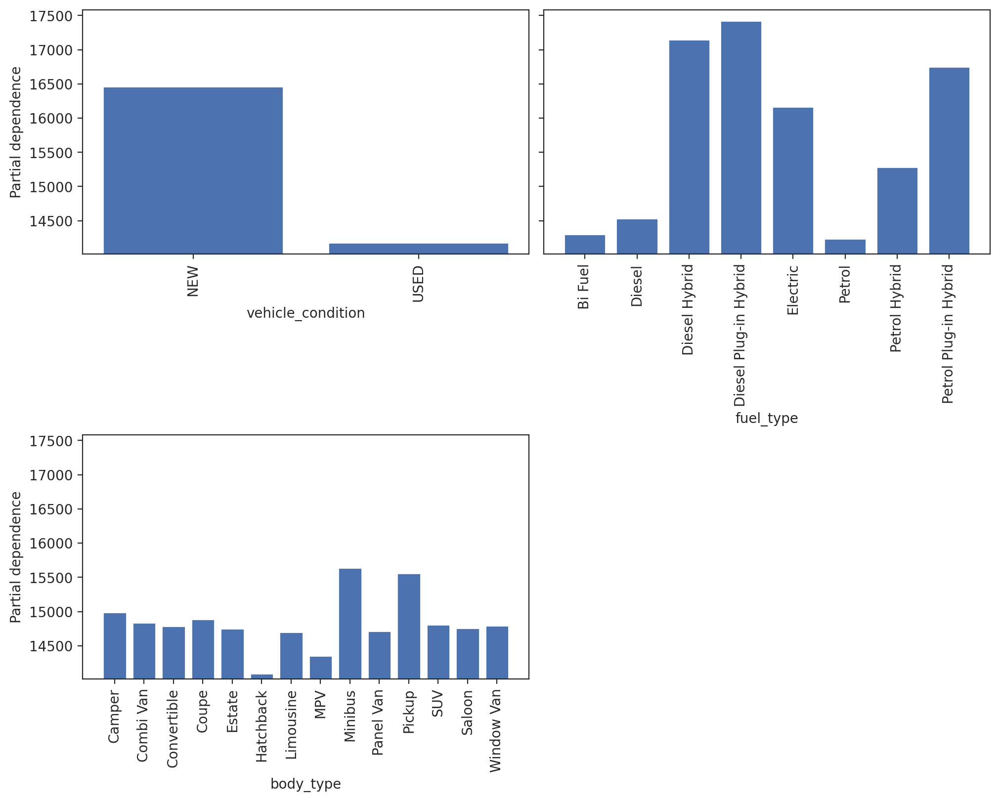

In [ ]:
fig, ax = plt.subplots(figsize=(10,8), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    ensemble, X_test, features=['vehicle_condition', 'fuel_type', 'body_type'],
    categorical_features=['vehicle_condition', 'fuel_type', 'body_type'],
    kind='average', ax=ax, n_cols=2
);

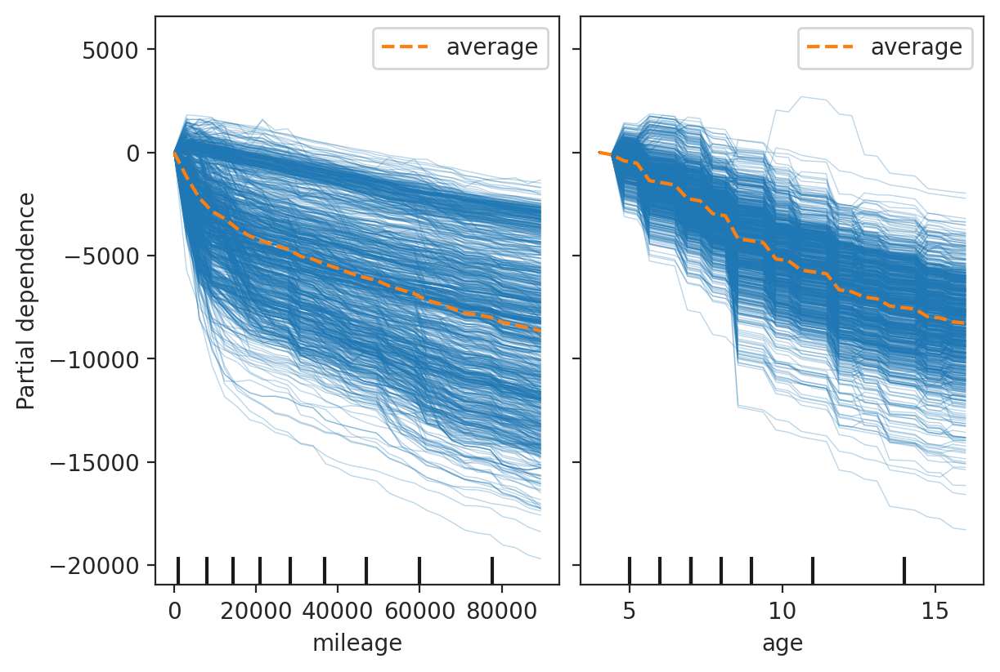

In [ ]:
fig, ax = plt.subplots(figsize=(6,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    ensemble, X_test, features=['mileage', 'age'],
    kind='both', centered=True,
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

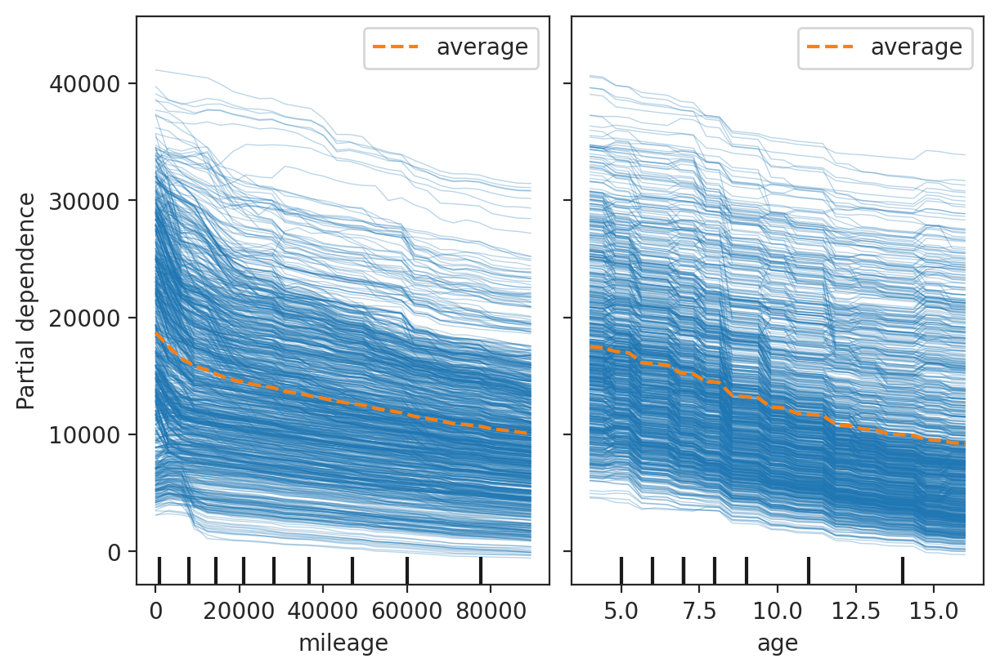

In [ ]:
fig, ax = plt.subplots (constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    ensemble, X_test, features=['mileage', 'age'],
    kind='both',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

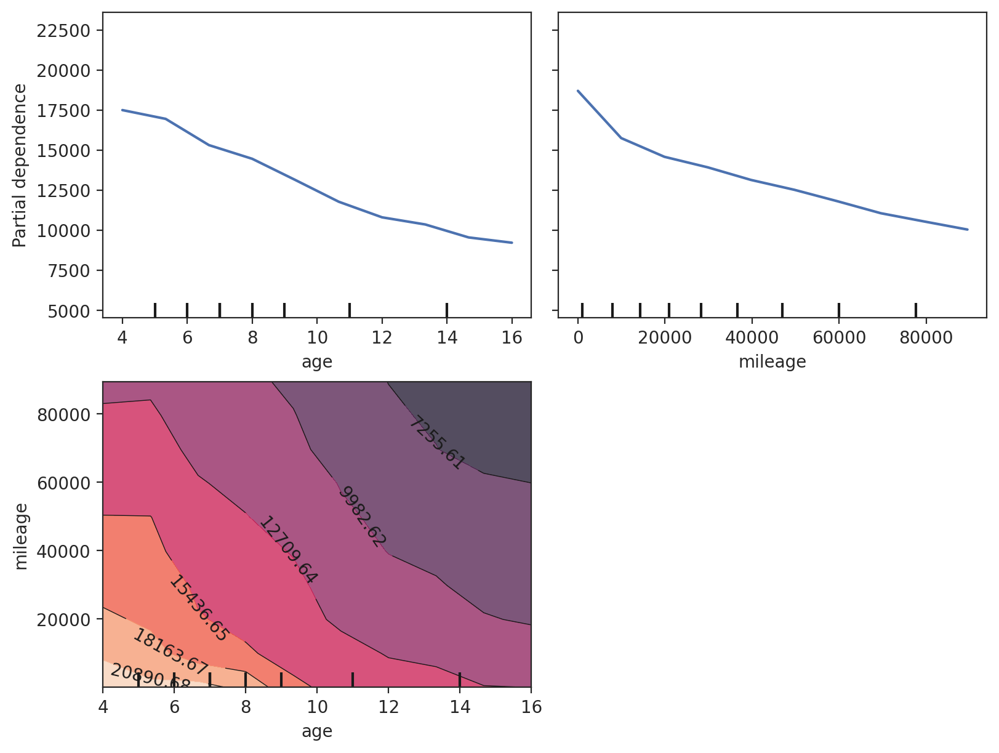

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
  ensemble, X_test, features=['age', 'mileage', ('age', 'mileage')],
    kind='average',
    subsample=1000, grid_resolution=10, random_state=0,
    ax=ax, n_cols=2
);

###Linear Regression PDP Plot

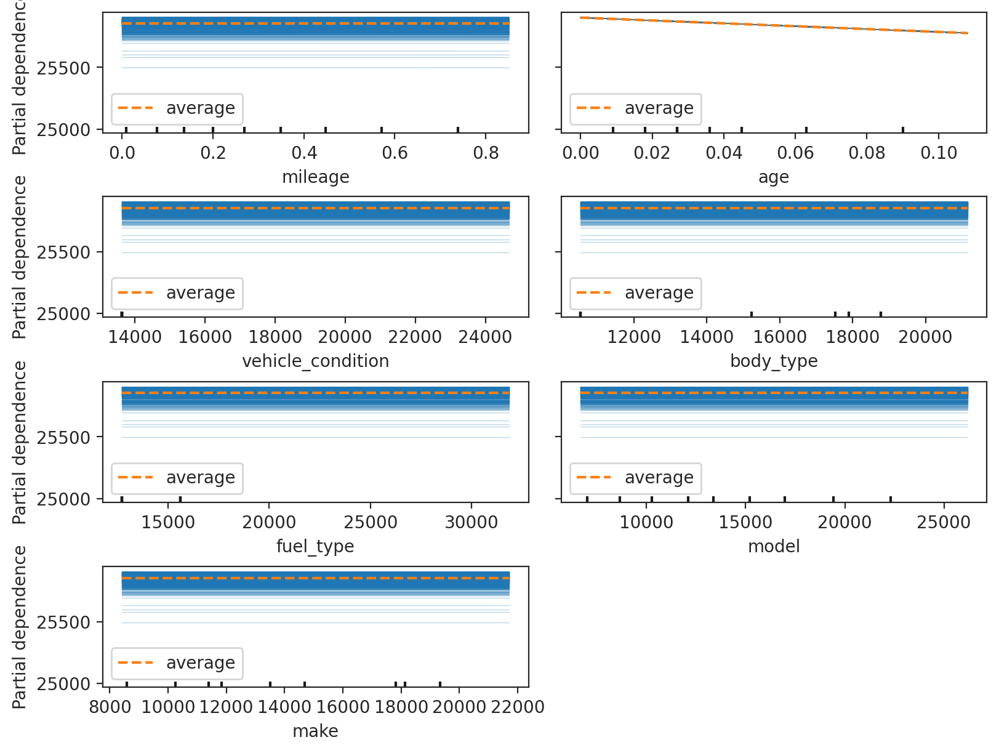

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    lr_regr, X_test_pp_lr, features=['mileage', 'age', 'vehicle_condition', 'body_type', 'fuel_type', 'model', 'make'],
    kind='both',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

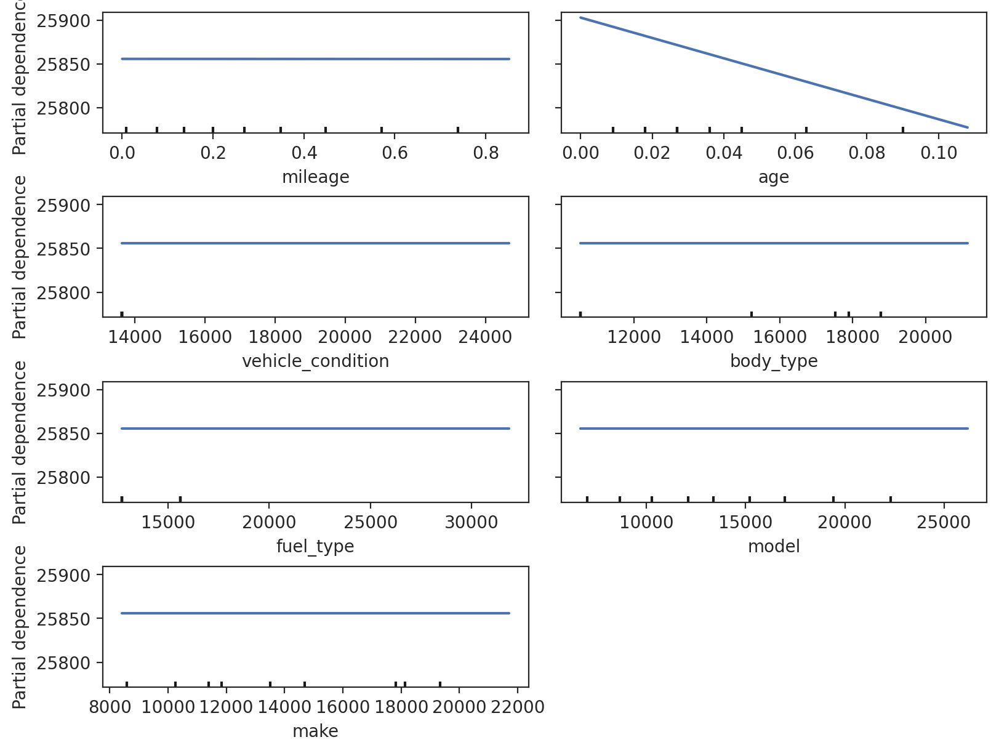

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    lr_regr, X_test_pp_lr, features=['mileage', 'age', 'vehicle_condition', 'body_type', 'fuel_type', 'model', 'make'],
    kind='average',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

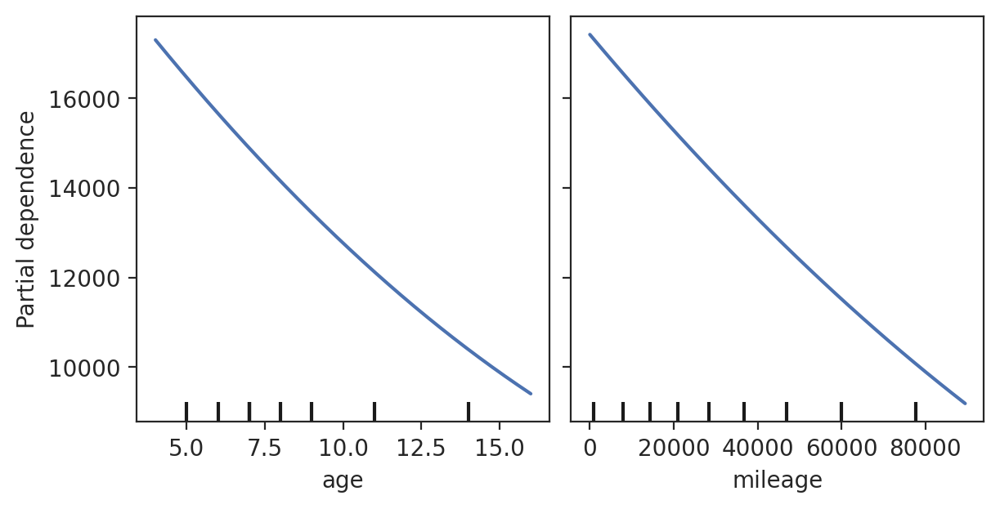

In [ ]:
fig, ax = plt.subplots(figsize=(6,3), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    lr_regr, X_test, features=['age', 'mileage'],
    kind='average',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

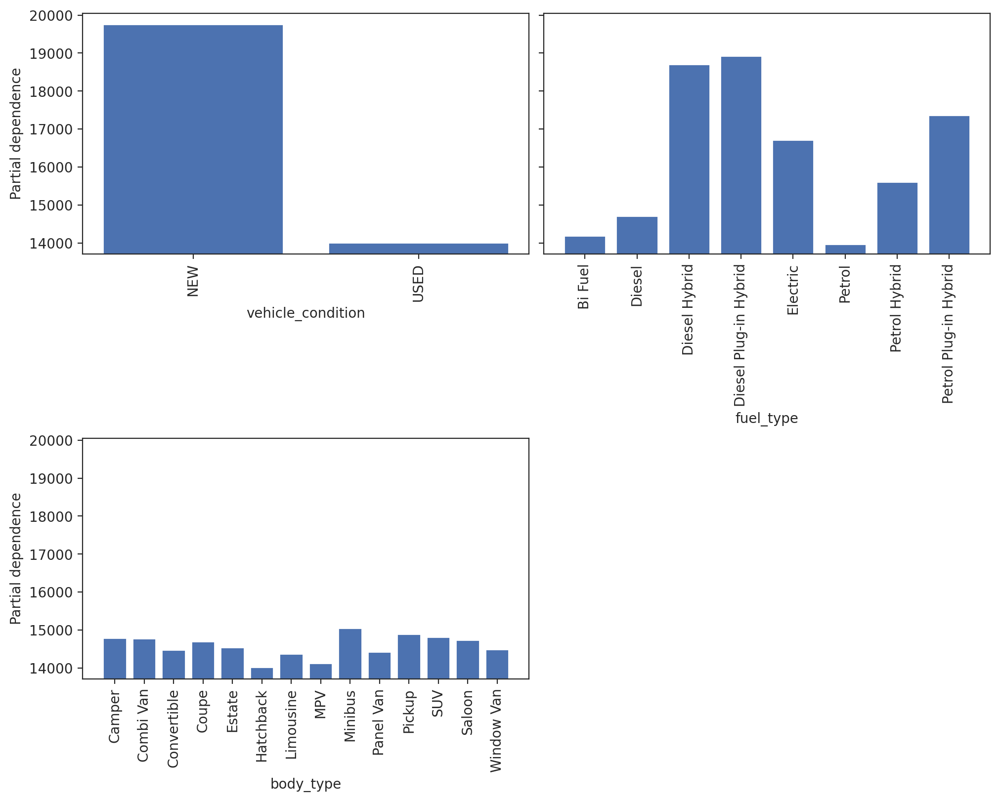

In [ ]:
fig, ax = plt.subplots(figsize=(10,8), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    lr_regr, X_test, features=['vehicle_condition', 'fuel_type', 'body_type'],
    categorical_features=['vehicle_condition', 'fuel_type', 'body_type'],
    kind='average', ax=ax, n_cols=2
);

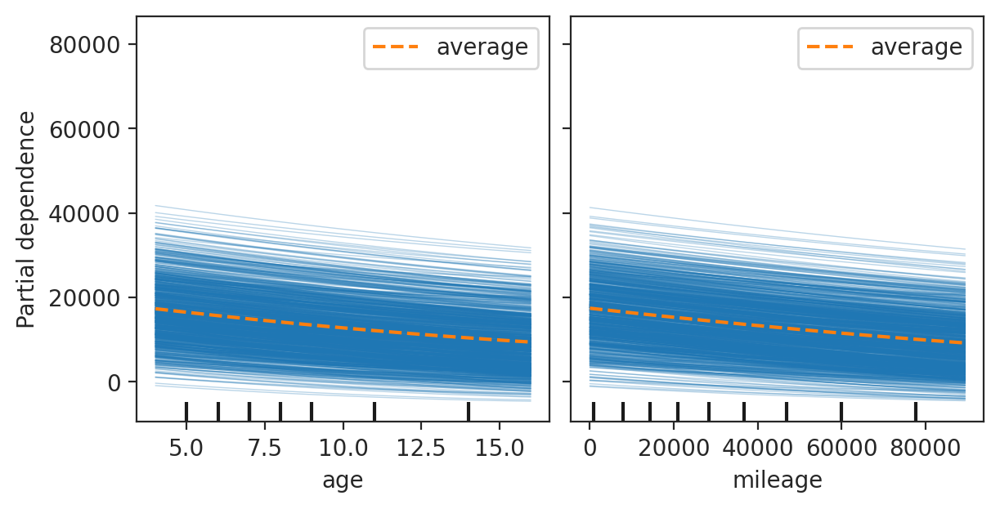

In [ ]:
fig, ax = plt.subplots(figsize=(6,3), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    lr_regr, X_test, features=['age', 'mileage'],
    kind='both',
    subsample=1000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

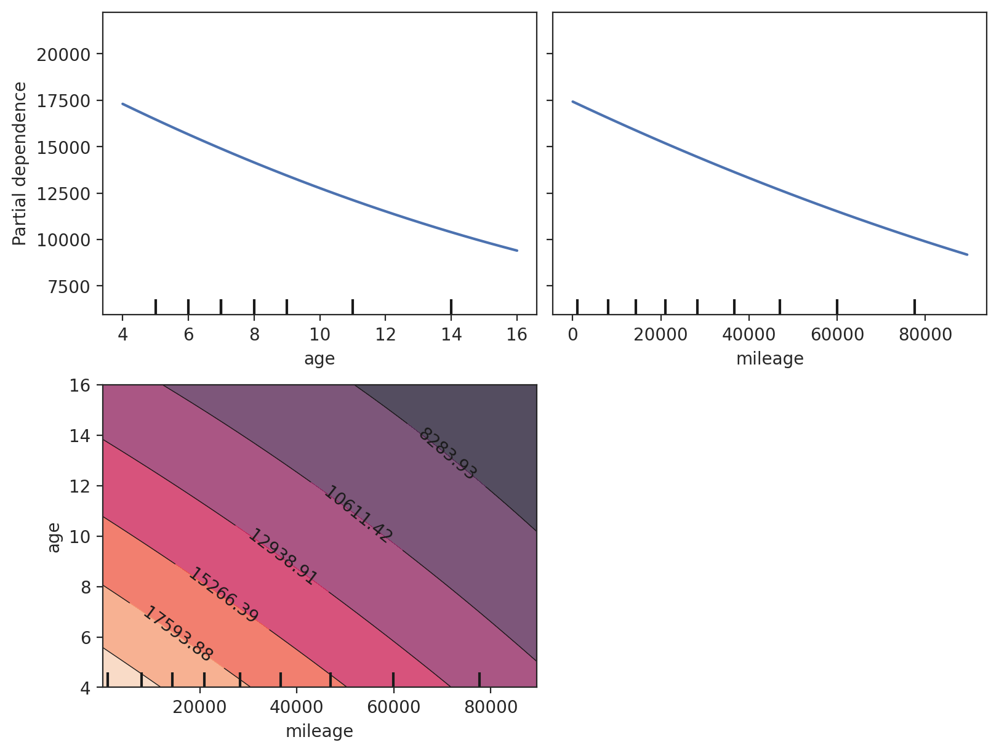

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    lr_regr, X_test, features=['age', 'mileage', ('mileage', 'age')],
    kind='average',
    subsample=1000, grid_resolution=30, random_state=0,
    ax=ax, n_cols=2
)